# Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
import time
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout

seed = 0 # Setting seed for consistent results
np.random.seed(seed)
tf.random.set_seed(seed)

# Loading and Visualizing Data

In [2]:
def get_path(file_ext = 'csv', update = ''): 
    '''
    Function: To get the paths of all datasets
    
    file_ext = File Extension of the Data File
    update = String containing the update parameter

    returns:
    folders: dictionary with keys as company/dataset name and values as file location
    '''
    folders = {
        'Cognizant': 'Datasets/Cognizant Share Prices 2019_2021' + update + '.' + file_ext,
        'HCL Technologies': 'Datasets/HCL Technologies Share Prices 2019_2021' + update + '.' + file_ext,
        'HDFC Bank': 'Datasets/HDFC Bank Share Prices 2019_2021' + update + '.' + file_ext,
        'ICICI Bank': 'Datasets/ICICI Bank Share Prices 2019_2021' + update + '.' + file_ext,
        'Infosys': 'Datasets/Infosys Share Prices 2019_2021' + update + '.' + file_ext,
        'SBI': 'Datasets/SBI Share Prices 2019_2021' + update + '.' + file_ext,
        'USD-INR Exchange Rate': 'Datasets/USD-INR Exchange Rate 2019_2021' + update + '.' + file_ext
    }
    return folders

def import_data(folder, file_ext='csv', update = ''):
    '''
    Function: To import data for a given dataset
    
    file_ext = File Extension of the Data File
    update = String containing the update parameter
    folder = folder/dataset name

    returns:
    data: dataset as Pandas Dataframe
    '''
    folders = get_path(file_ext, update)
    if file_ext == 'xlsx':
        data = pd.read_excel(folders[folder])
    else:
        data = pd.read_csv(folders[folder])
    return data

folders = get_path() # Importing dictionary of all datasets and their locations

In [4]:
def fill_entire_missing_data(df):
    '''
    Function: To fill missing data of all columns for a given dataset
    
    df: Dataset
    '''
    cols = list(df.columns)
    cols.pop(0)
    for col in cols:
        fill_missing_data(df, col)

def fill_missing_data(df, col):
    '''
    Function: To fill missing data of a particular column for a given dataset
    
    df: Dataset
    col: Column name
    '''
    i, ind = 0, 0
    start, start_idx = [], []
    end, end_idx = [], []
    while i < len(df[col]):
        if pd.isna(df[col][i]):
            if pd.isna(df[col][i-1]) == False:
                start.append(df[col][i-1])
                start_idx.append(i-1)
                ind = 1
        elif ind == 1:
            end.append(df[col][i])
            end_idx.append(i)
            ind = 2
        i += 1
        
    for i in range(len(start)):
        slope = (end[i] - start[i])/(end_idx[i] - start_idx[i])
        for idx in range(start_idx[i]+1, end_idx[i]):
            df.loc[idx, col] = slope*(idx - start_idx[i]) + start[i]

def fill_all_datasets():
    '''
    Function: To fill missing values in all datasets
    '''
    folders = get_path('xlsx')
    for dataset, path in folders.items():
        print(f"Working on {dataset} Dataset...")
        data = import_data(dataset)
        fill_entire_missing_data(data)
        save_data(data, path)
        print(f"Saved filled {dataset} Dataset at this location: {path}.\n")

def save_data(df, path):
    '''
    Function: To save dataset as excel file
    
    df: Dataset
    path: path/location where the data has to be stored
    '''
    df.to_excel(path, index=False)

In [5]:
fill_all_datasets()

Working on Cognizant Dataset...
Saved filled Cognizant Dataset at this location: Datasets/Cognizant Share Prices 2019_2021.xlsx.

Working on HCL Technologies Dataset...
Saved filled HCL Technologies Dataset at this location: Datasets/HCL Technologies Share Prices 2019_2021.xlsx.

Working on HDFC Bank Dataset...
Saved filled HDFC Bank Dataset at this location: Datasets/HDFC Bank Share Prices 2019_2021.xlsx.

Working on ICICI Bank Dataset...
Saved filled ICICI Bank Dataset at this location: Datasets/ICICI Bank Share Prices 2019_2021.xlsx.

Working on Infosys Dataset...
Saved filled Infosys Dataset at this location: Datasets/Infosys Share Prices 2019_2021.xlsx.

Working on SBI Dataset...
Saved filled SBI Dataset at this location: Datasets/SBI Share Prices 2019_2021.xlsx.

Working on USD-INR Exchange Rate Dataset...
Saved filled USD-INR Exchange Rate Dataset at this location: Datasets/USD-INR Exchange Rate 2019_2021.xlsx.



In [6]:
def get_title(folder):
    '''
    Function: To get the title to be used in plots when dataset name is given
    
    folder: Dataset name
    '''
    if folder[-1] == 's':
        return folder + '\''
    else:
        return folder + '\'s'

def get_label(col):
    '''
    Function: To give the label for a given column
    
    col: Column name

    returns: label of given column to be used in a plot
    '''
    label_dict = {
        'Open': 'Opening Price',
        'High': 'High Price',
        'Low': 'Low Price',
        'Close': 'Closing Price',
        'Volume': 'Volume',
        'Adj Close': 'Adjusted Closing Price',
    }
    return label_dict[col]

def get_color(col):
    '''
    Function: To give the color for a given column
    
    col: Column name

    returns: color of given column to be used in a plot
    '''
    color_dict = {
        'Open': 'blue',
        'High': 'green',
        'Low': 'red',
        'Close': 'magenta',
        'Volume': 'tab:orange',
        'Adj Close': 'tab:brown',
    }
    return color_dict[col]

def get_currency(folder):
    '''
    Function: To give the currency for a given folder/dataset
    
    folder: Folder name

    returns: currency of given folder/dataset to be used in a plot
    '''
    if folder == 'Cognizant':
        currency = '$'
    else:
        currency = u"\u20B9"
    return currency

def get_unit(folder, col):
    '''
    Function: To give the unit for a given column
    
    folder: Folder name
    col: Column name

    returns: unit of given column to be used in a plot
    '''
    currency = get_currency(folder)
    unit_dict = {
        'Open': f'(in {currency})',
        'High': f'(in {currency})',
        'Low': f'(in {currency})',
        'Close': f'(in {currency})',
        'Volume': '(in units)',
        'Adj Close': f'(in {currency})',
    }
    return unit_dict[col]

In [7]:
def label_generator(date, method = 'quarterly'):
    '''
    Function: Generates labels for dates
    
    date: date in string form
    method: method of generating labels, namely, quarterly, monthly

    returns: label of date
    '''
    yy, mm, dd = int(date[2:4]), int(date[5:7]), int(date[8:])
    month = {
        1: 'Jan',
        2: 'Feb',
        3: 'Mar',
        4: 'Apr',
        5: 'May',
        6: 'June',
        7: 'July',
        8: 'Aug',
        9: 'Sep',
        10: 'Oct',
        11: 'Nov',
        12: 'Dec'
    }
    if method == 'quarterly':
        month_list = [1, 4, 7, 10]
    elif method == 'monthly':
        month_list = [i for i in range(1, 13)]
    if mm in month_list:
        return month[mm] + ' ' + str(yy)
    else:
        return None

def date_label_generator(data, method='quarterly'):
    '''
    Function: To return indices and corresponding labels

    data: dataset
    method: method of generating labels, namely, quarterly, monthly

    returns: indices and labels of dates
    '''
    idx = []
    xlabels = []
    for i in range(data.shape[0]):
        op = label_generator(data.loc[i, 'Date'], method)
        if op and op not in xlabels:
            idx.append(i)
            xlabels.append(op)
    return [idx, xlabels]

In [8]:
def plot_shares(data, col, folder, save_fig=False):
    '''
    Function: To plot the shares for a particular column of given dataset

    data: dataset
    col: column name
    folder: folder name
    save_fig: indicator for choosing to save the plot
    '''
    plt.figure(figsize=(10,6))
    [idx, xlabels] = date_label_generator(data)
    data[col].plot(color = get_color(col))
    plt.xlabel("Date", fontsize=16)
    plt.ylabel(get_label(col) + ' ' + get_unit(folder, col), fontsize=16)
    plt.xticks(idx, xlabels, rotation=30, fontsize=14)
    plt.yticks(fontsize=14)
    title = get_title(folder) + ' ' + get_label(col)
    plt.title(title, fontsize=20)
    plt.grid(linestyle='--', linewidth=0.5)
    if save_fig:
        plt.savefig(folder + "/Original Data/" + title + ".png", bbox_inches="tight", dpi=500)

def visualize_data(folder, file_ext='xlsx', save_fig=False):
    '''
    Function: To plot the shares for a particular column of given dataset

    folder: folder name
    file_ext = extension of dataset source file
    save_fig: indicator for choosing to save the plot
    '''
    data = import_data(folder, file_ext)
    cols = list(data.columns)
    cols.pop(0)
    for col in cols:
        plot_shares(data, col, folder, save_fig=save_fig)

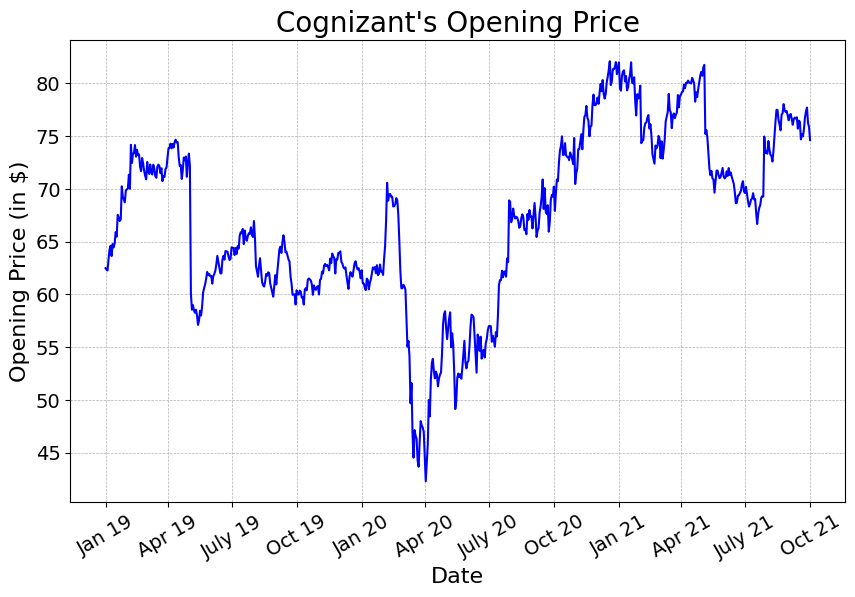

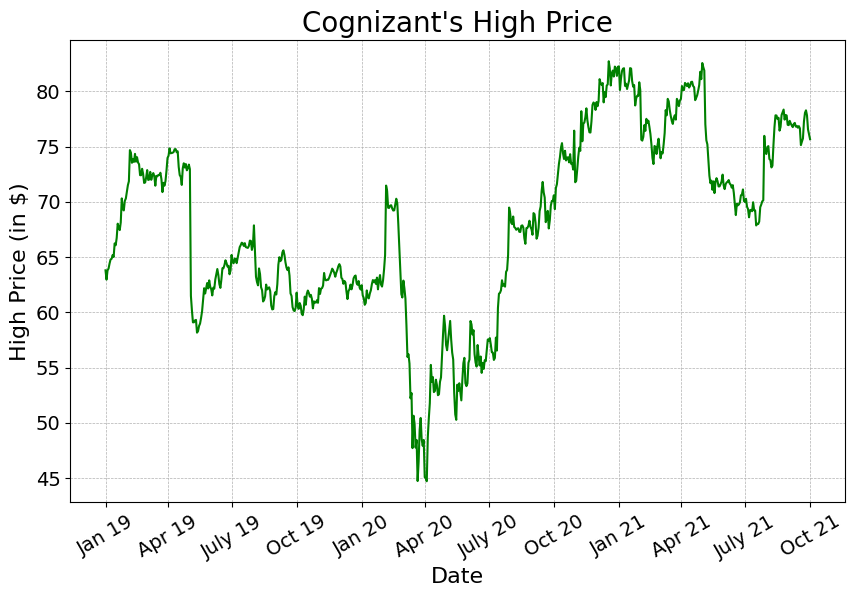

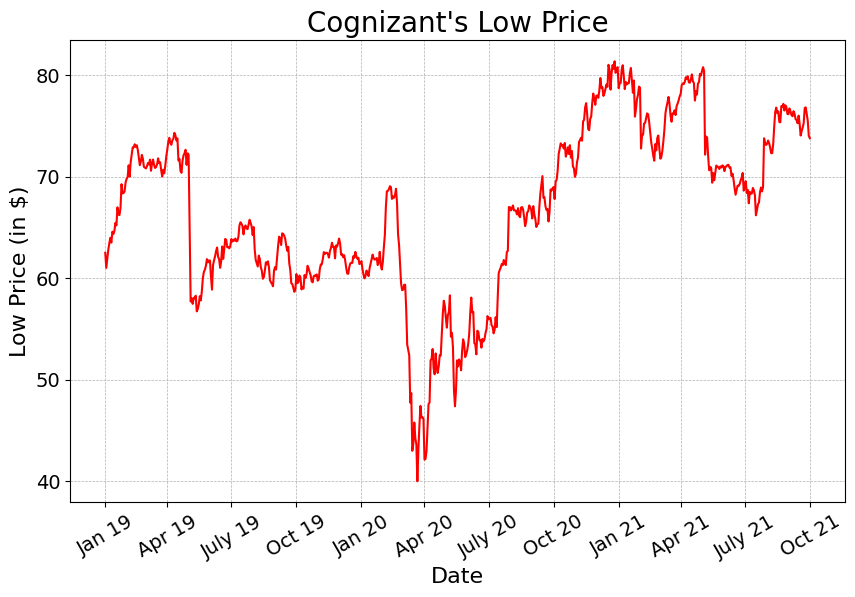

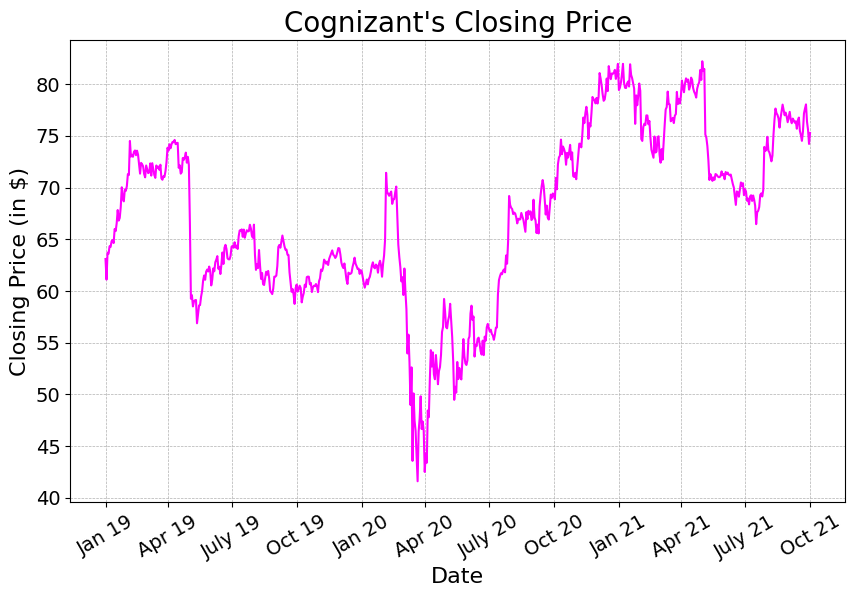

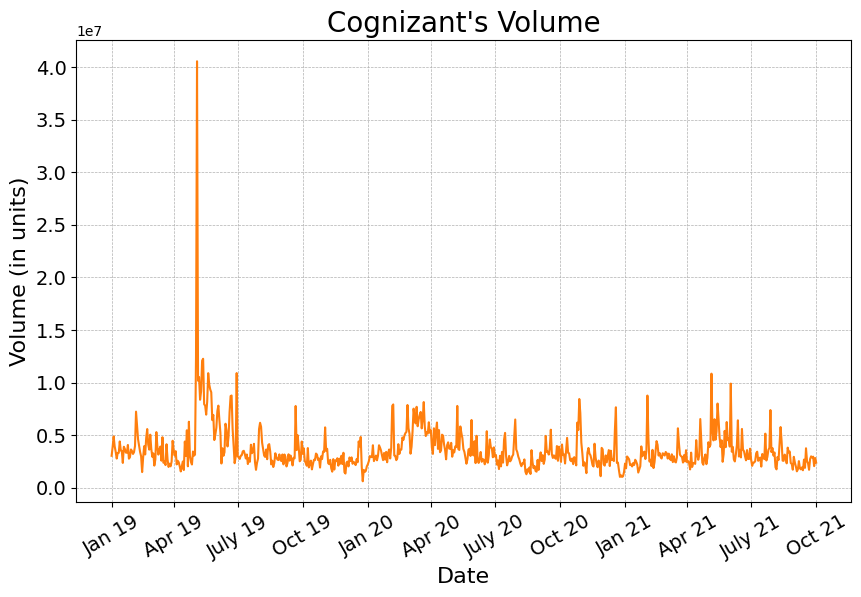

In [9]:
visualize_data('Cognizant', save_fig=True)

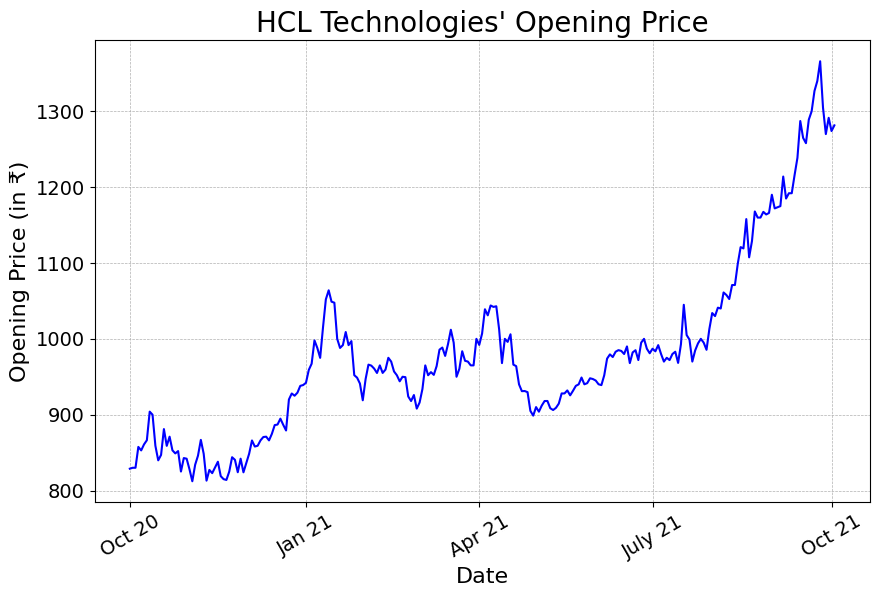

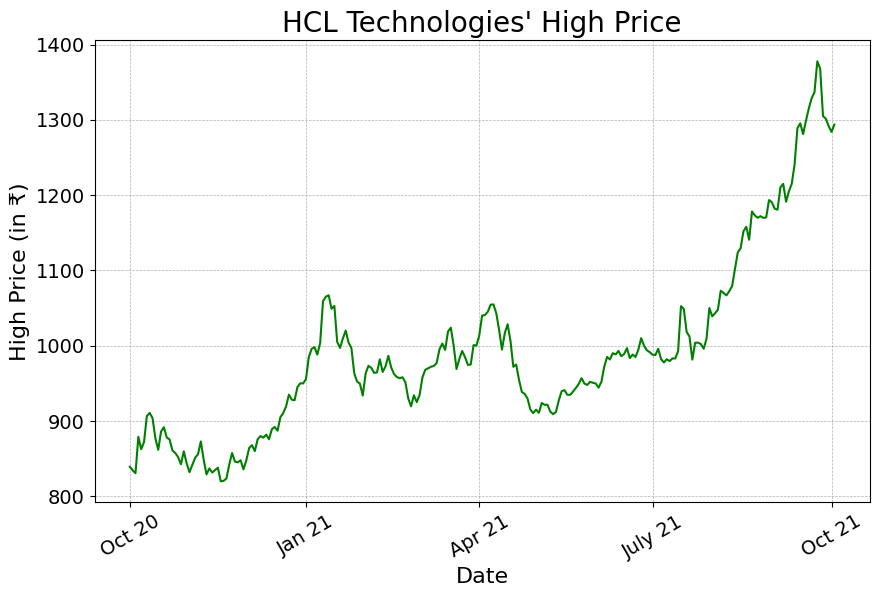

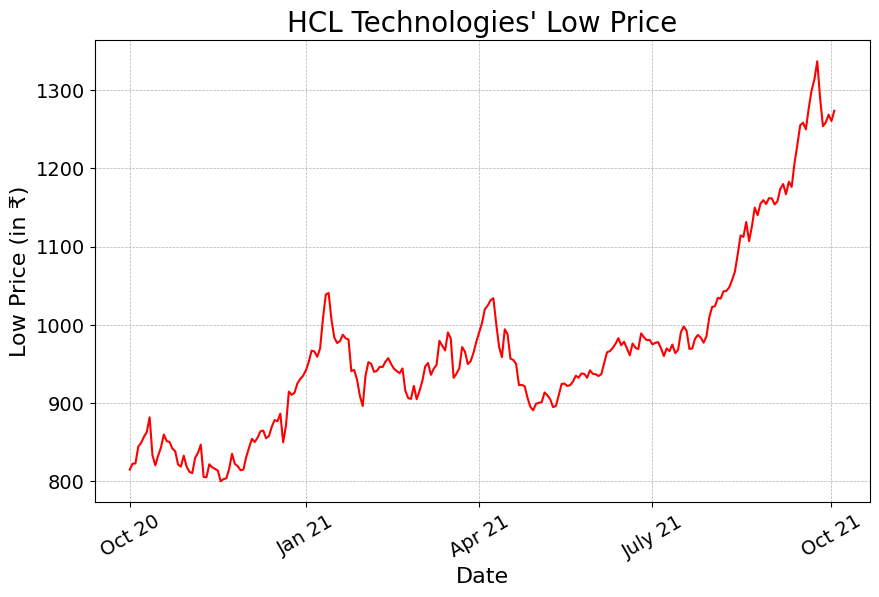

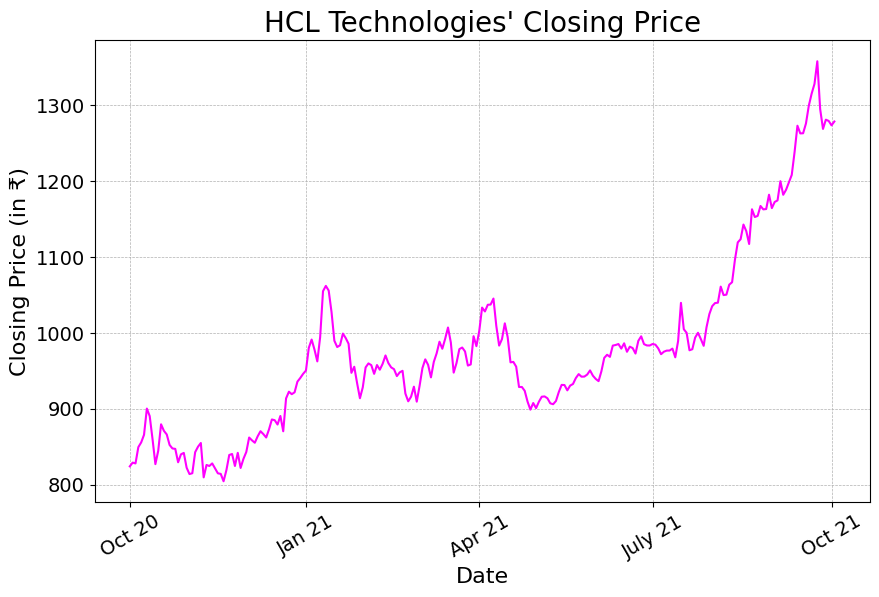

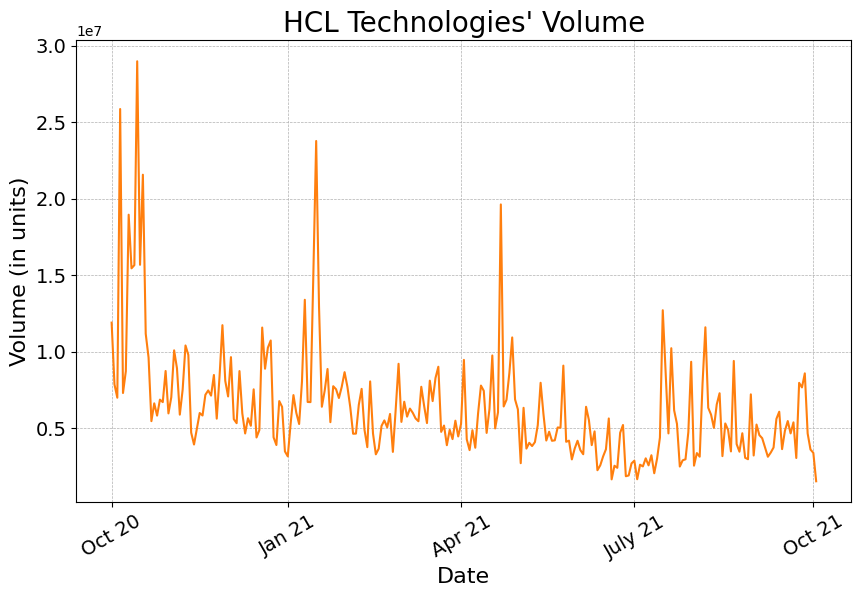

In [10]:
visualize_data('HCL Technologies', save_fig=True)

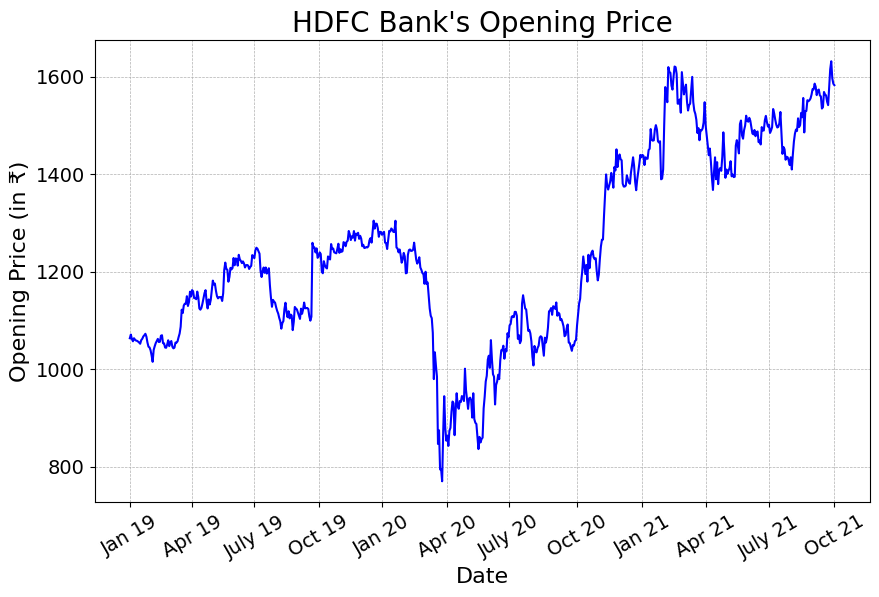

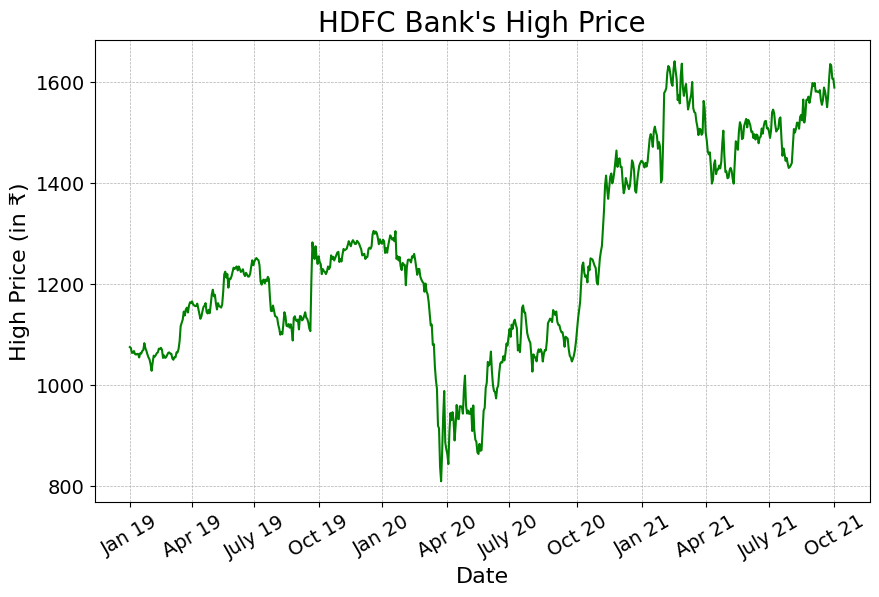

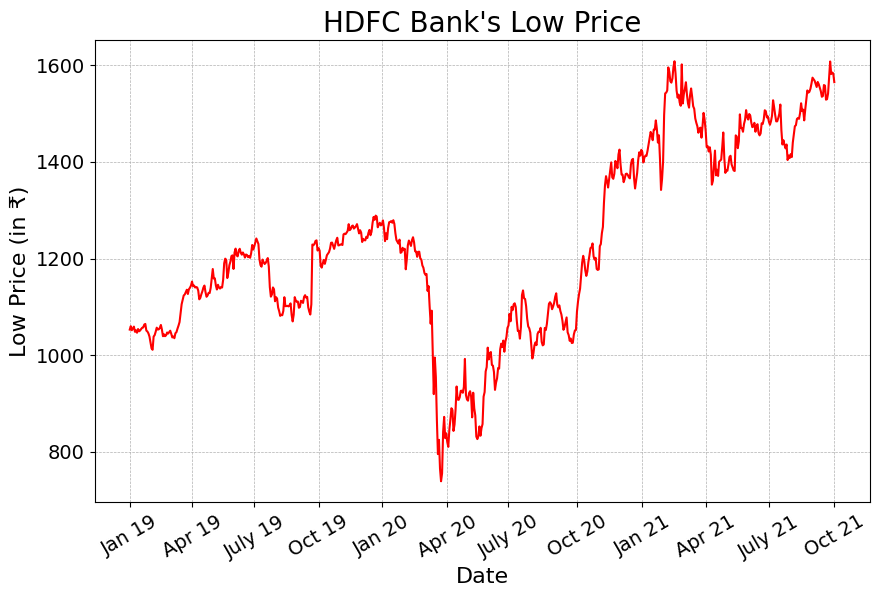

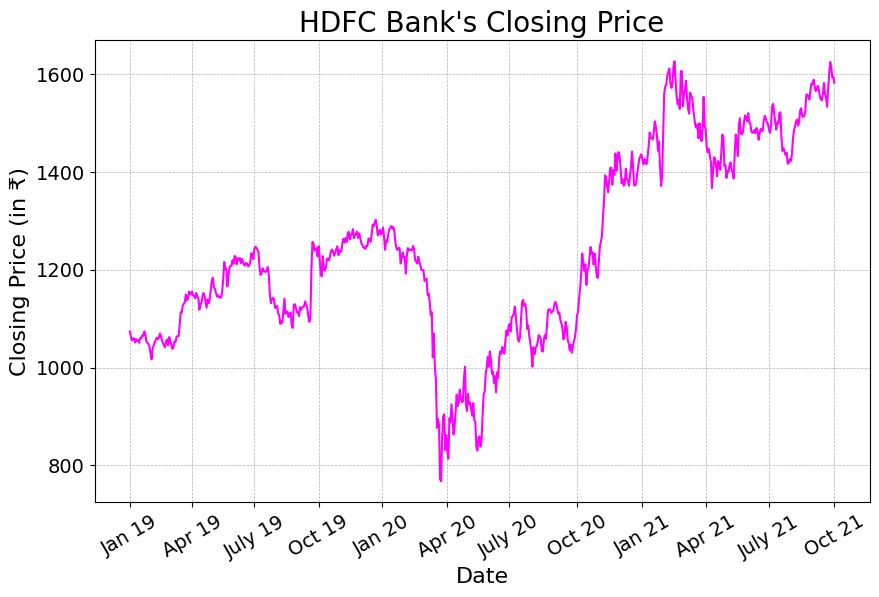

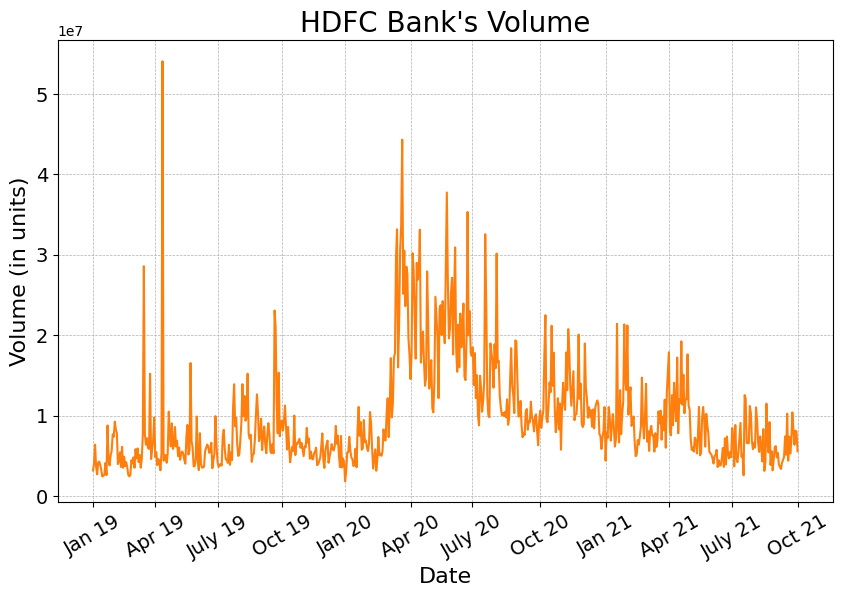

In [11]:
visualize_data('HDFC Bank', save_fig=True)

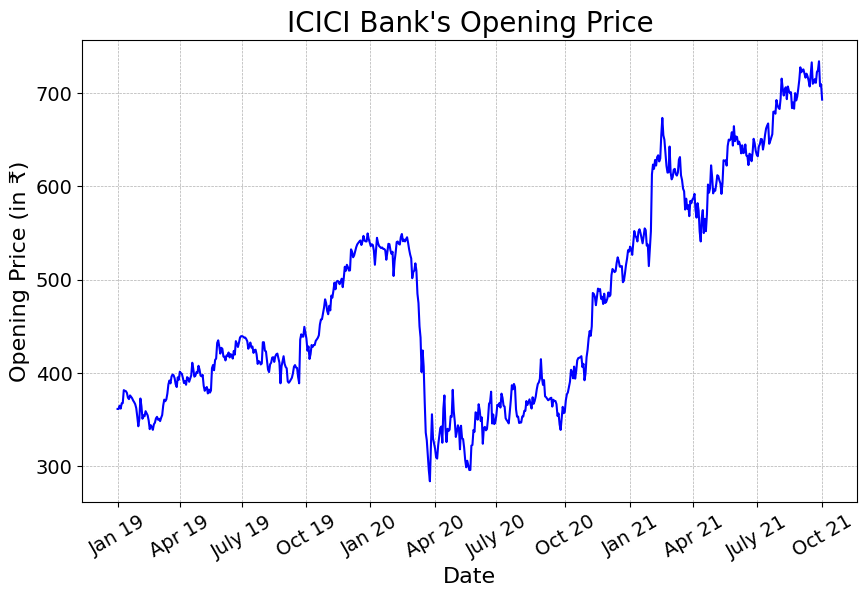

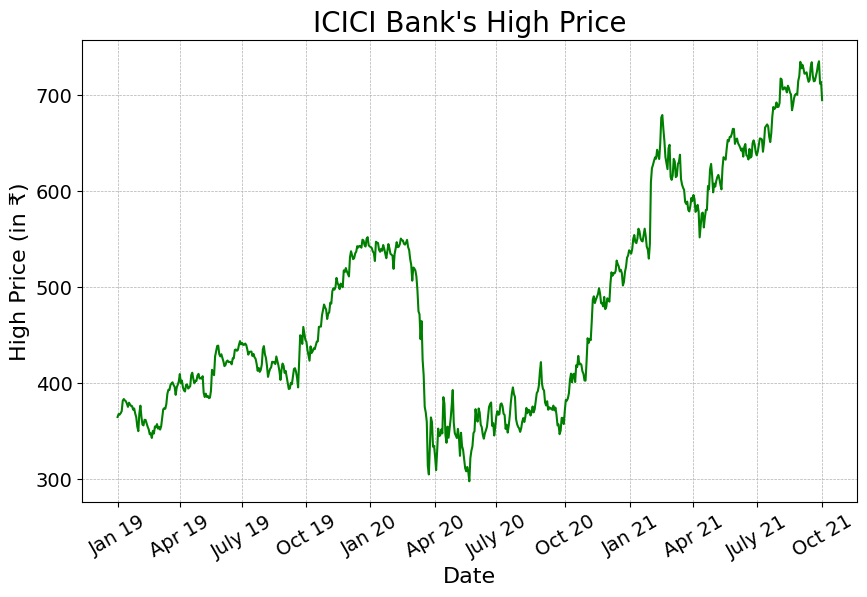

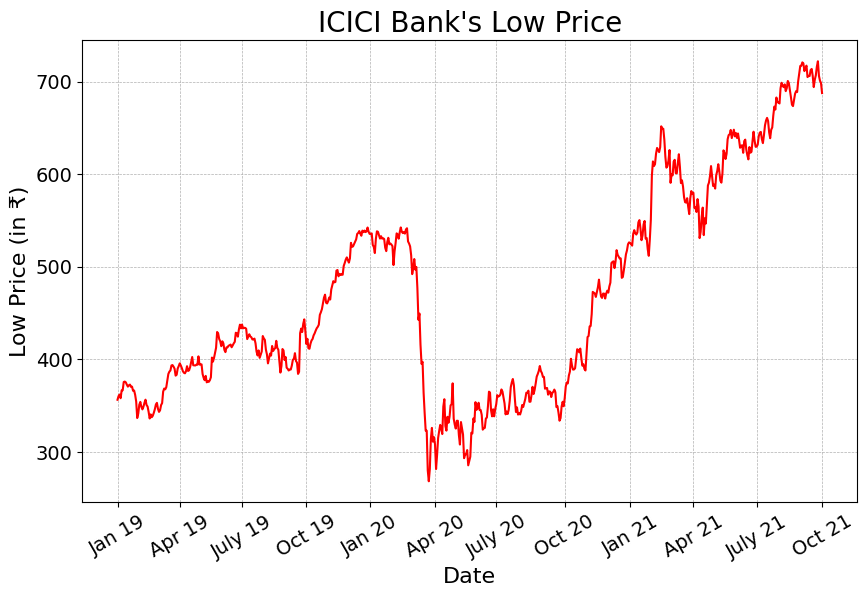

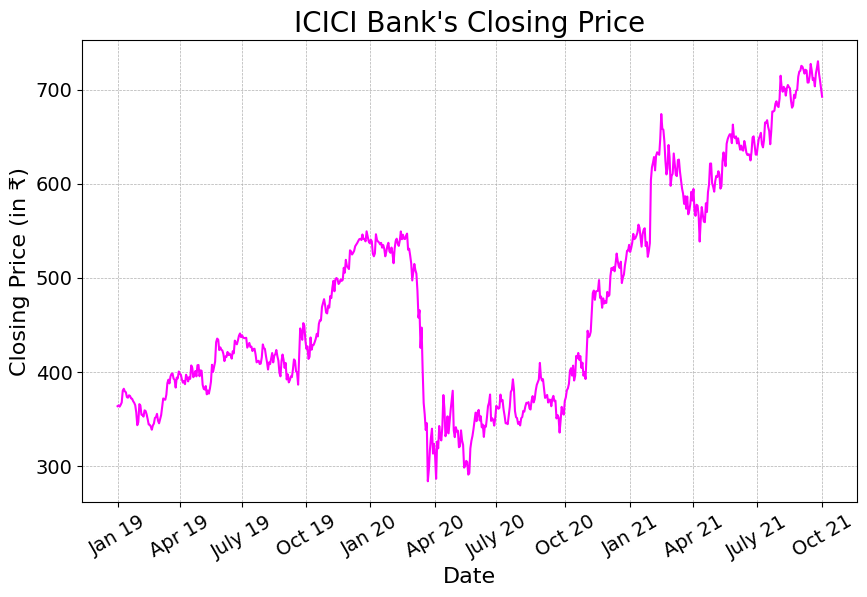

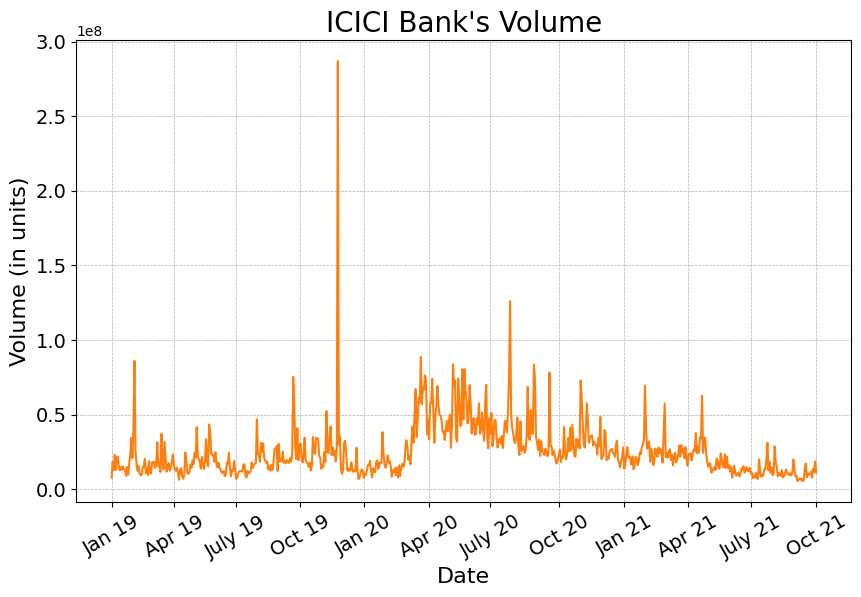

In [12]:
visualize_data('ICICI Bank', save_fig=True)

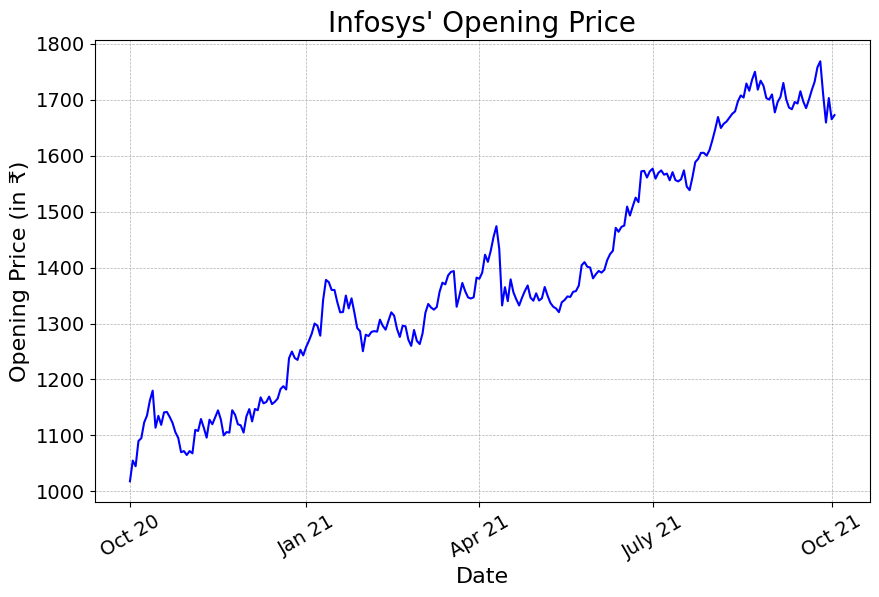

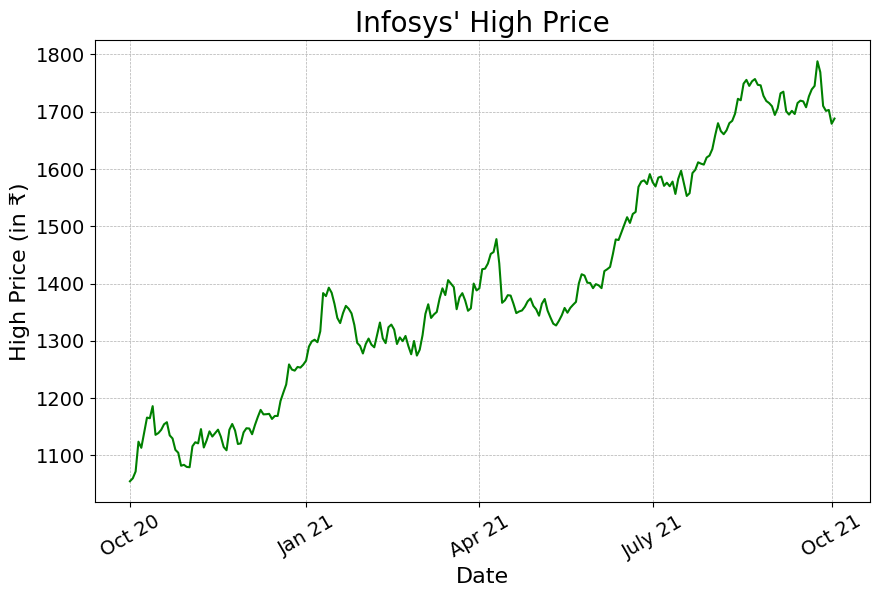

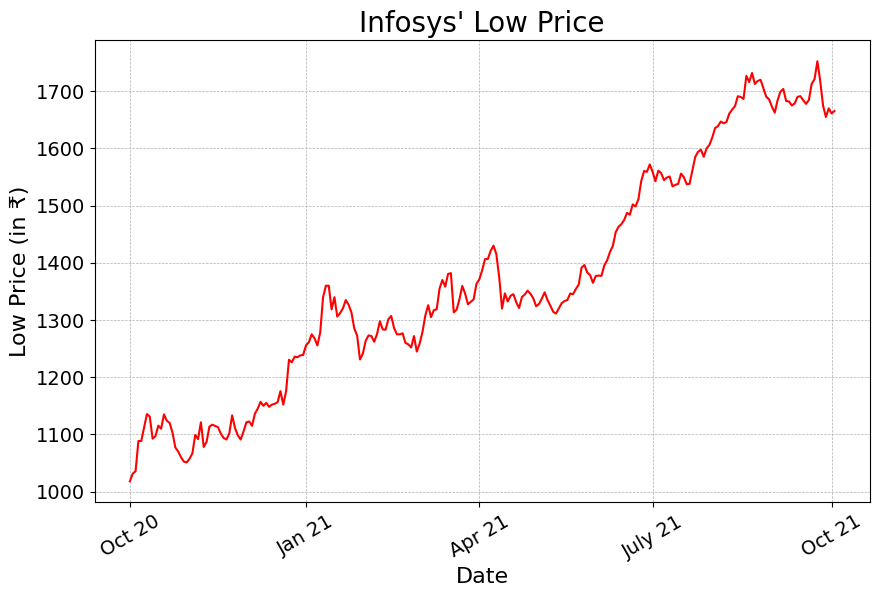

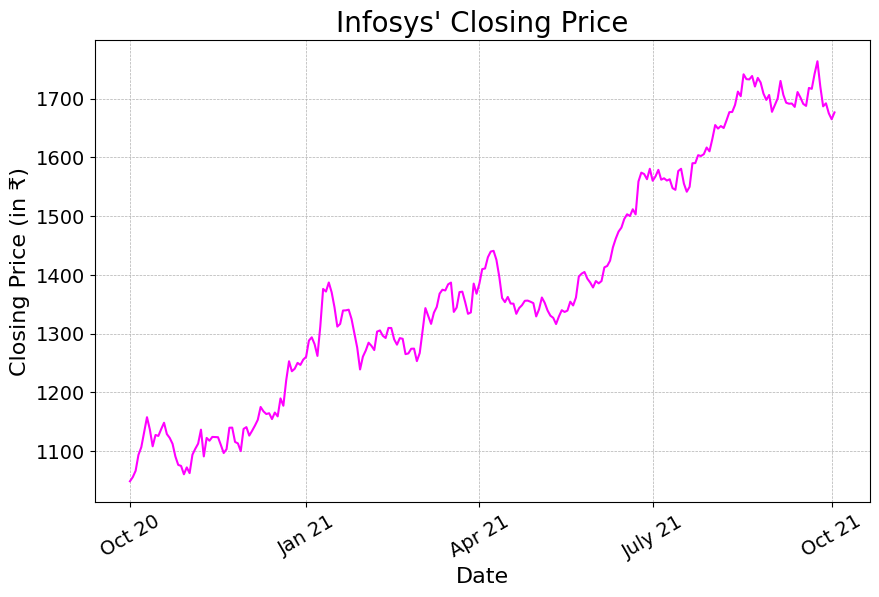

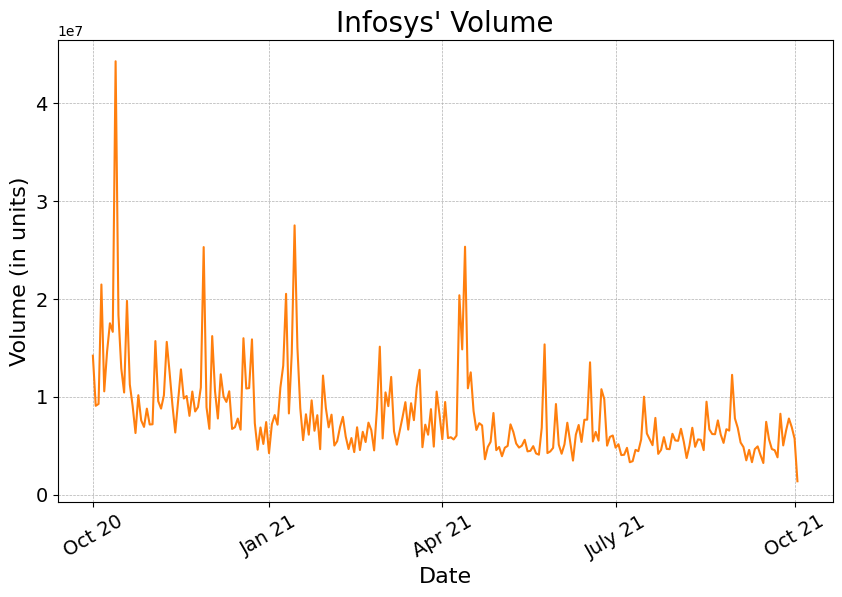

In [13]:
visualize_data('Infosys', save_fig=True)

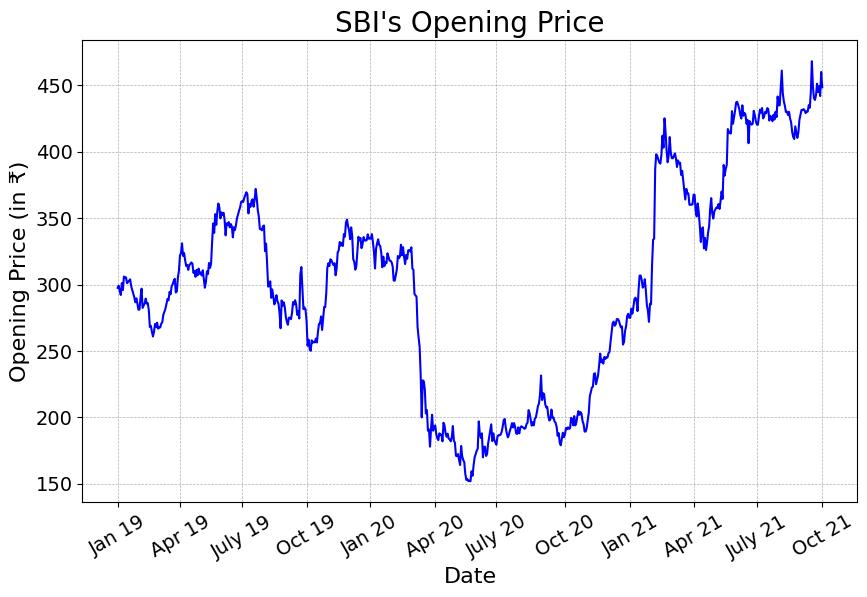

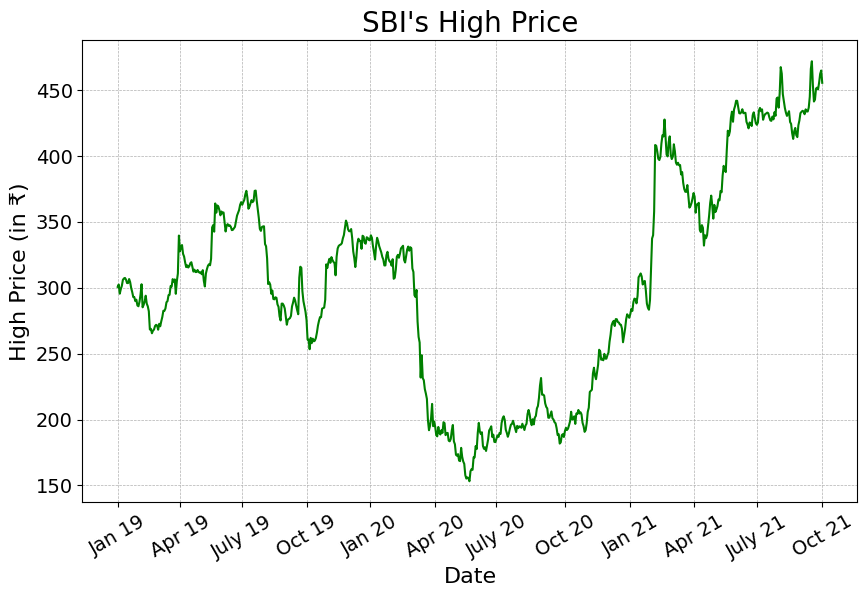

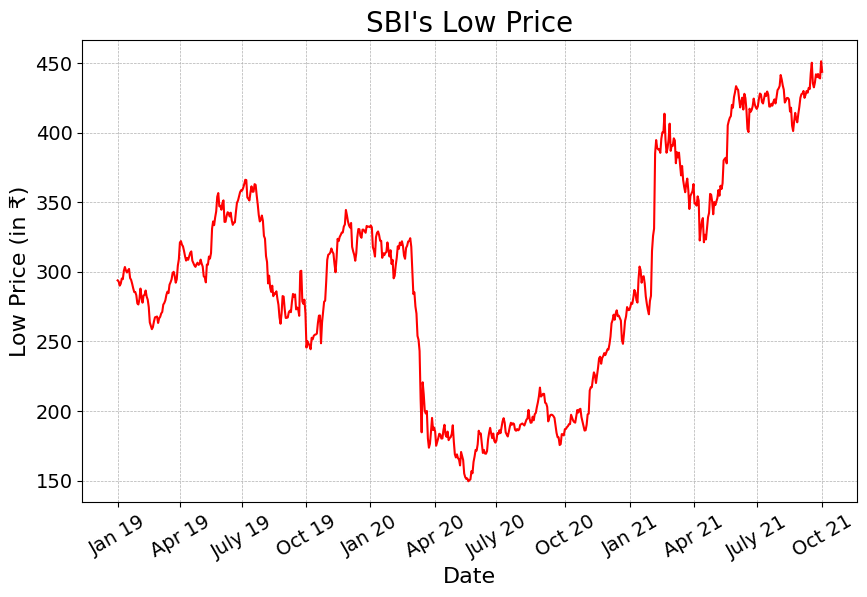

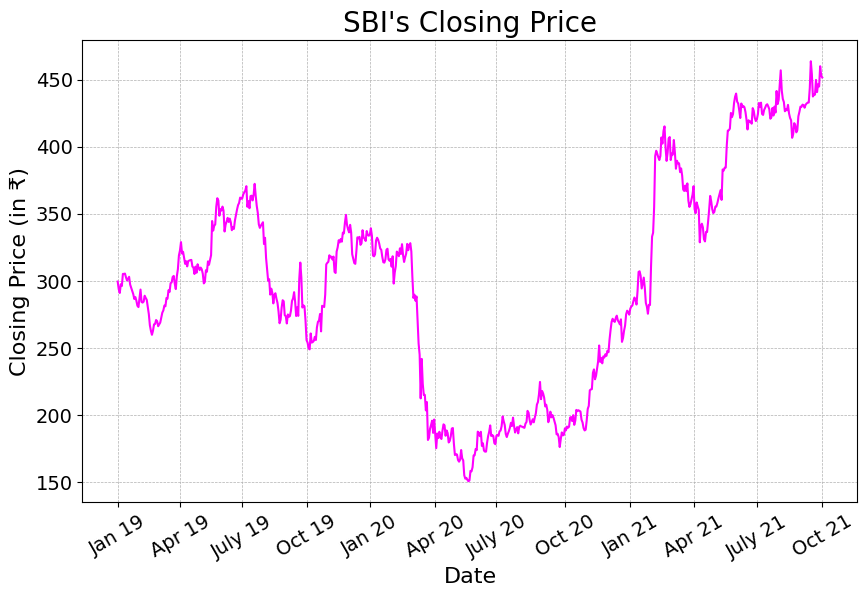

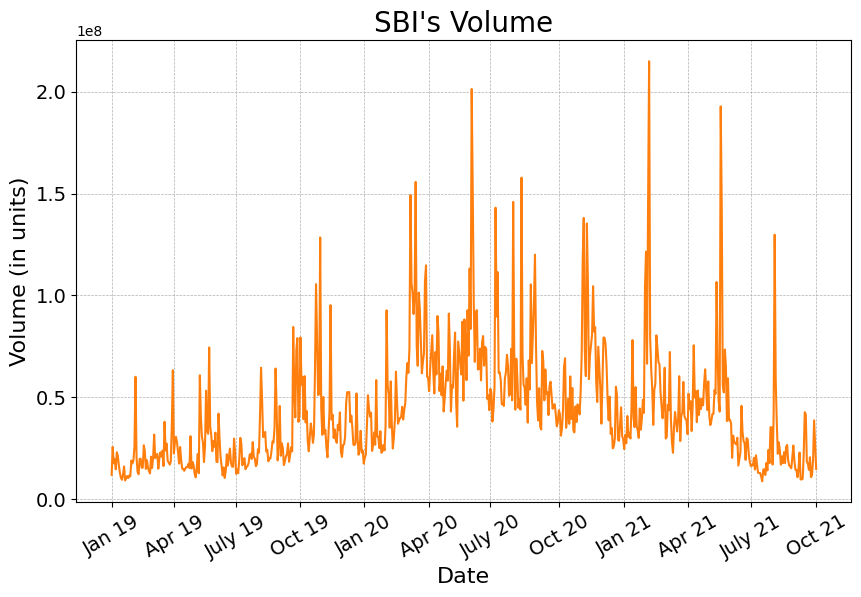

In [14]:
visualize_data('SBI', save_fig=True)

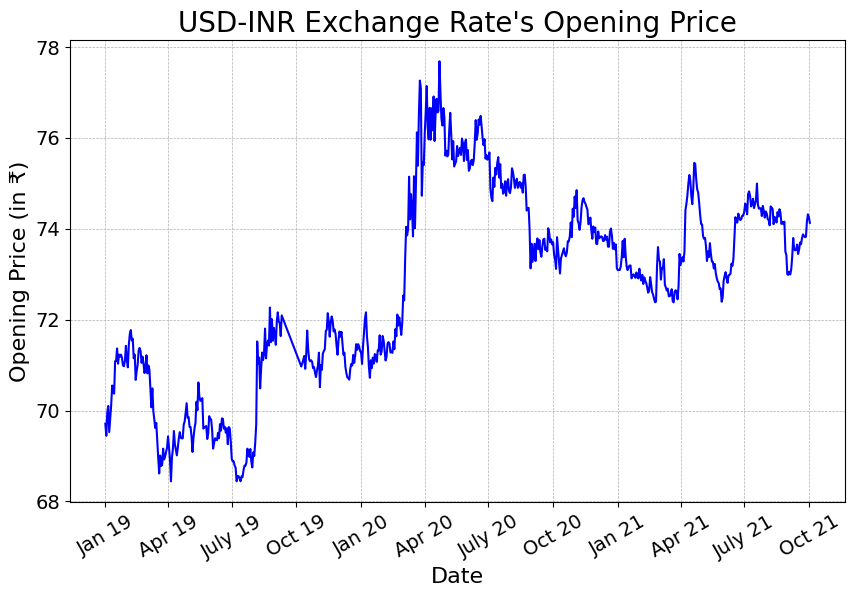

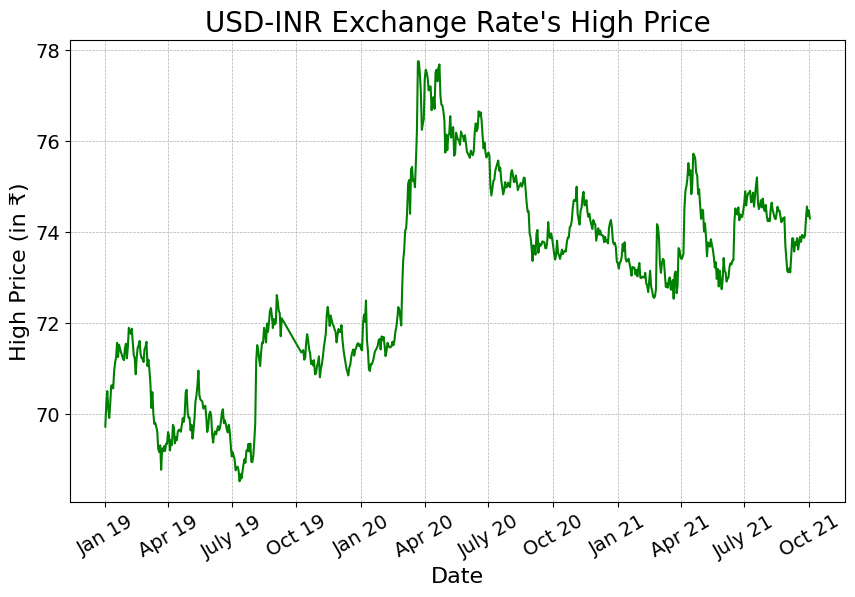

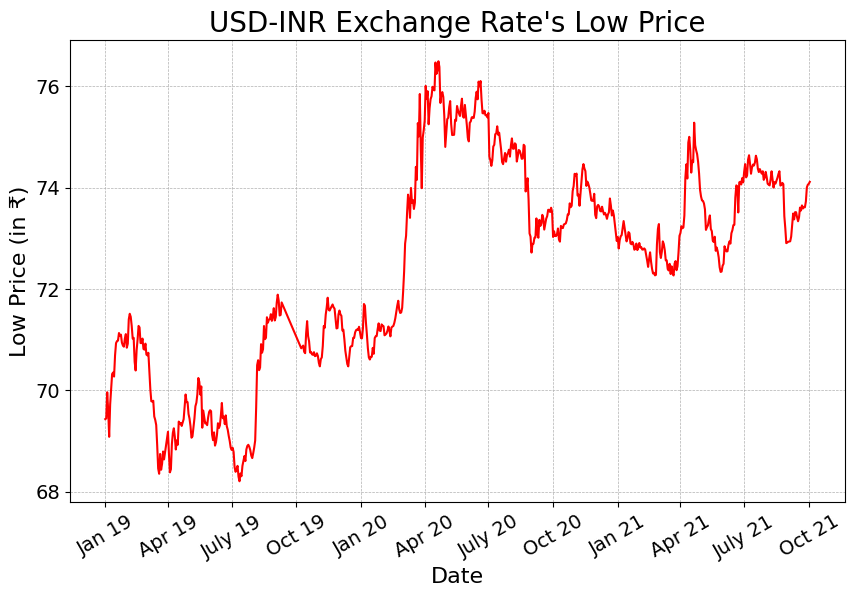

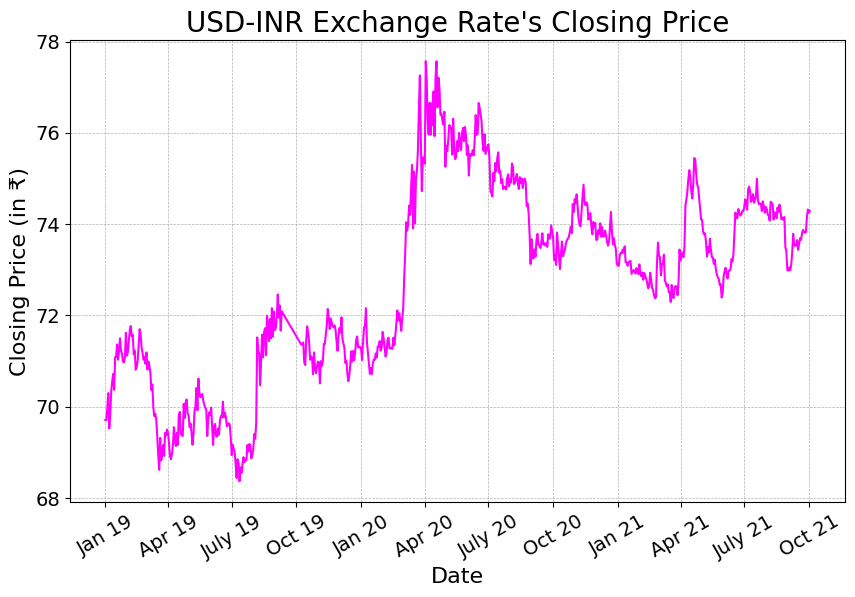

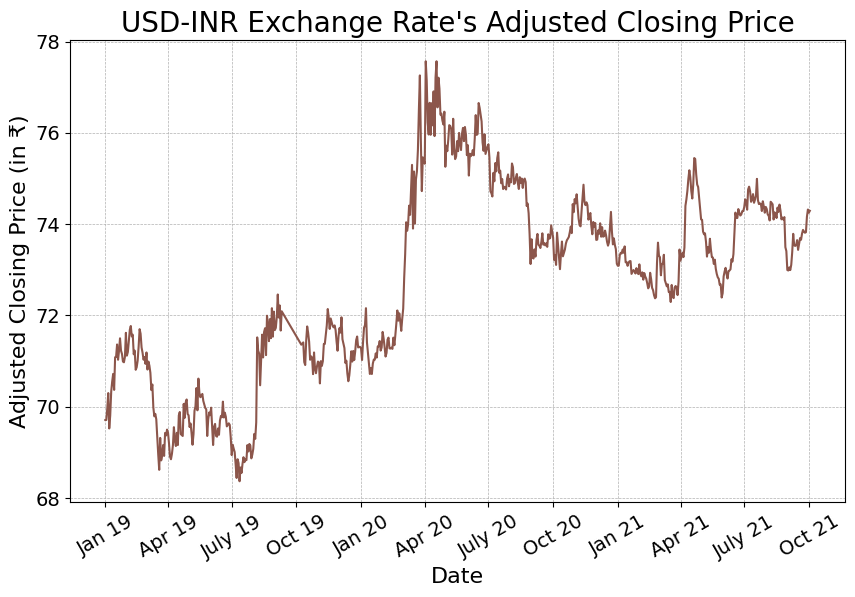

In [15]:
visualize_data('USD-INR Exchange Rate', save_fig=True)

# Moving Averages

In [16]:
def generate_moving_averages(dataset, save_fig=False):
    '''
    Function: To find and plot moving averages of given dataset

    dataset: dataset name
    save_fig: indicator for choosing to save the plot
    '''
    moving_average_periods = [10, 20, 50]
    data = import_data(dataset, 'xlsx')
    cols = list(data.columns)
    cols.pop(0)
    folders_new = get_path('xlsx', ' With MA')
    path = folders_new[dataset]
    for col in cols:
        for ma in moving_average_periods:
            data[f"{col} M.A. for {ma} days"] = data[col].rolling(ma).mean()
    save_data(data, path)
    print(f"Saved {dataset} Dataset with M.A.s at this location: {path}.\n")
    plot_moving_averages(dataset, save_fig=save_fig)

def plot_moving_averages(dataset, save_fig=False):
    '''
    Function: To plot moving averages of given dataset

    dataset: dataset name
    save_fig: indicator for choosing to save the plot
    '''
    data = import_data(dataset, 'xlsx')
    data_new = import_data(dataset, 'xlsx', update = ' With MA')
    cols = list(data.columns)
    cols.pop(0)

    for col in cols:
        data_new[[f"{col} M.A. for 10 days", f"{col} M.A. for 20 days", f"{col} M.A. for 50 days"]].plot(figsize = (10, 6), linewidth=2)
        [idx, xlabels] = date_label_generator(data)
        plt.xlabel("Date", fontsize=16)
        plt.ylabel(get_label(col) + ' ' + get_unit(dataset, col), fontsize=16)
        plt.xticks(idx, xlabels, rotation=30, fontsize=14)
        plt.yticks(fontsize=14)
        title = get_title(dataset) + ' ' + get_label(col) + " M.A."
        plt.title(title, fontsize=20)
        plt.grid(linestyle='--', linewidth=0.5)
        plt.legend(title = "Moving Averages", loc='best', prop = {"size": 14}, title_fontproperties = {"size": 14})
        if save_fig:
            plt.savefig(dataset + "/Moving Averages/" + title + ".png", bbox_inches="tight", dpi=500)

Saved Cognizant Dataset with M.A.s at this location: Datasets/Cognizant Share Prices 2019_2021 With MA.xlsx.



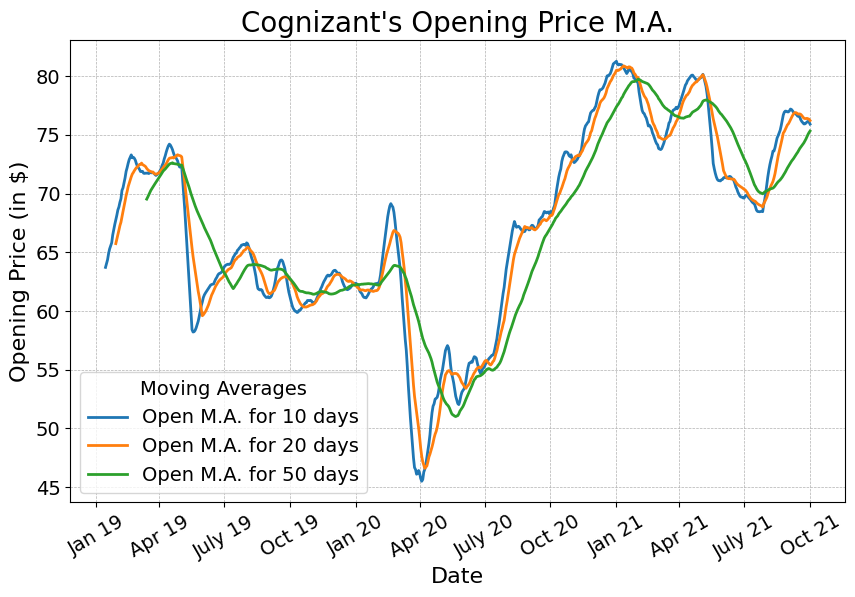

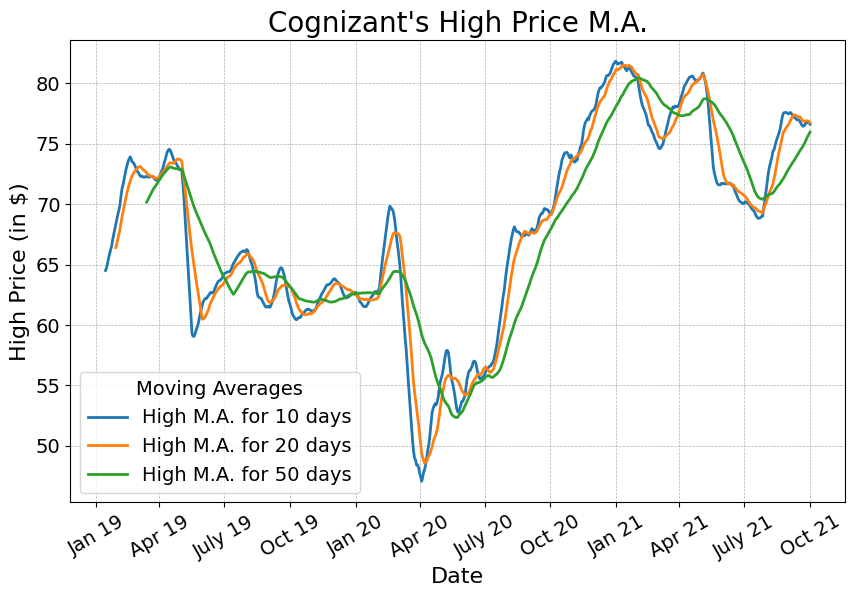

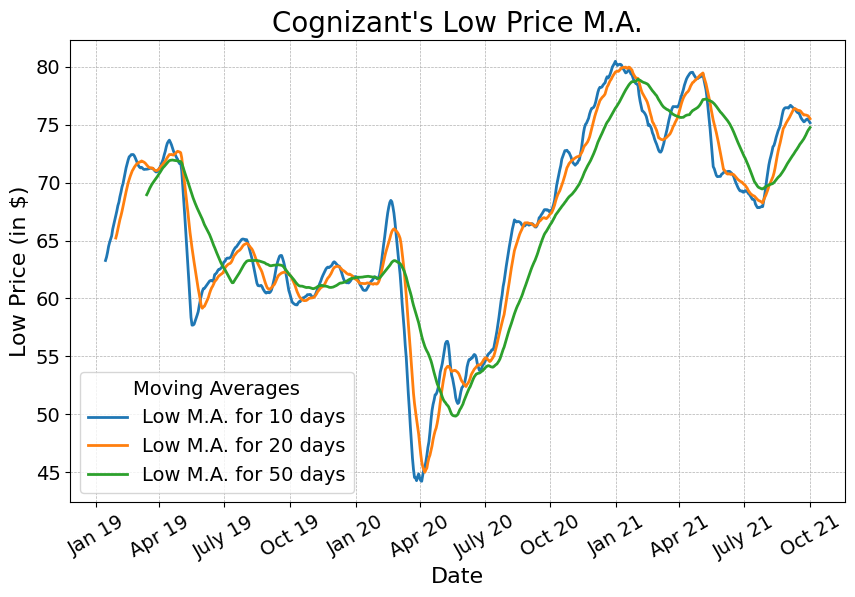

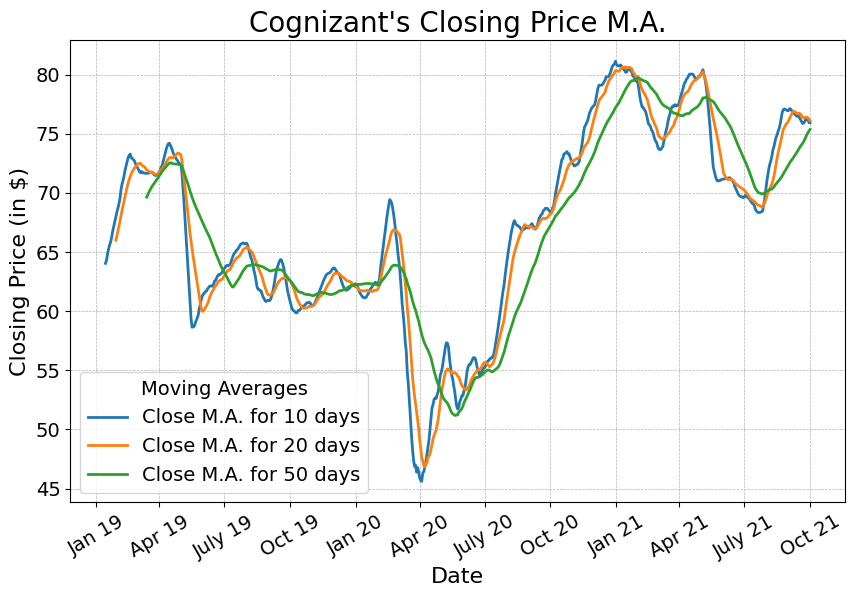

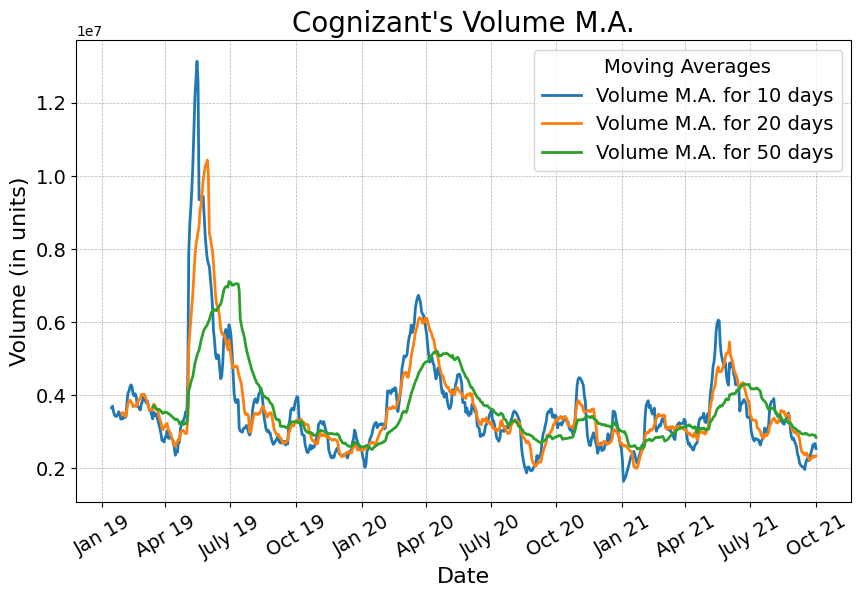

In [17]:
generate_moving_averages('Cognizant', save_fig=True)

Saved HCL Technologies Dataset with M.A.s at this location: Datasets/HCL Technologies Share Prices 2019_2021 With MA.xlsx.



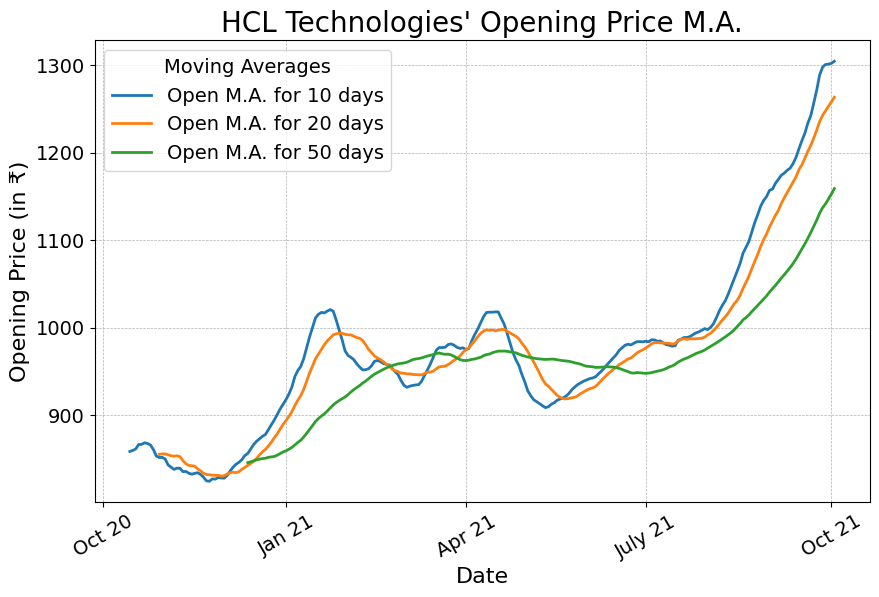

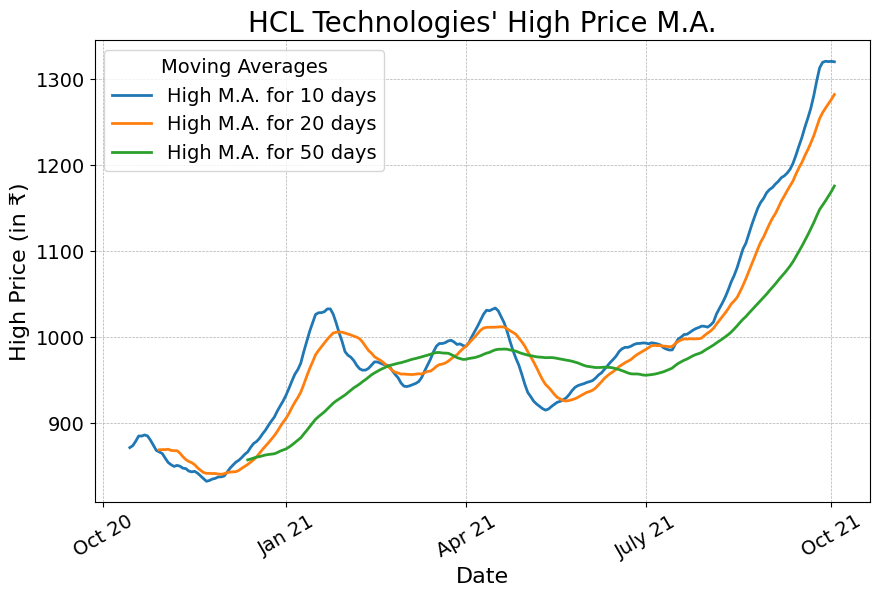

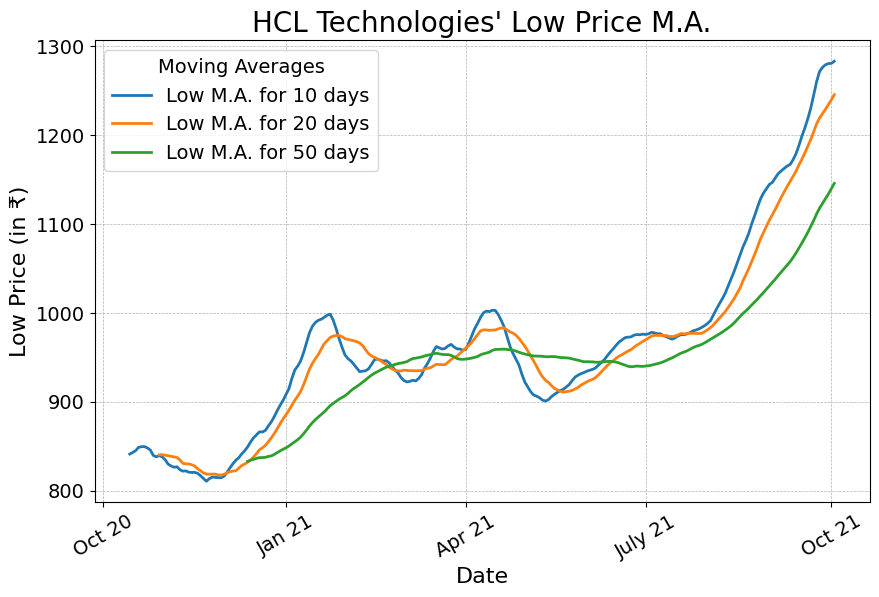

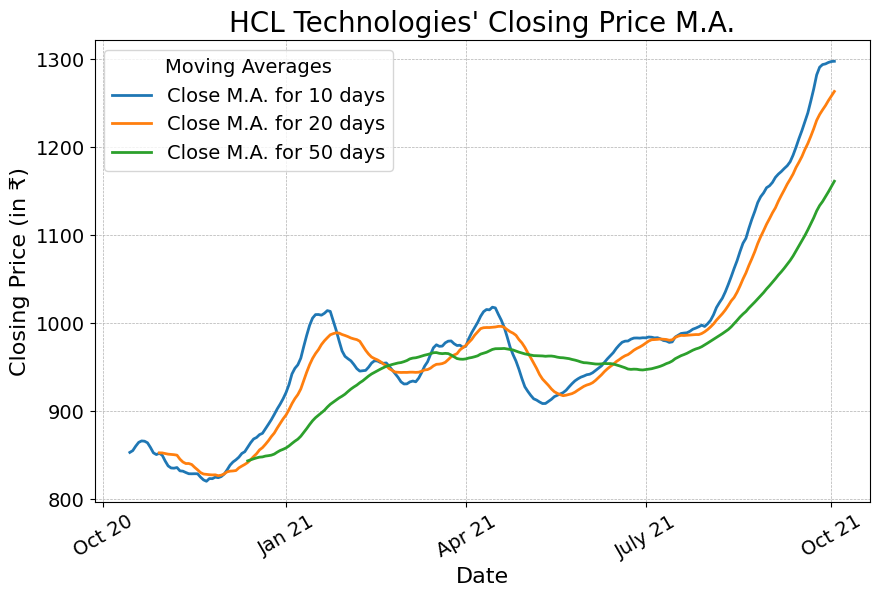

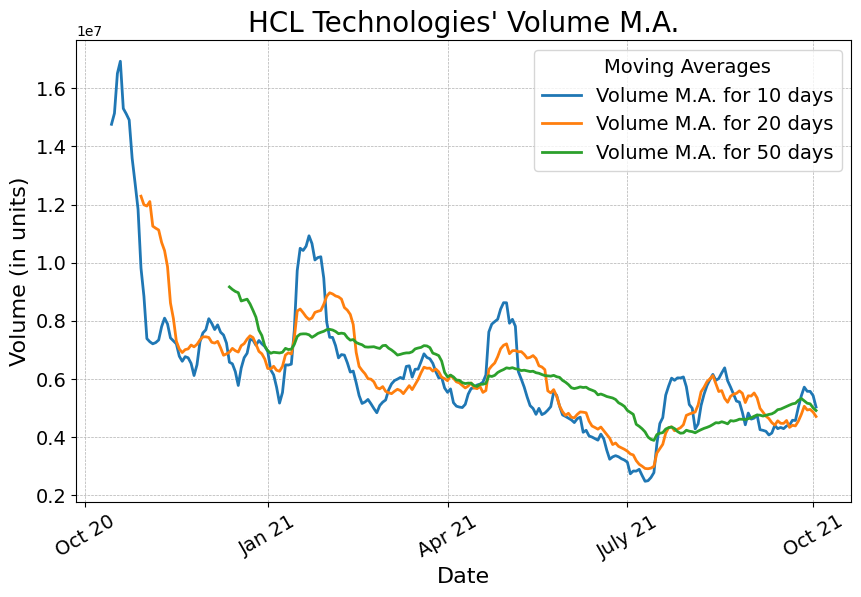

In [18]:
generate_moving_averages('HCL Technologies', save_fig=True)

Saved HDFC Bank Dataset with M.A.s at this location: Datasets/HDFC Bank Share Prices 2019_2021 With MA.xlsx.



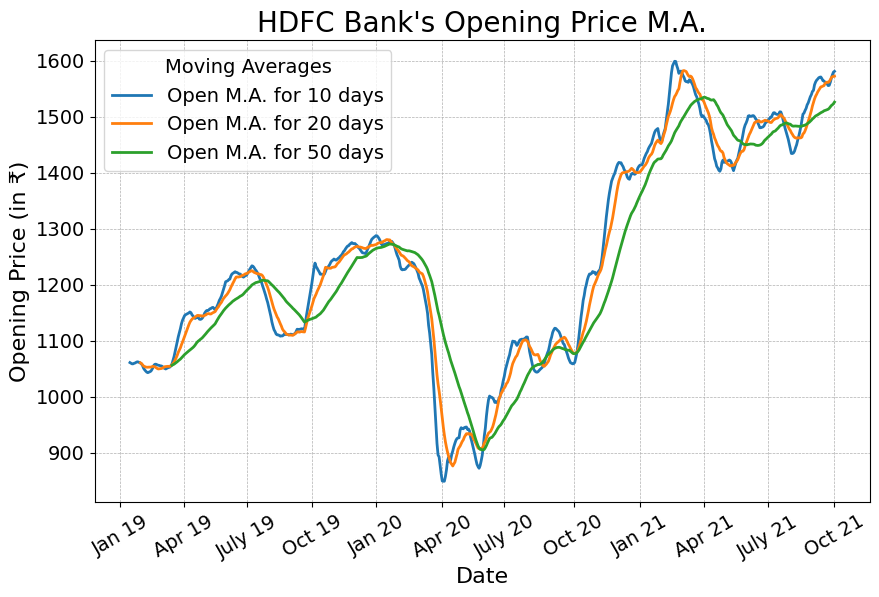

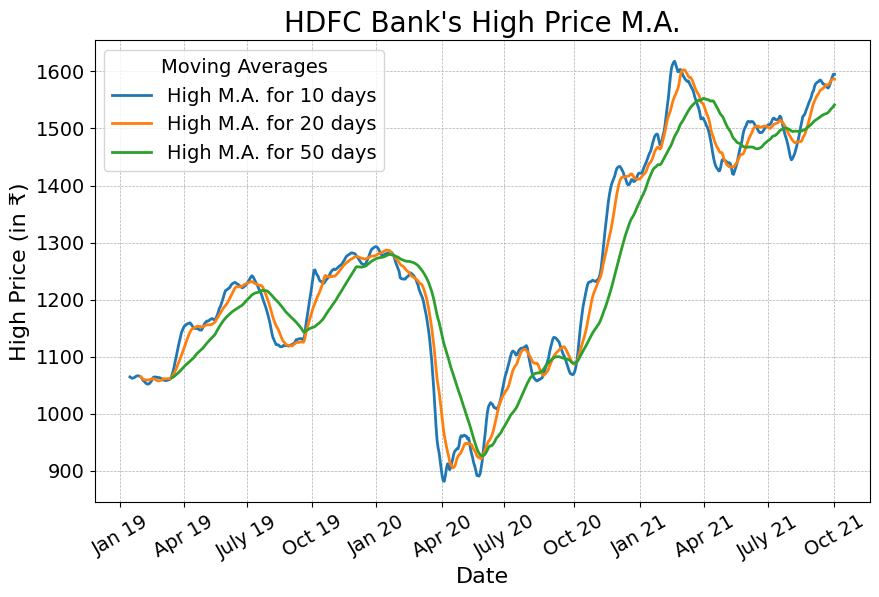

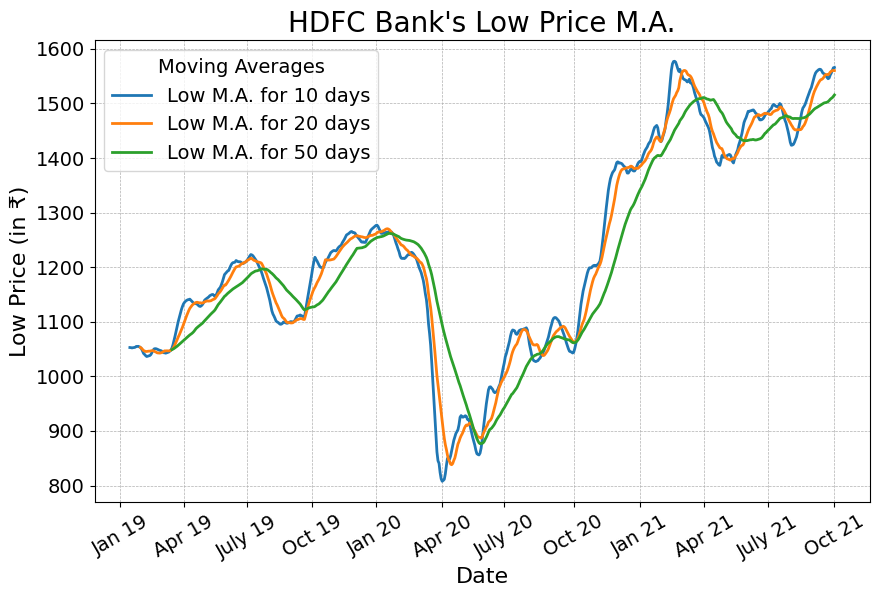

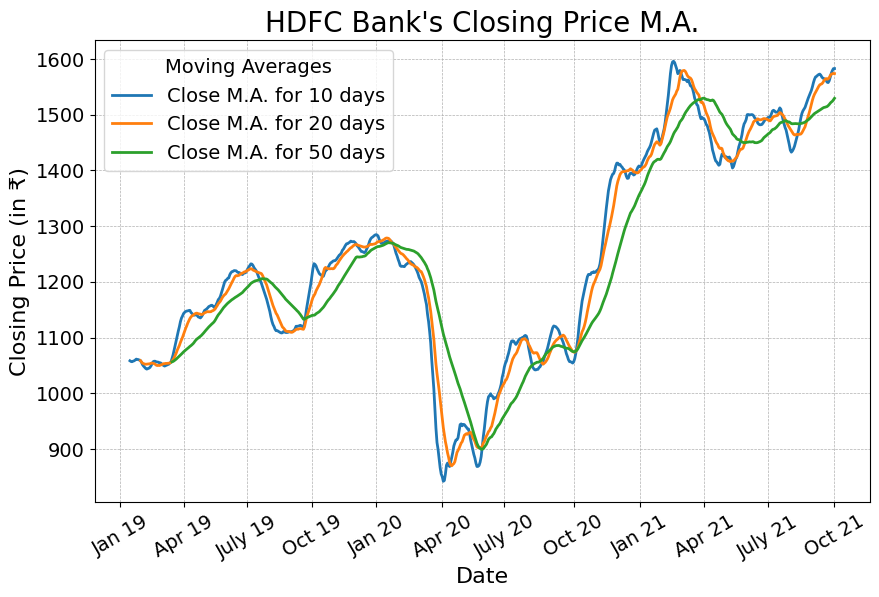

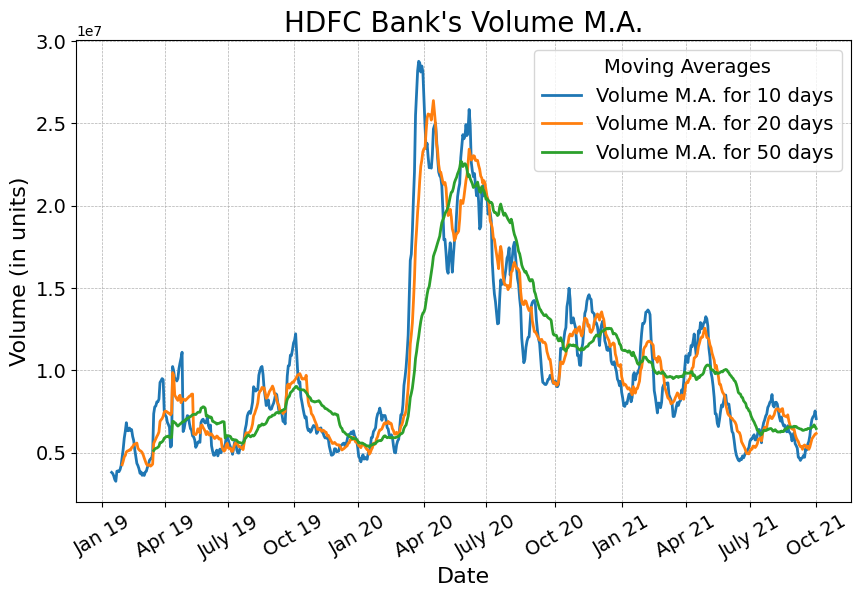

In [19]:
generate_moving_averages('HDFC Bank', save_fig=True)

Saved ICICI Bank Dataset with M.A.s at this location: Datasets/ICICI Bank Share Prices 2019_2021 With MA.xlsx.



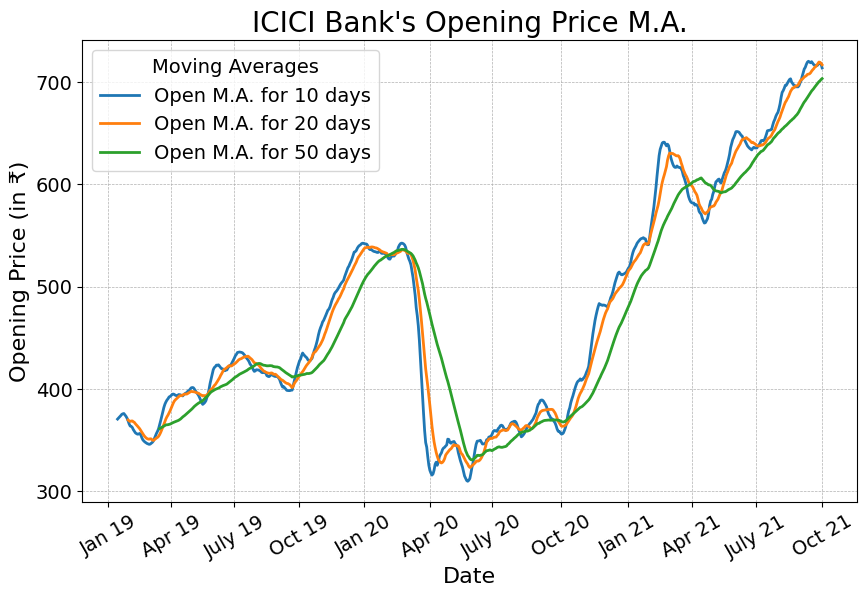

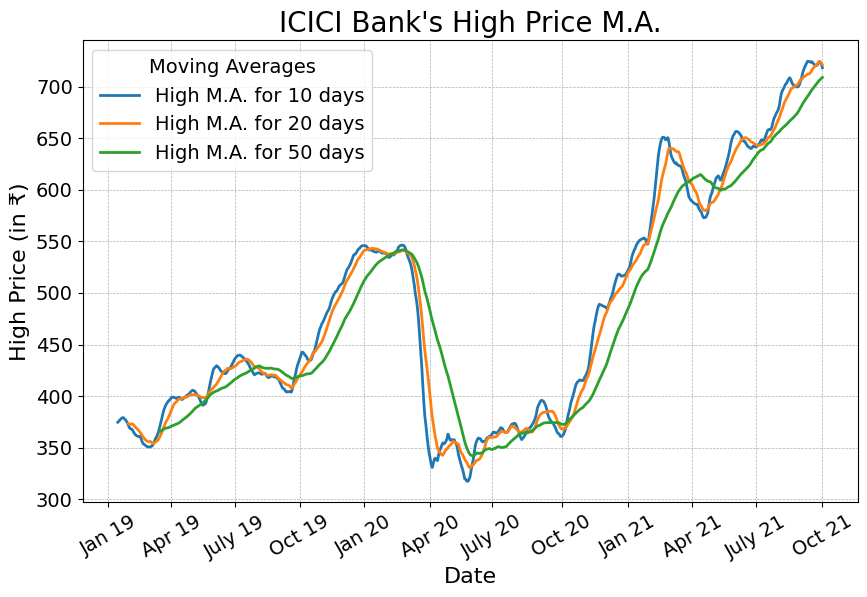

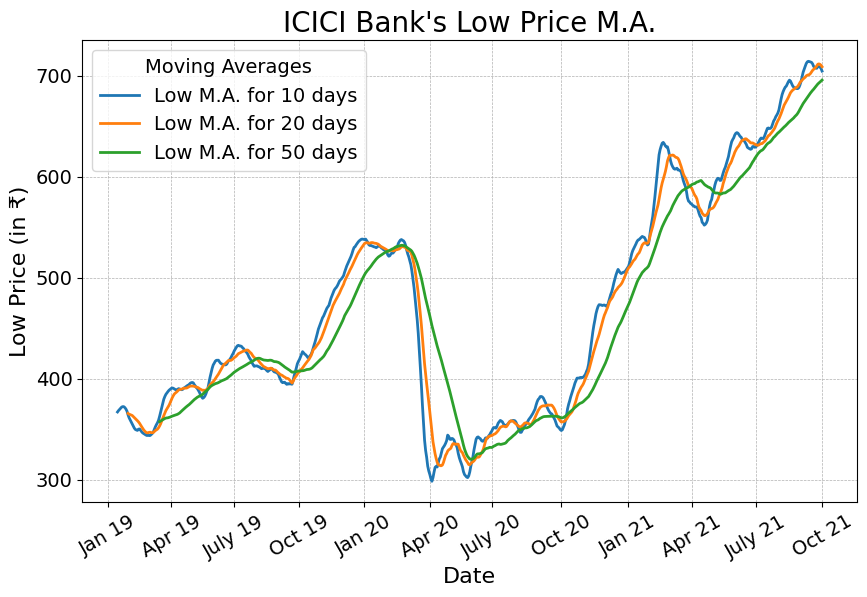

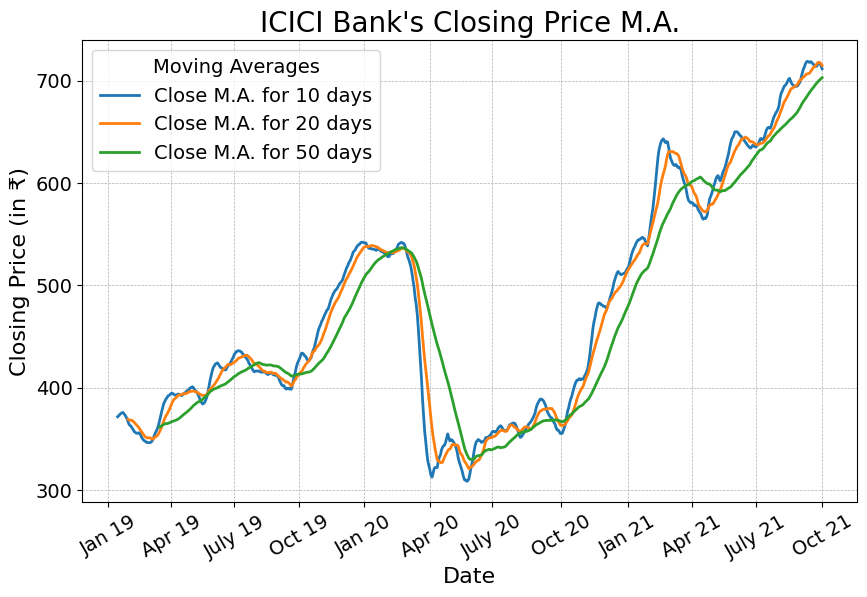

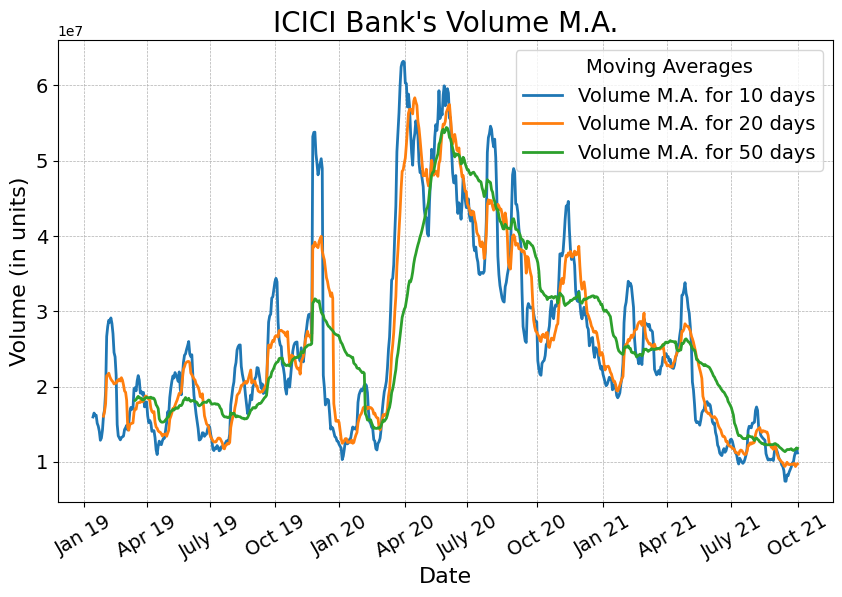

In [20]:
generate_moving_averages('ICICI Bank', save_fig=True)

Saved Infosys Dataset with M.A.s at this location: Datasets/Infosys Share Prices 2019_2021 With MA.xlsx.



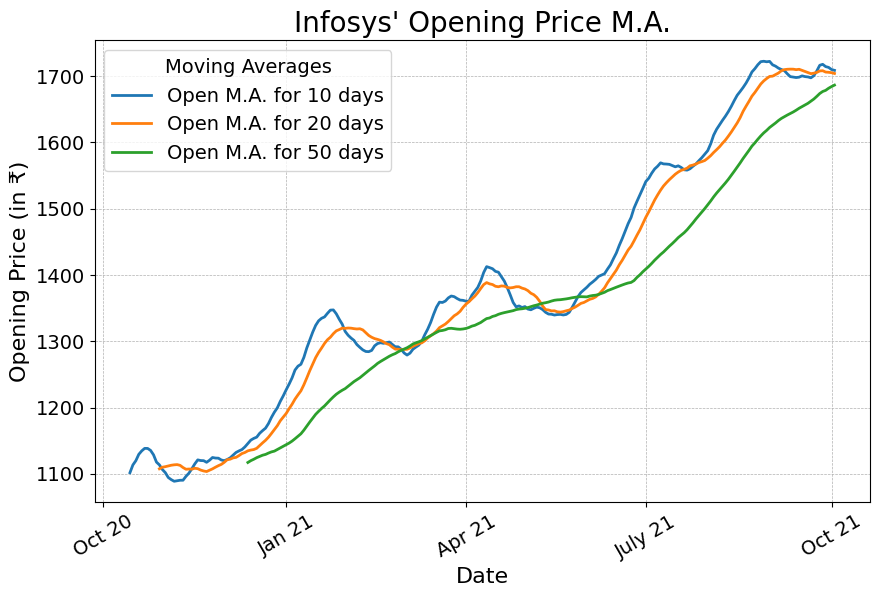

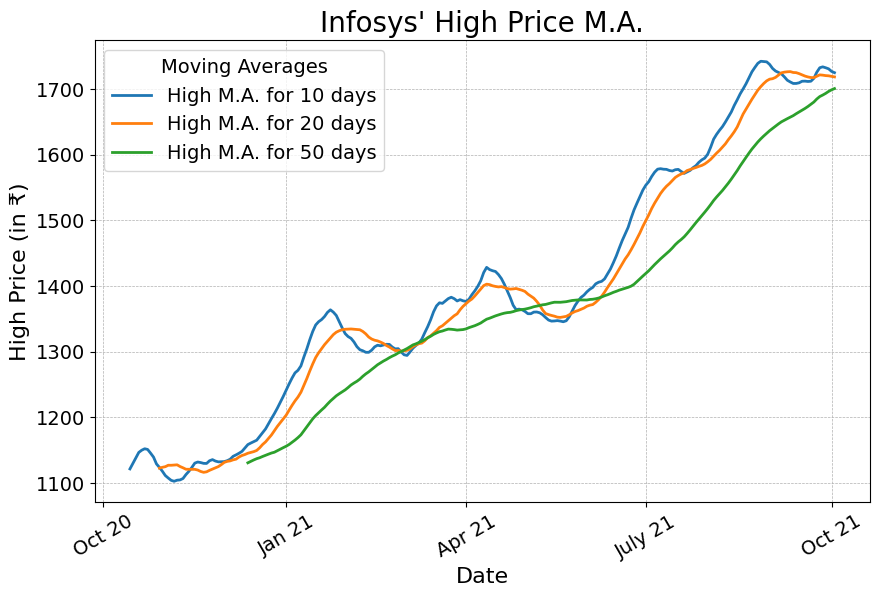

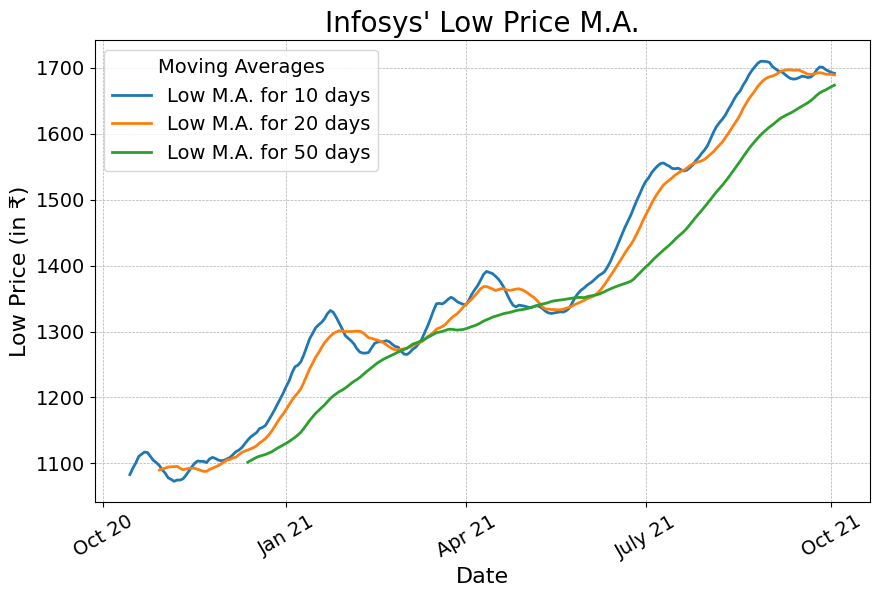

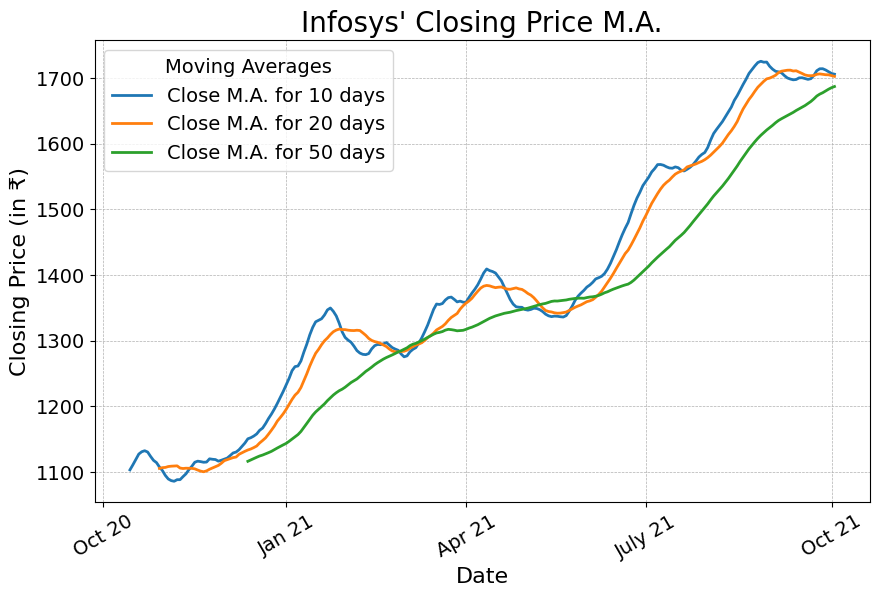

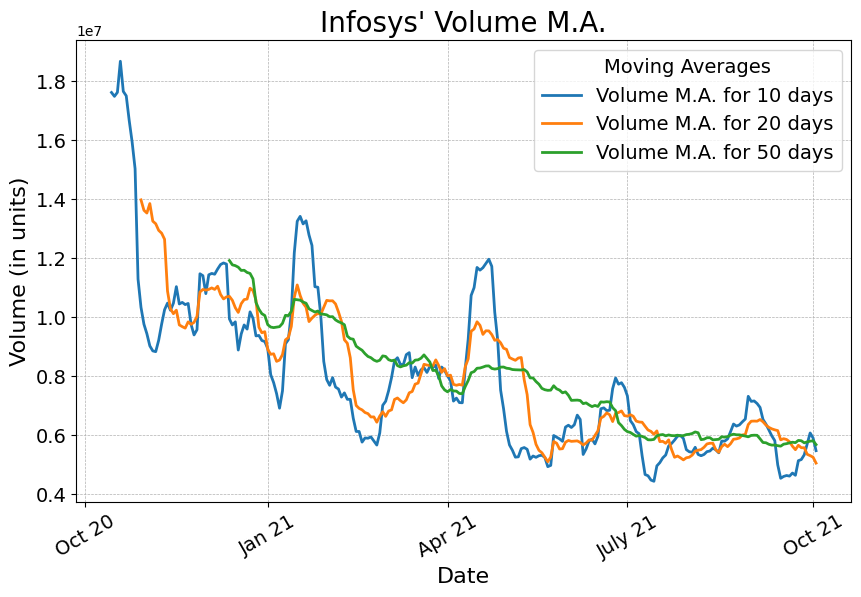

In [21]:
generate_moving_averages('Infosys', save_fig=True)

Saved SBI Dataset with M.A.s at this location: Datasets/SBI Share Prices 2019_2021 With MA.xlsx.



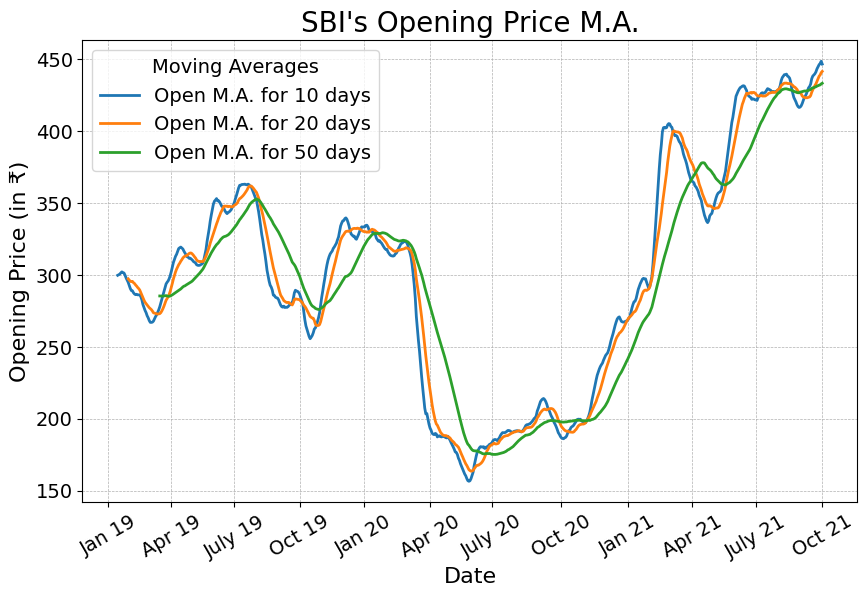

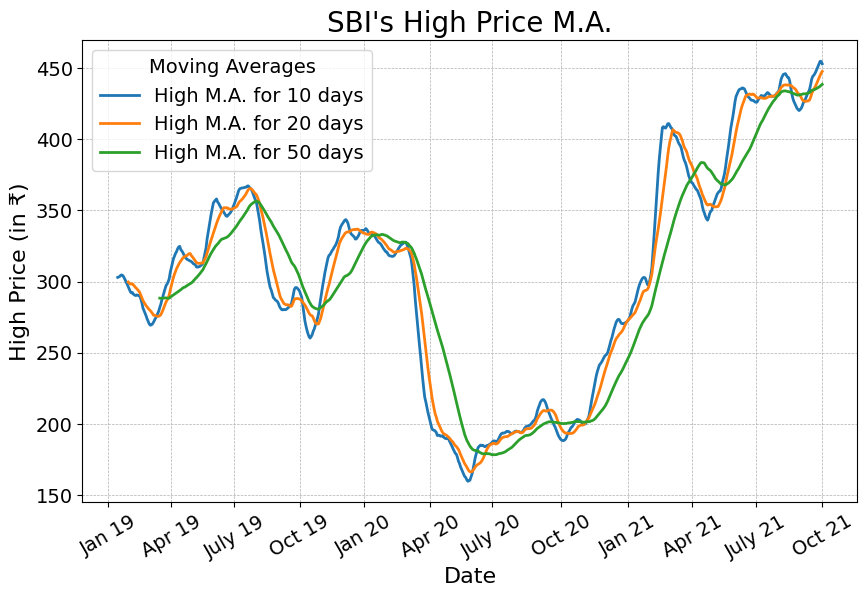

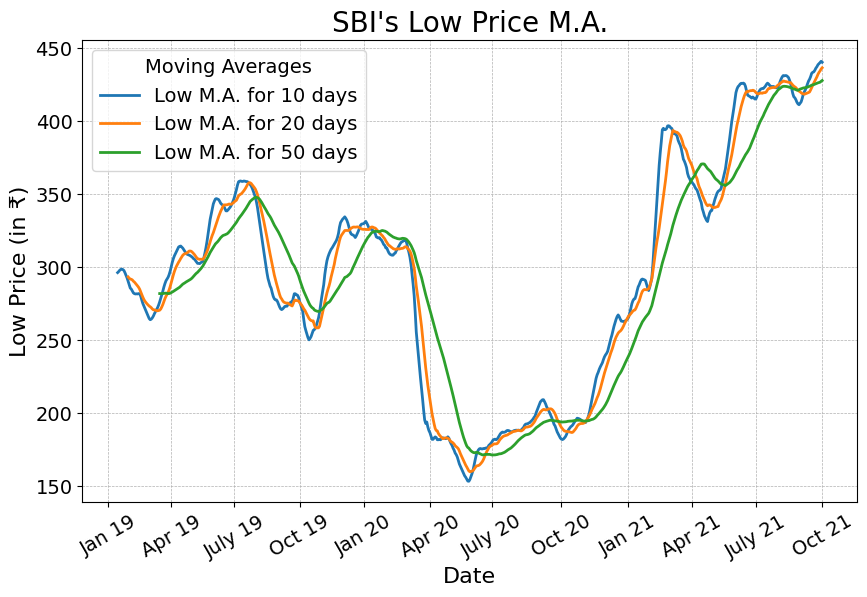

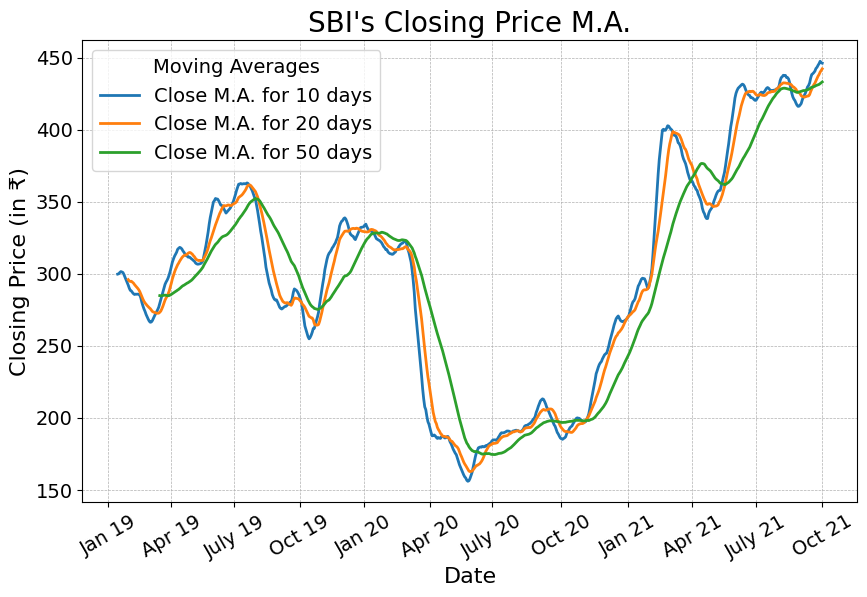

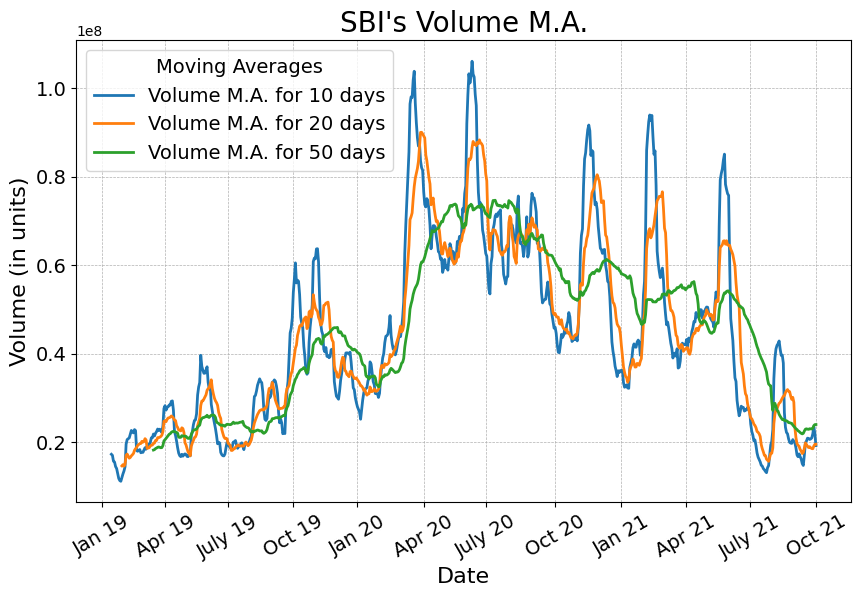

In [22]:
generate_moving_averages('SBI', save_fig=True)

Saved USD-INR Exchange Rate Dataset with M.A.s at this location: Datasets/USD-INR Exchange Rate 2019_2021 With MA.xlsx.



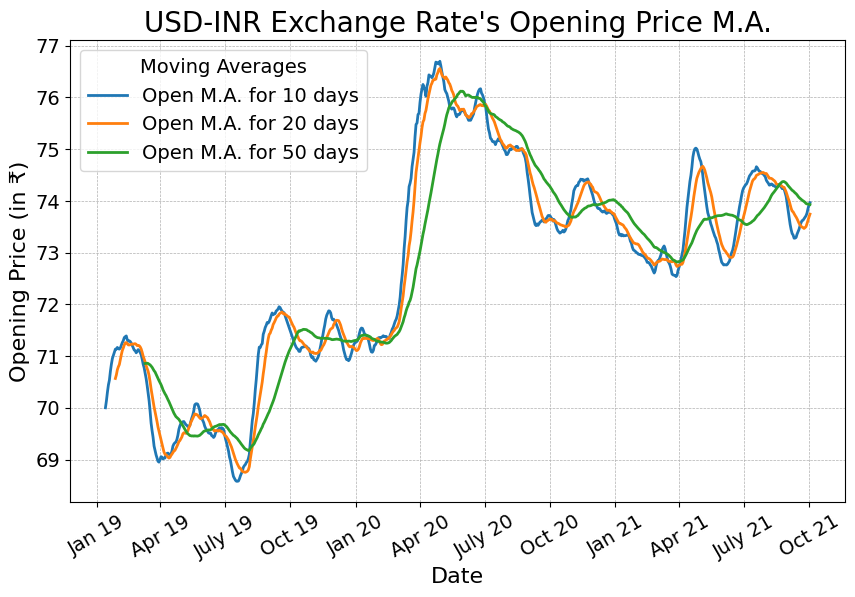

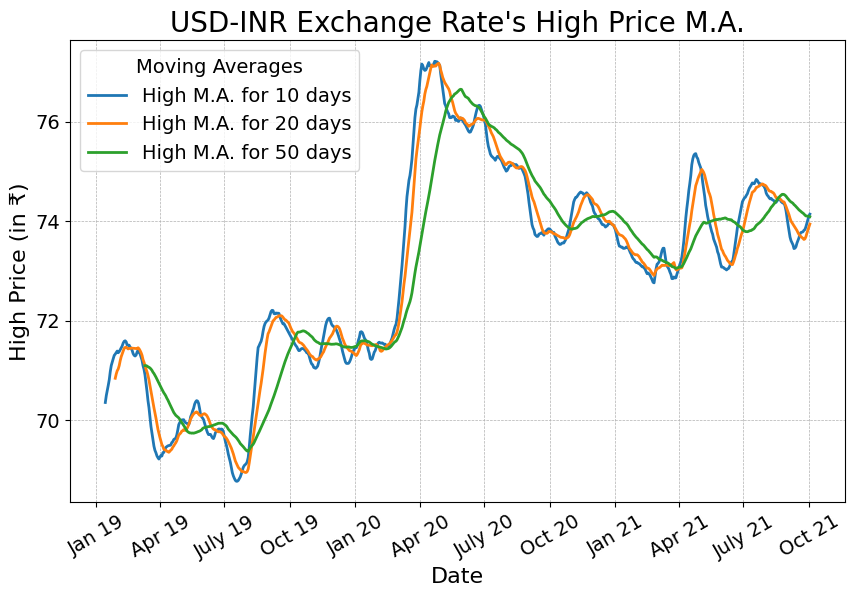

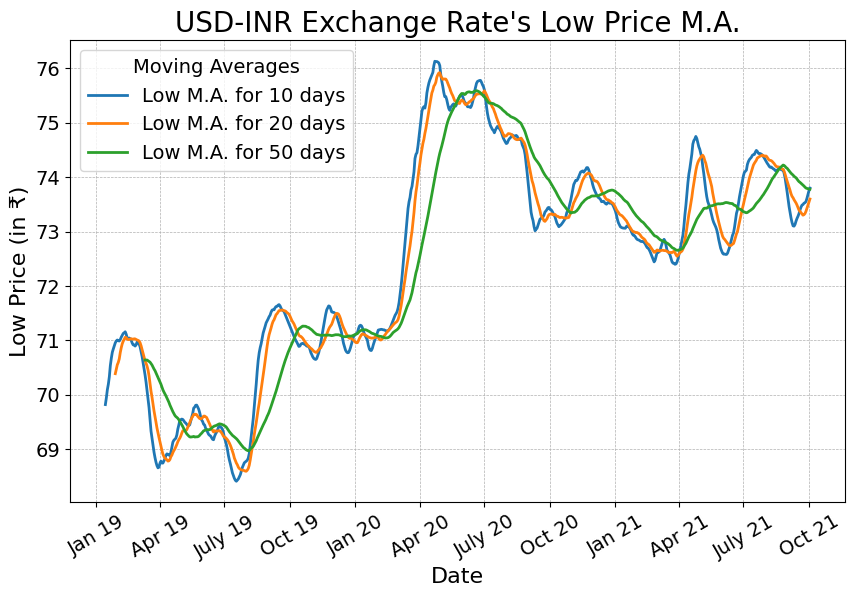

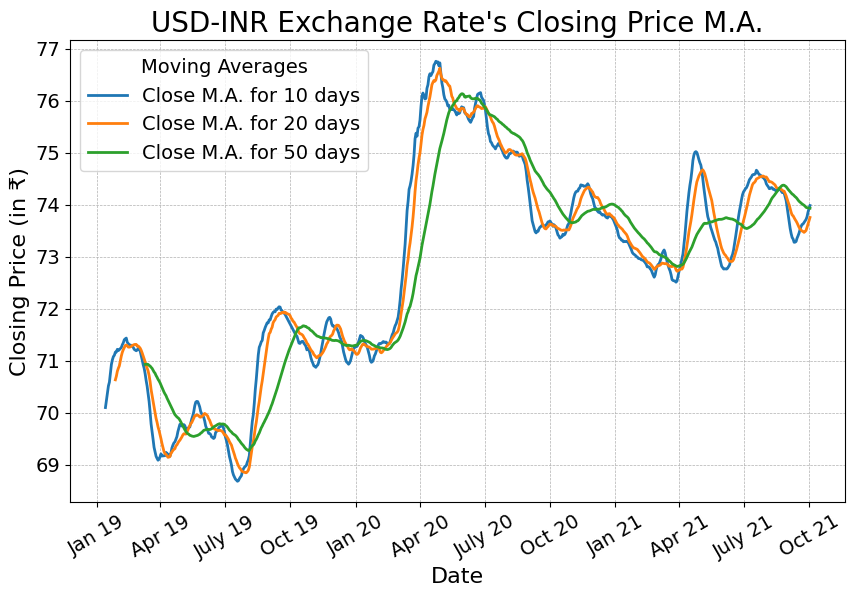

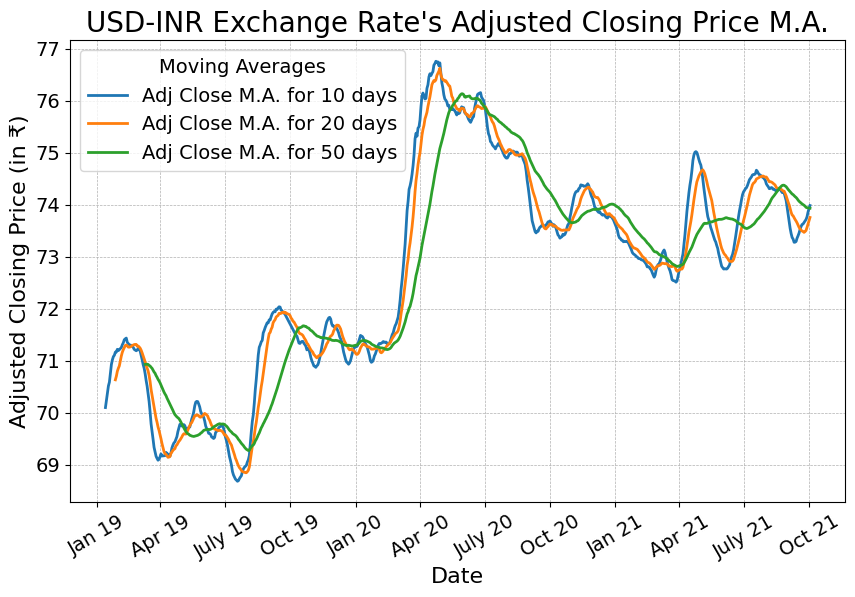

In [23]:
generate_moving_averages('USD-INR Exchange Rate', save_fig=True)

# Fitting LSTM Model

In [38]:
def generate_predictions(dataset, save_fig=False, train_ratio = 0.8, n_epochs = 50, interval = 60):
    '''
    Function: To fit LSTM model on given dataset and plot predictions

    dataset: dataset name
    save_fig: indicator for choosing to save the plot
    train_ratio: fraction of original data to be used as training data
    n_epochs: number of epochs
    interval: length of a batch of training data
    '''
    data = import_data(dataset, 'xlsx')
    training_data_len = int(np.ceil(data.shape[0]*train_ratio))
    [idx, xlabels] = date_label_generator(data.loc[interval:].reset_index(drop=True))
    [idx_test, xlabels_test] = date_label_generator(data.loc[training_data_len:].reset_index(drop=True), method='monthly')
    cols = list(data.columns)
    cols.pop(0)
    
    for col in cols:
        print(f"\nFitting LSTM Model for {col} Column of {dataset} Dataset")
        df = data.filter([col])
        df_vals = df.values
        MM = MinMaxScaler()
        scaled_data = MM.fit_transform(df_vals)
        train_data = scaled_data[0:int(training_data_len), :]
        test_data = scaled_data[int(training_data_len)-interval:, :]

        X_train = []
        Y_train = []
        for i in range(interval, len(train_data)):
            X_train.append(train_data[i - interval:i, 0])
            Y_train.append(train_data[i, 0])

        X_test = []
        Y_test = []
        for i in range(interval, len(test_data)):
            X_test.append(test_data[i - interval:i, 0])
            Y_test.append(test_data[i, 0])

        X_train, Y_train = np.array(X_train), np.array(Y_train)
        print(f"Shape of X_train: {X_train.shape}")
        print(f"Shape of Y_train: {Y_train.shape}")

        X_test, Y_test = np.array(X_test), np.array(Y_test)
        
        X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
        X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

        model = fit_model(dataset, col, X_train, Y_train, n_epochs)
        
        print("The Performance of Model on Train Set is as follows:-")
        calculate_performance(dataset, col, model, X_train, Y_train, MM)

        print("The Performance of Model on Test Set is as follows:-")
        calculate_performance(dataset, col, model, X_test, Y_test, MM)

        X = []
        Y = []
        for i in range(interval, len(scaled_data)):
            X.append(scaled_data[i - interval:i, 0])
            Y.append(df_vals[i, 0])
        X, Y = np.array(X), np.array(Y)
        print(f"Shape of X: {X.shape}")
        print(f"Shape of Y: {Y.shape}")
        X = np.reshape(X, (X.shape[0], X.shape[1], 1))

        plot_predictions(dataset, col, model, X, Y, MM, idx, xlabels, save_fig=save_fig, split = training_data_len-interval)
        plot_predictions(dataset, col, model, X_test, MM.inverse_transform(Y_test.reshape(-1, 1)), MM, idx_test, xlabels_test, save_fig=save_fig, test_set_ind=True)

def fit_model(dataset, col, X_train, Y_train, n_epochs):
    '''
    Function: To fit LSTM model on given dataset

    dataset: Dataset name
    col: Column name
    X_train: Training Input
    Y_train: Training Output
    n_epochs: number of epochs
    '''
    if dataset != 'HCL Technologies':
        model = Sequential()
        model.add(LSTM(128, return_sequences=True, input_shape= (X_train.shape[1], 1)))
        if col != 'Volume':
            model.add(Dropout(0.2))
        model.add(LSTM(64, return_sequences=False))
        if col != 'Volume':
            model.add(Dropout(0.2))
        model.add(Dense(25))
        model.add(Dense(1))
    else:
        print("Fitting smaller model")
        model = Sequential()
        model.add(LSTM(100, return_sequences=False, input_shape= (X_train.shape[1], 1)))
        if col != 'Volume':
            model.add(Dropout(0.2))
        model.add(Dense(1))
    if col == 'Volume':
        n_epochs = 100
    model.compile(optimizer='adam', loss='mean_squared_error')
    print(f"Fitting the LSTM Model on the Train Set for {col} Column of {dataset} Dataset")
    start = time.time()
    model.fit(X_train, Y_train, epochs=n_epochs, batch_size=16)
    end = time.time()
    print(f"Time required for fitting model: {(end-start):.4f} seconds.\n")
    return model

def calculate_performance(dataset, col, model, X, Y_true, scaler, true_ind = 'scaled'):
    '''
    Function: To calculate performance of model on given data

    dataset: Dataset name
    col: Column name
    model: Trained LSTM model
    X: Input
    Y_true: Known Output
    scaler: scaler transform
    true_ind: indicating whether Y_true is scaled or not
    '''
    Y_pred = model.predict(X)
    if true_ind == 'scaled':
        Y_true_new = scaler.inverse_transform(Y_true.reshape(-1, 1))
    else:
        Y_true_new = Y_true.reshape(-1, 1)
    Y_pred_new = scaler.inverse_transform(Y_pred.reshape(-1, 1))
    MSE = mean_squared_error(Y_true_new, Y_pred_new)
    RMSE = mean_squared_error(Y_true_new, Y_pred_new, squared=False)
    MAE = mean_absolute_error(Y_true_new, Y_pred_new)
    MAPE = mean_absolute_percentage_error(Y_true_new, Y_pred_new)*100
    if col == 'Volume':
        print(f"MAE is {MAE:.2f} units.")
        print(f"MSE is {MSE:.2f} sq. units.")
        print(f"RMSE is {RMSE:.2f} units.")
    else:
        print(f"MAE is {get_currency(dataset)}{MAE:.2f}.")
        print(f"MSE is sq. {get_currency(dataset)} {MSE:.2f}.")
        print(f"RMSE is {get_currency(dataset)}{RMSE:.2f}.")
    print(f"MAPE is {MAPE:.2f}%.")

def plot_predictions(dataset, col, model, X, Y, scaler, idx, xlabels, save_fig=False, test_set_ind=False, split = None):
    '''
    Function: To plot predictions

    dataset: Dataset name
    col: Column name
    model: Trained LSTM model
    X: Input
    Y: Output
    scaler: scaler transform
    idx: indices for dates
    xlabels: labels for dates
    save_fig: indicator for saving plot
    test_set_ind: indicates if data is from test set or not
    split: value used to demarcate separation between train and test data
    '''
    Y_pred_inv = scaler.inverse_transform(model.predict(X))
    plt.figure(figsize=(10, 6))
    Y = Y[:-1]
    Y_pred_inv = Y_pred_inv[1:]
    plt.plot(Y, color='red', label = 'Actual', linewidth=2)
    plt.plot(Y_pred_inv, color='blue', label = 'Predicted', linewidth=2)
    plt.xlabel("Date", fontsize=16)
    plt.ylabel(get_label(col) + ' ' + get_unit(dataset, col), fontsize=16)
    plt.xticks(idx, xlabels, rotation=30, fontsize=14)
    plt.yticks(fontsize=14)
    if test_set_ind:
        title = 'Test Dataset'
    else:
        title = 'Entire Dataset'
        plt.axvline(x = split, color = 'green', label = 'Train-Test Split', linestyle = '--', linewidth=1)
    suptitle = get_title(dataset) + ' ' + get_label(col) + ' Prediction'
    plt.suptitle(suptitle, fontsize=20)
    plt.title(title, fontsize=14)
    plt.grid(linestyle='--', linewidth=0.5)
    plt.legend(loc='best', prop = {"size": 14}, title_fontproperties = {"size": 14})
    if save_fig:
        plt.savefig(dataset + "/Predictions/" + suptitle + " On " + title +  ".png", bbox_inches="tight", dpi=500)


Fitting LSTM Model for Open Column of Cognizant Dataset
Shape of X_train: (496, 60)
Shape of Y_train: (496,)
Fitting the LSTM Model on the Train Set for Open Column of Cognizant Dataset
Epoch 1/50
31/31 [==============================] - 7s 72ms/step - loss: 0.0467
Epoch 2/50
31/31 [==============================] - 2s 67ms/step - loss: 0.0106
Epoch 3/50
31/31 [==============================] - 2s 68ms/step - loss: 0.0086
Epoch 4/50
31/31 [==============================] - 2s 67ms/step - loss: 0.0072
Epoch 5/50
31/31 [==============================] - 2s 68ms/step - loss: 0.0071
Epoch 6/50
31/31 [==============================] - 2s 68ms/step - loss: 0.0067
Epoch 7/50
31/31 [==============================] - 2s 71ms/step - loss: 0.0058
Epoch 8/50
31/31 [==============================] - 2s 69ms/step - loss: 0.0057
Epoch 9/50
31/31 [==============================] - 2s 68ms/step - loss: 0.0054
Epoch 10/50
31/31 [==============================] - 2s 69ms/step - loss: 0.0049
Epoch 11/50


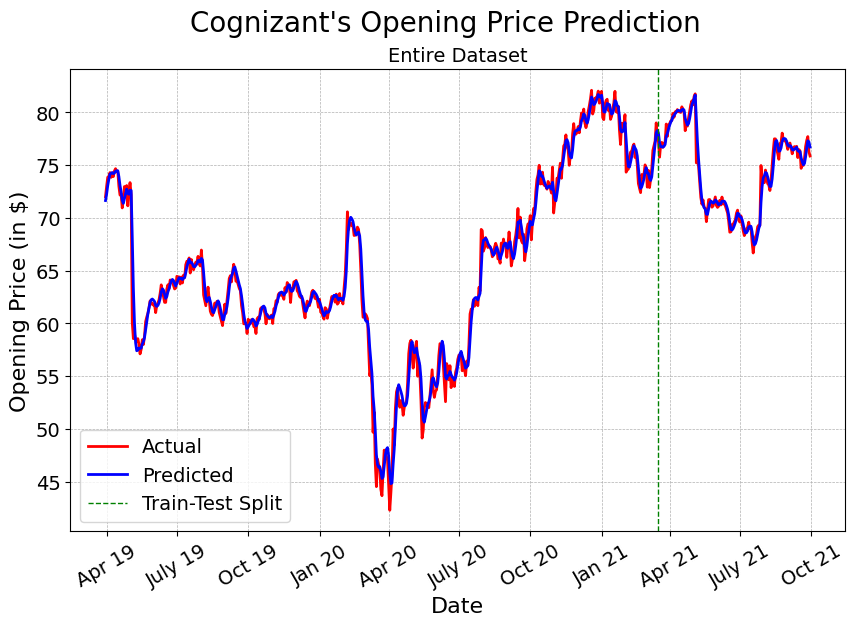

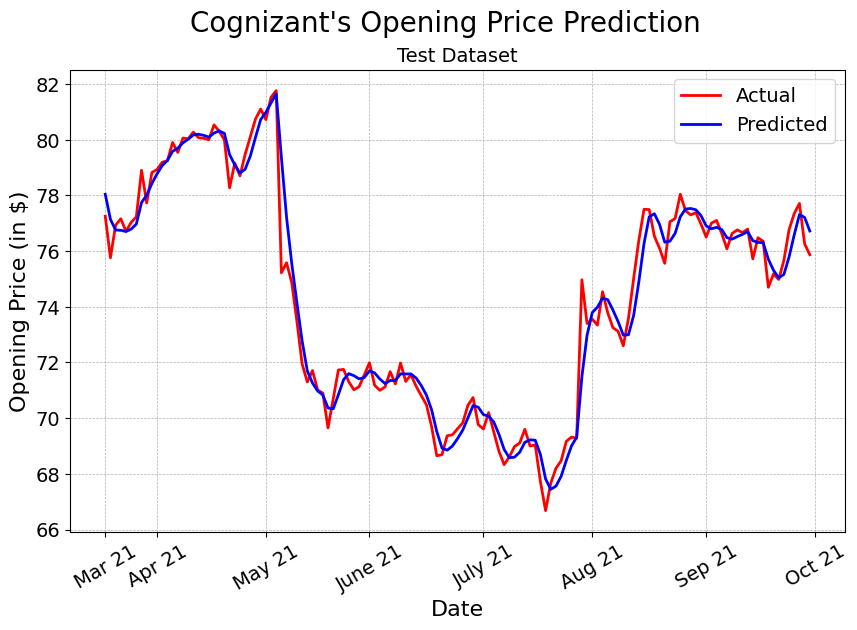

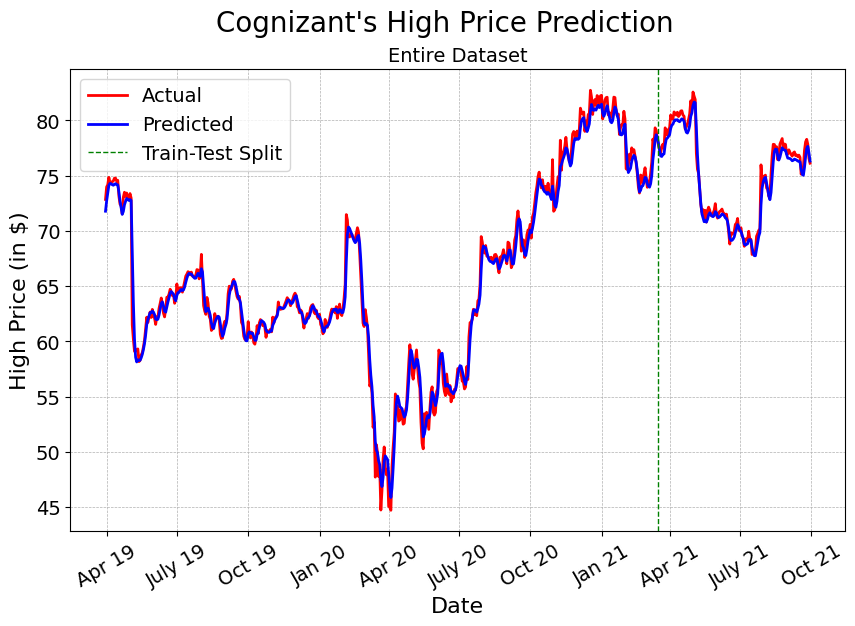

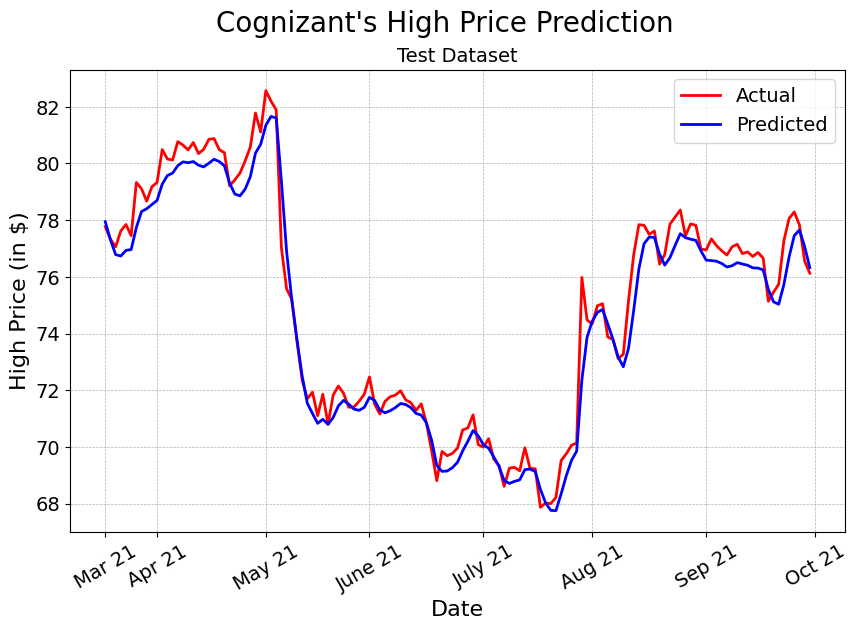

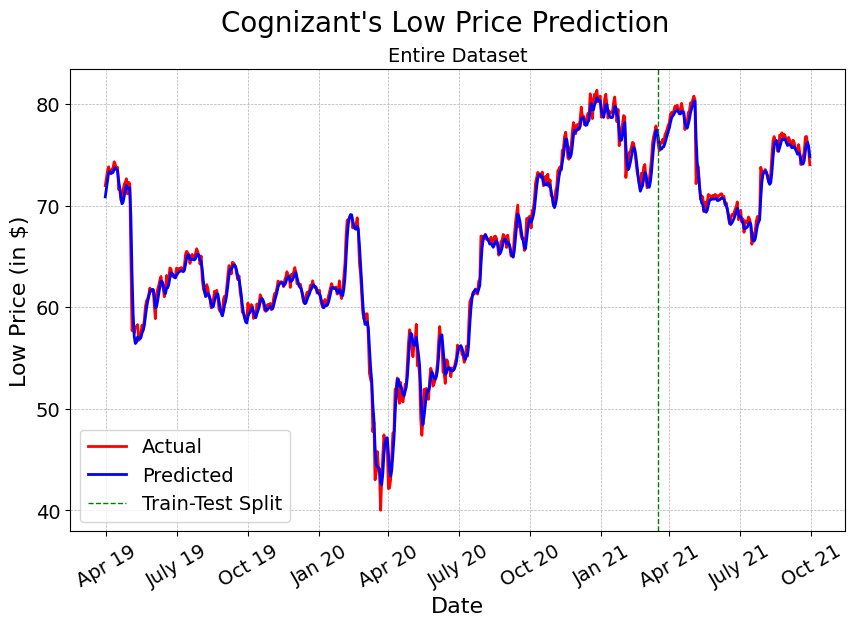

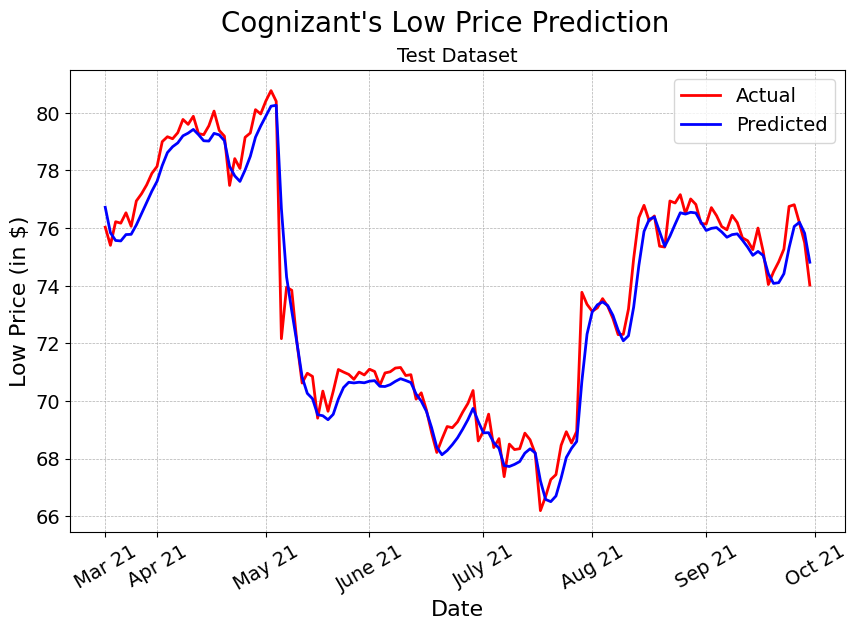

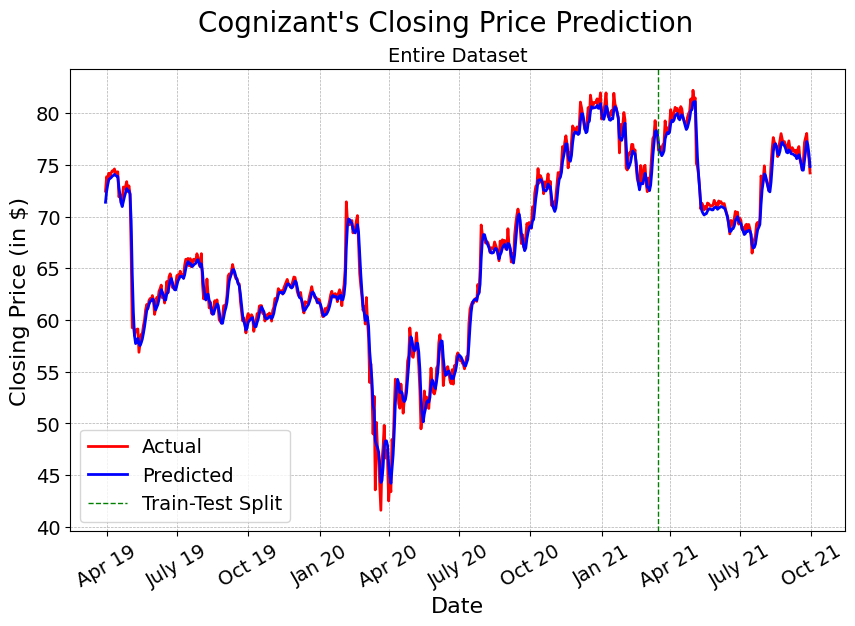

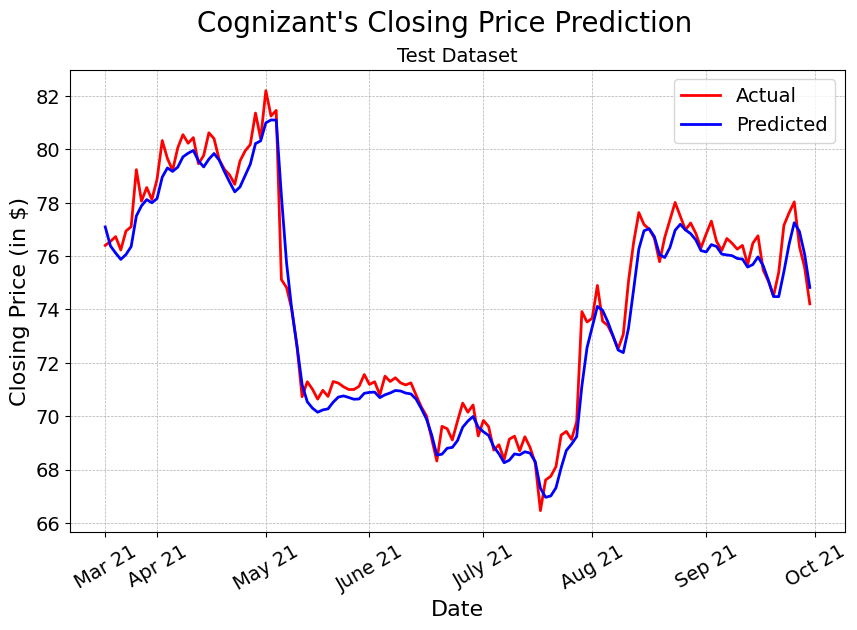

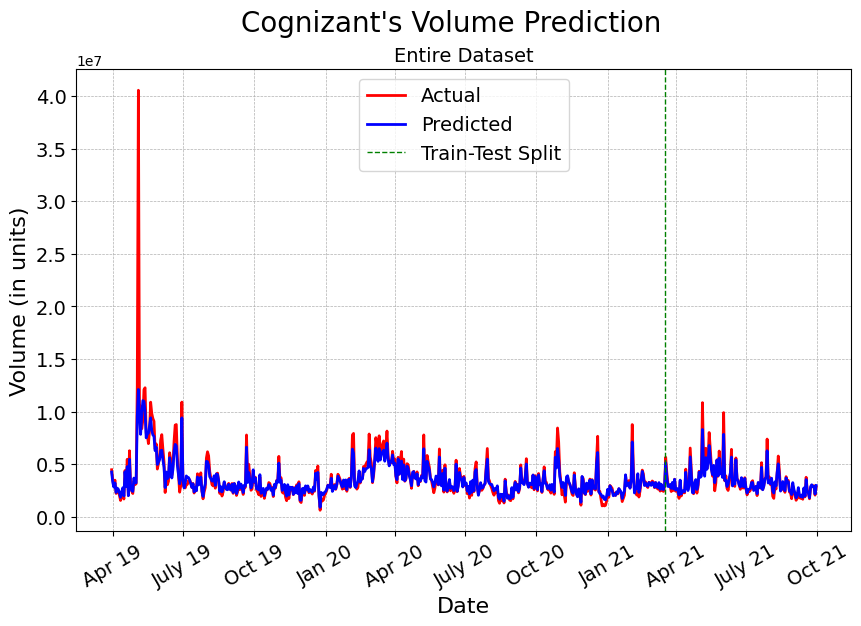

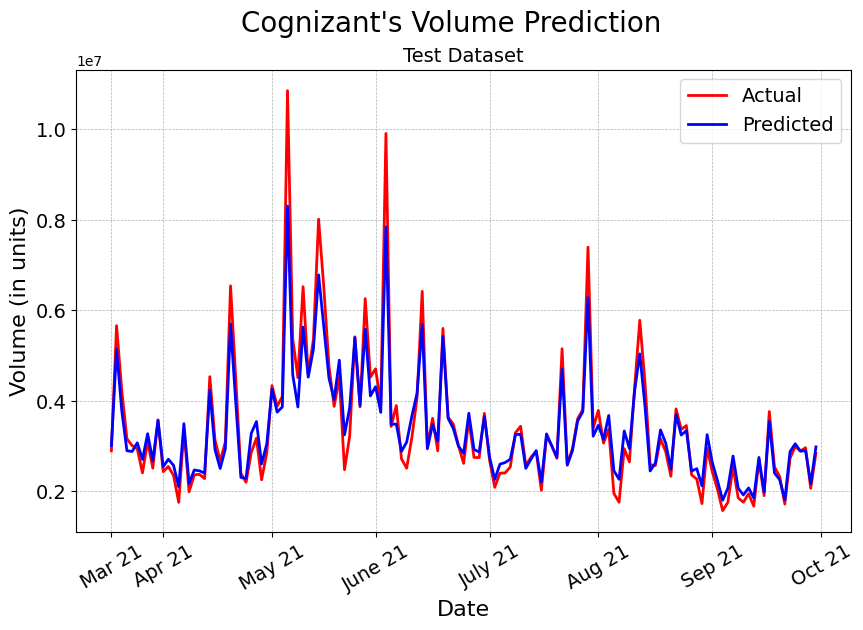

In [25]:
generate_predictions('Cognizant', save_fig = True)


Fitting LSTM Model for Open Column of HCL Technologies Dataset
Shape of X_train: (170, 30)
Shape of Y_train: (170,)
Fitting the LSTM Model on the Train Set for Open Column of HCL Technologies Dataset
Epoch 1/50
11/11 [==============================] - 5s 25ms/step - loss: 0.0302
Epoch 2/50
11/11 [==============================] - 0s 24ms/step - loss: 0.0066
Epoch 3/50
11/11 [==============================] - 0s 23ms/step - loss: 0.0038
Epoch 4/50
11/11 [==============================] - 0s 23ms/step - loss: 0.0035
Epoch 5/50
11/11 [==============================] - 0s 24ms/step - loss: 0.0030
Epoch 6/50
11/11 [==============================] - 0s 25ms/step - loss: 0.0029
Epoch 7/50
11/11 [==============================] - 0s 23ms/step - loss: 0.0027
Epoch 8/50
11/11 [==============================] - 0s 23ms/step - loss: 0.0025
Epoch 9/50
11/11 [==============================] - 0s 24ms/step - loss: 0.0024
Epoch 10/50
11/11 [==============================] - 0s 23ms/step - loss: 0.002

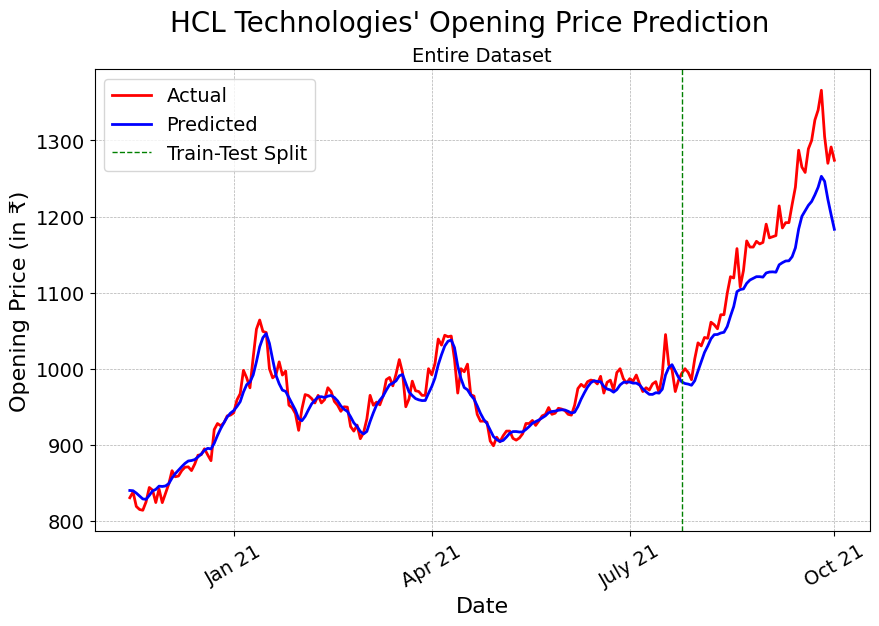

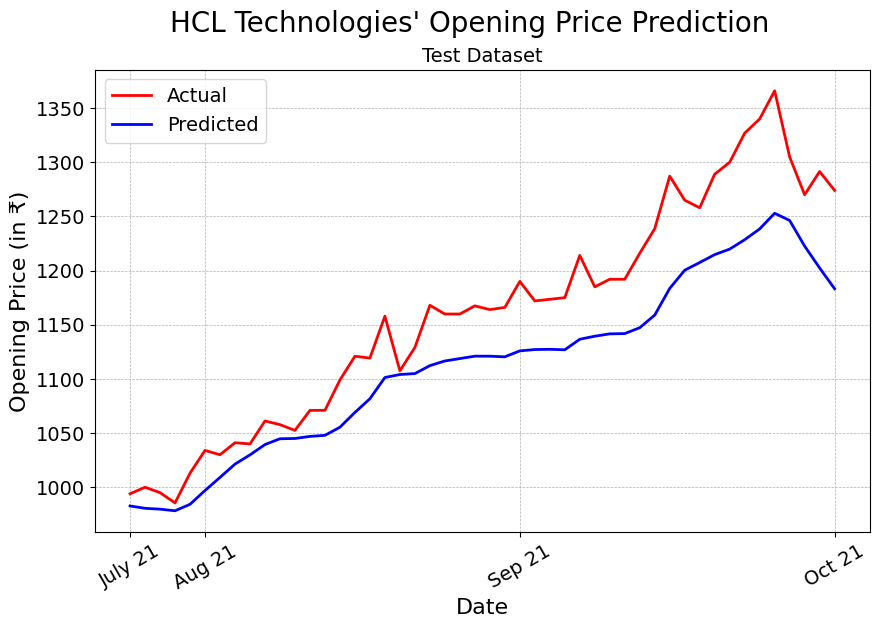

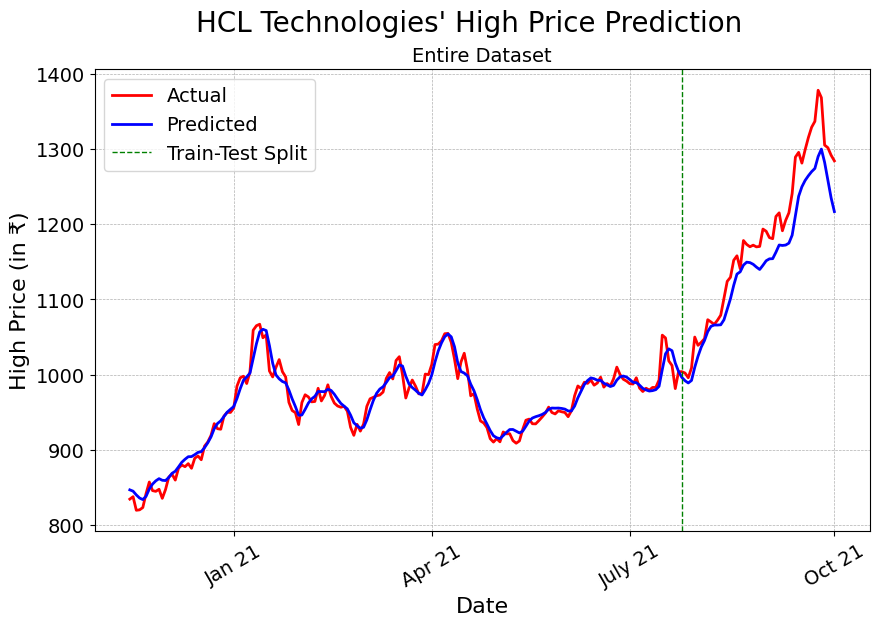

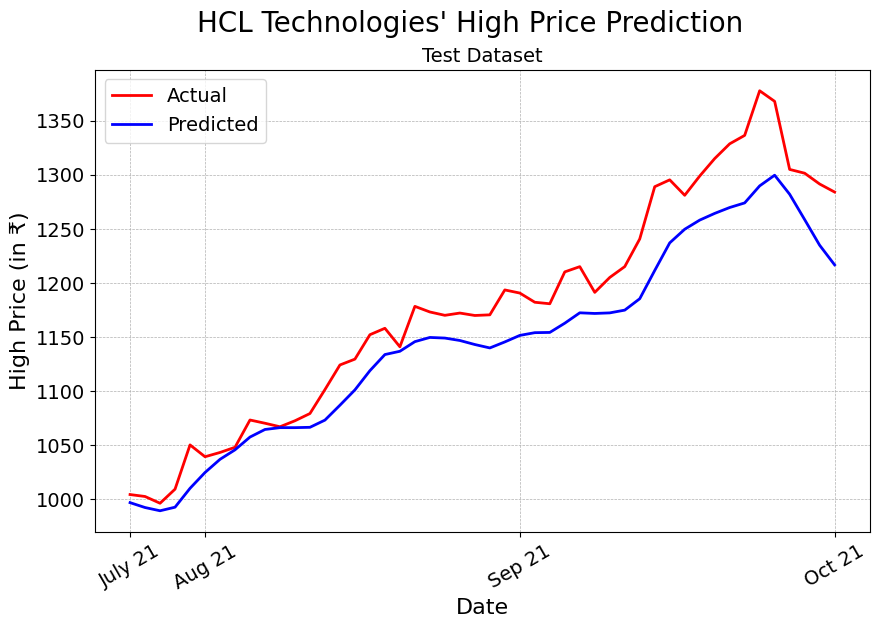

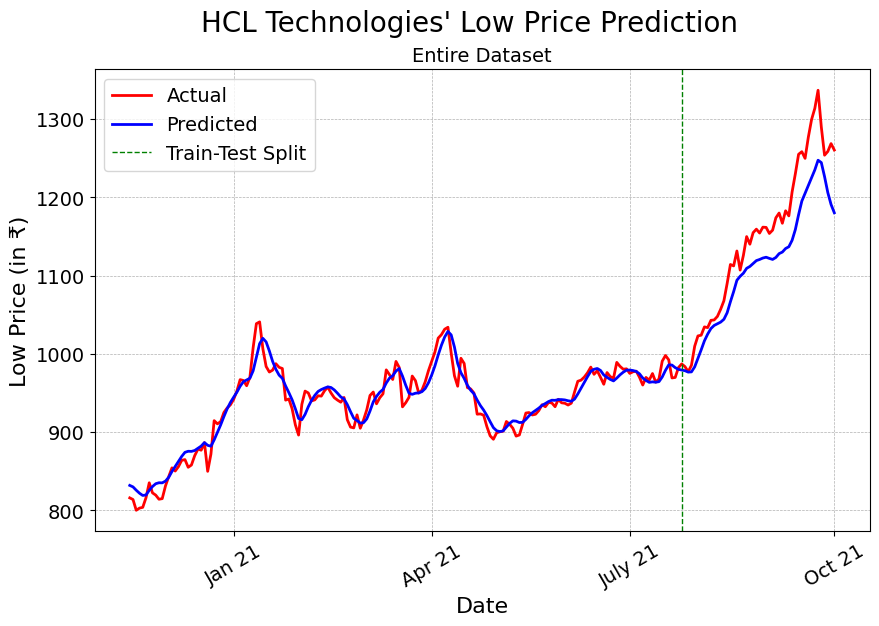

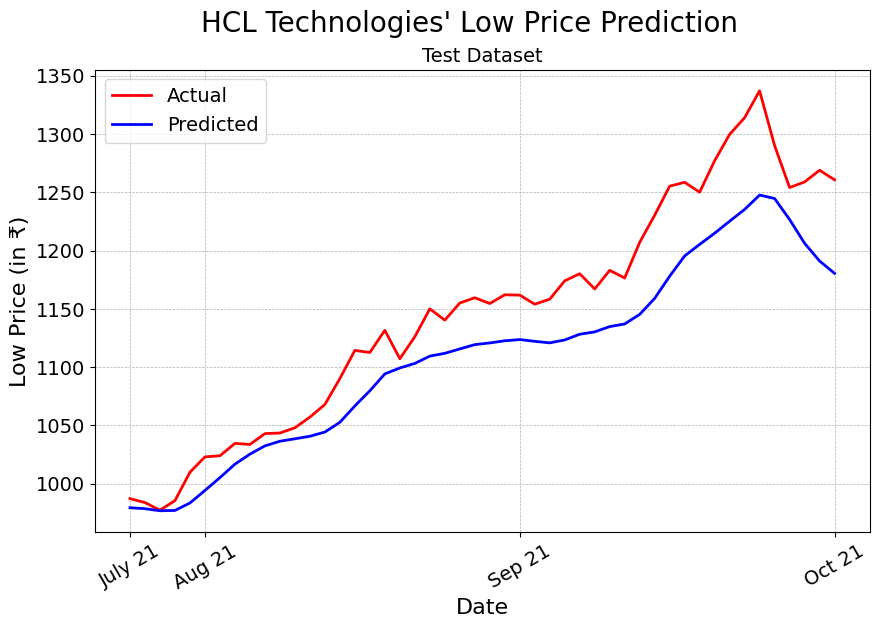

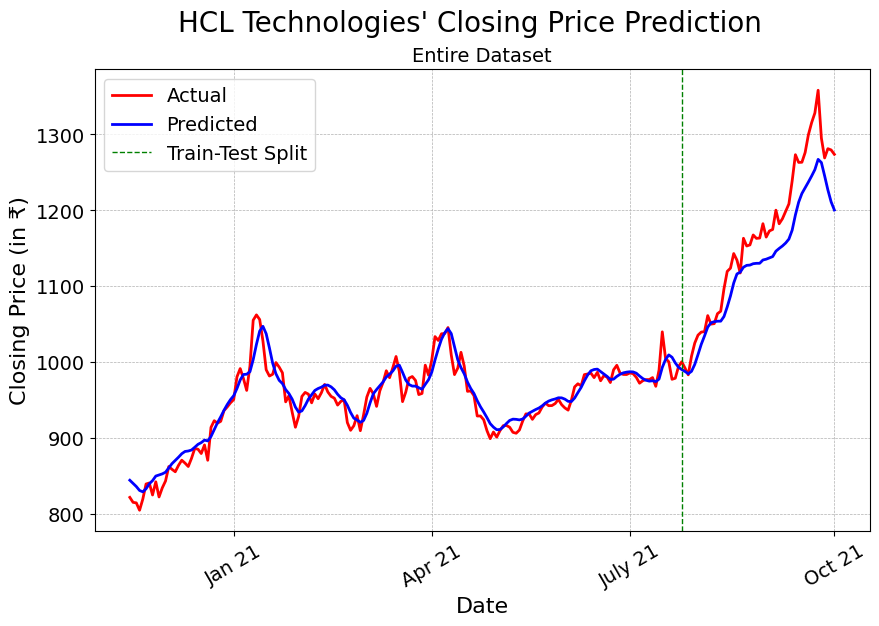

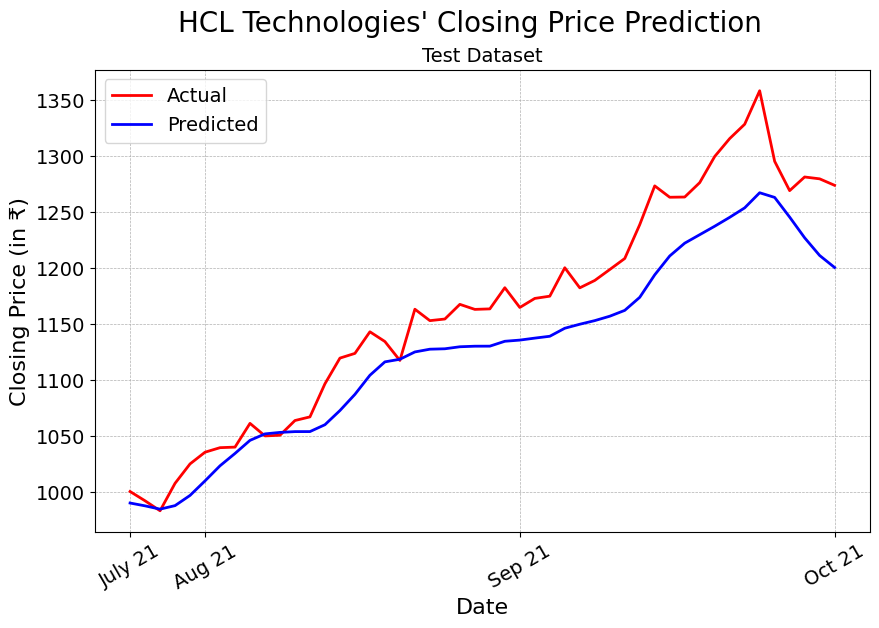

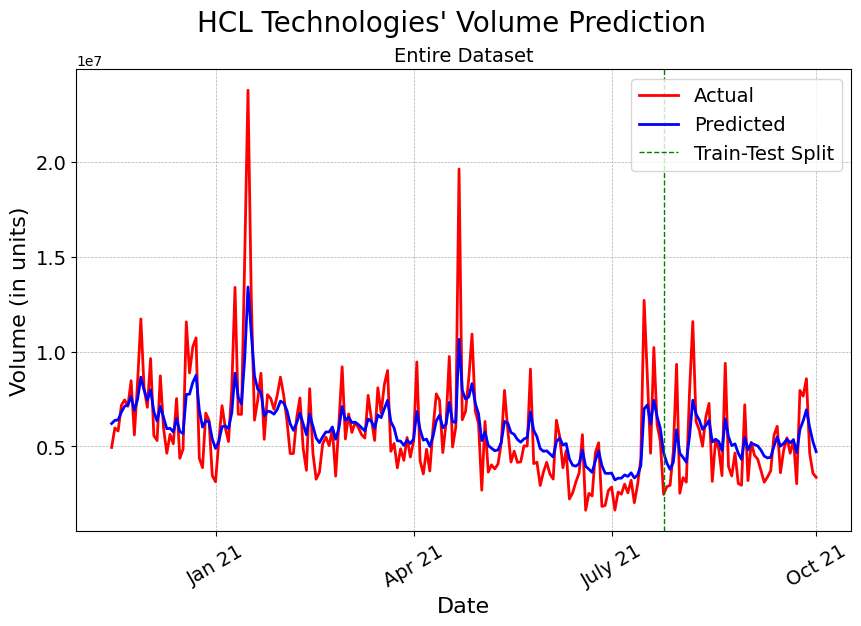

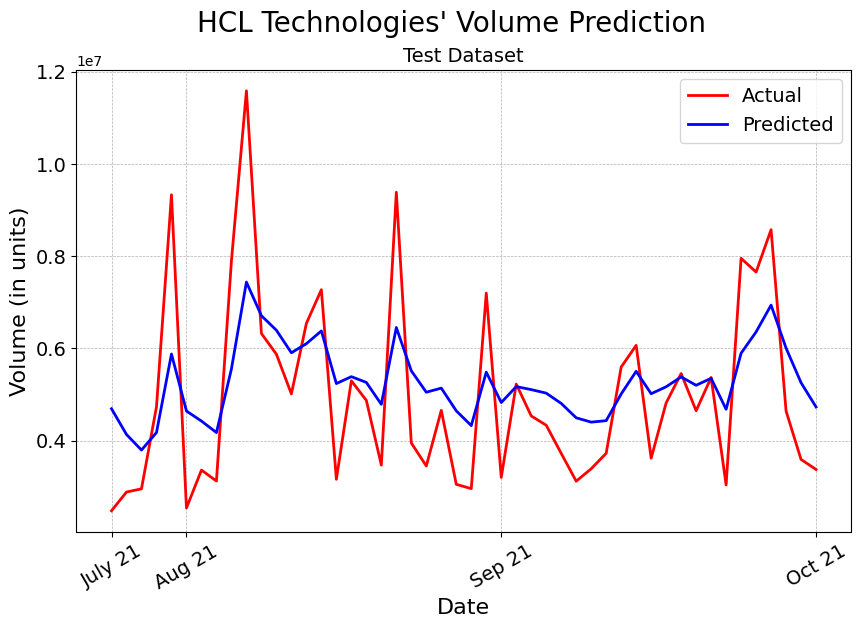

In [26]:
generate_predictions('HCL Technologies', interval=30, n_epochs=50, save_fig = True) # Best

31/31 [==============================] - 3s 92ms/step - loss: 0.0013
Epoch 40/50
31/31 [==============================] - 3s 95ms/step - loss: 0.0015
Epoch 41/50
31/31 [==============================] - 3s 103ms/step - loss: 0.0014
Epoch 42/50
31/31 [==============================] - 3s 91ms/step - loss: 0.0014
Epoch 43/50
31/31 [==============================] - 3s 97ms/step - loss: 0.0013
Epoch 44/50
31/31 [==============================] - 3s 90ms/step - loss: 0.0013
Epoch 45/50
31/31 [==============================] - 3s 98ms/step - loss: 0.0013
Epoch 46/50
31/31 [==============================] - 3s 95ms/step - loss: 0.0014
Epoch 47/50
31/31 [==============================] - 3s 92ms/step - loss: 0.0015
Epoch 48/50
31/31 [==============================] - 3s 90ms/step - loss: 0.0012
Epoch 49/50
31/31 [==============================] - 3s 95ms/step - loss: 0.0012
Epoch 50/50
31/31 [==============================] - 3s 96ms/step - loss: 0.0012
Time required for fitting model: 155.84

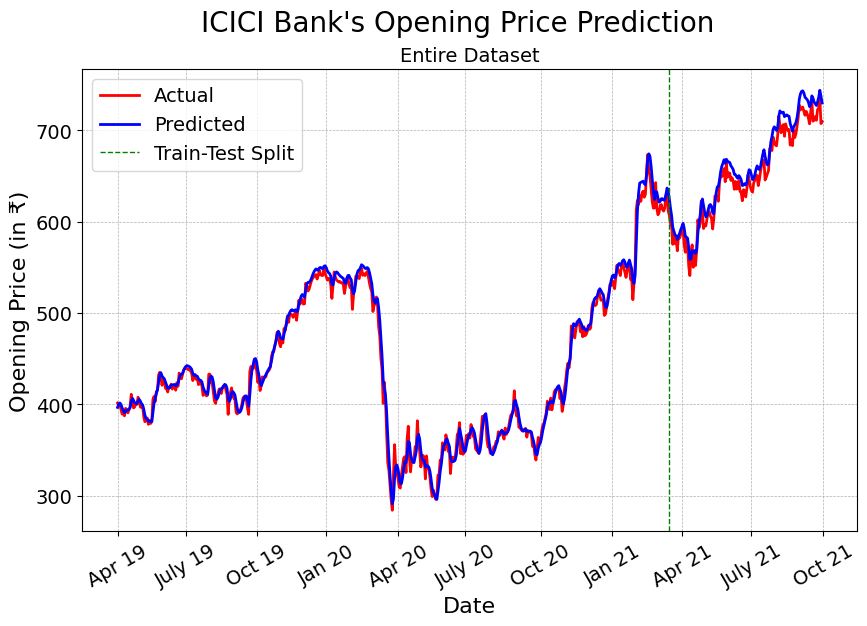

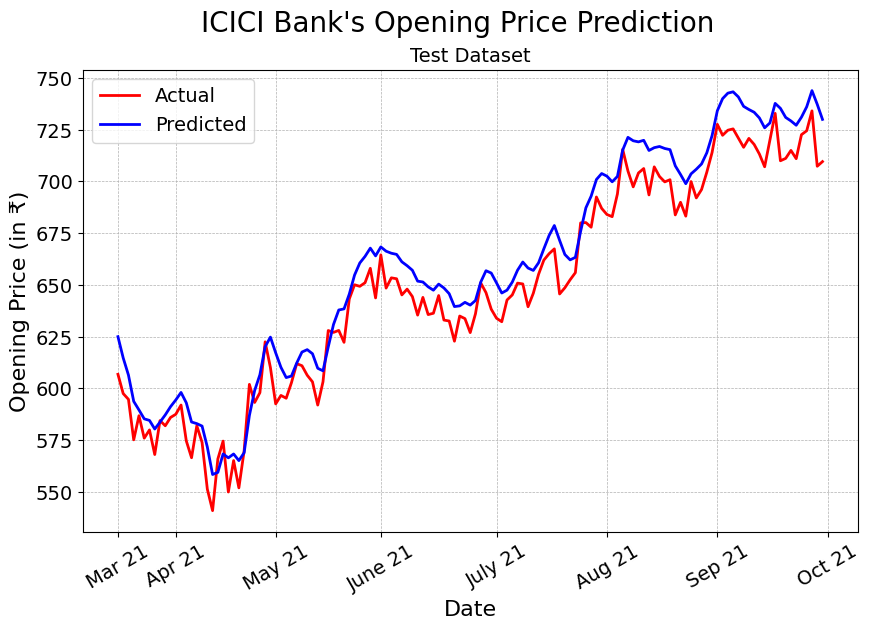

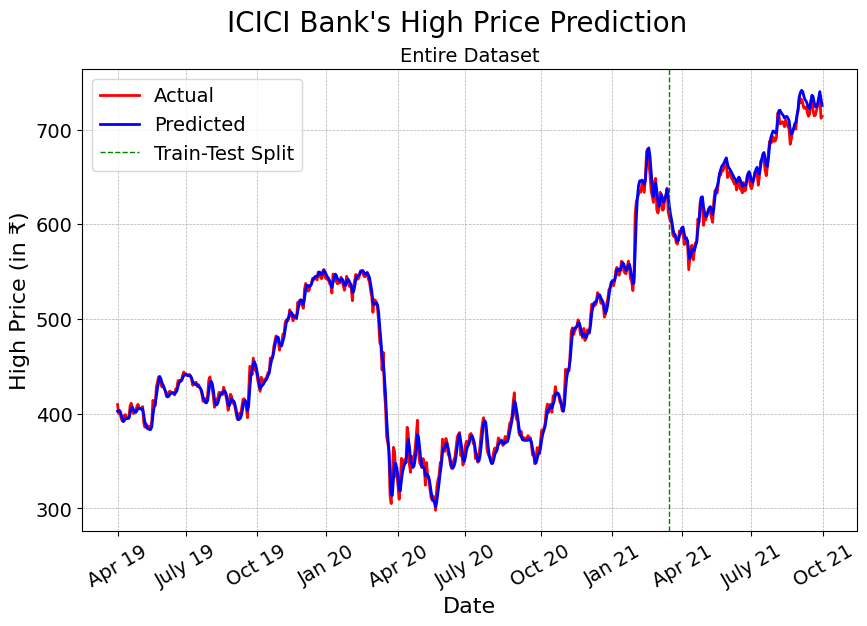

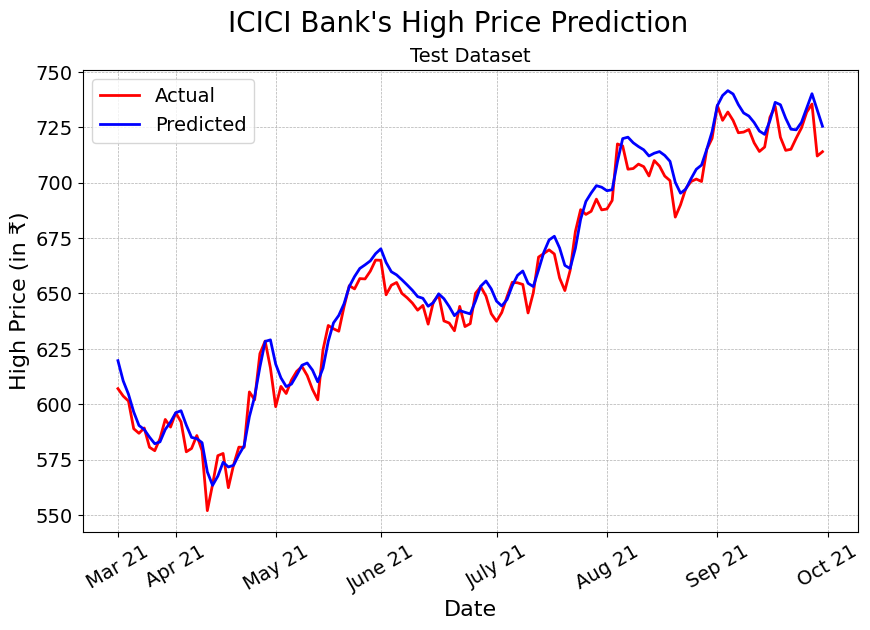

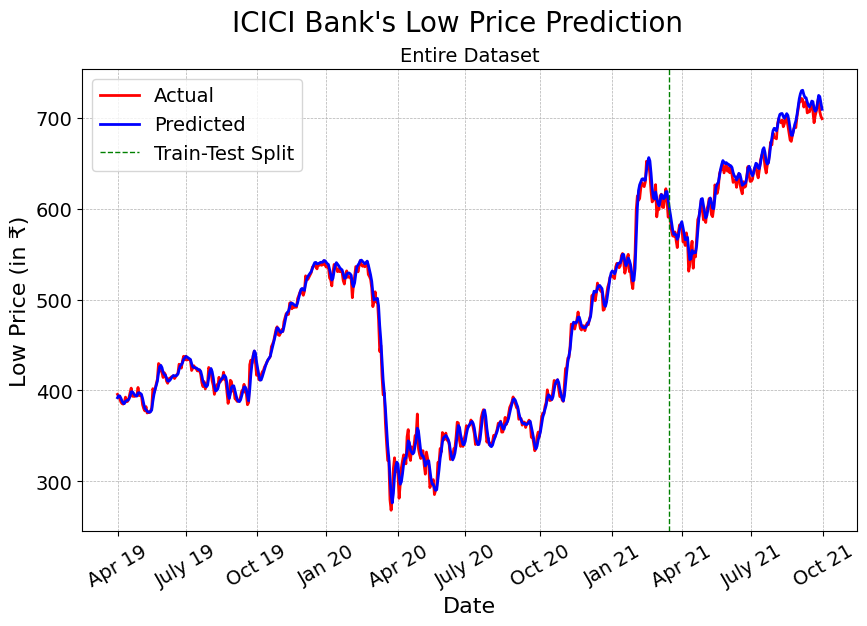

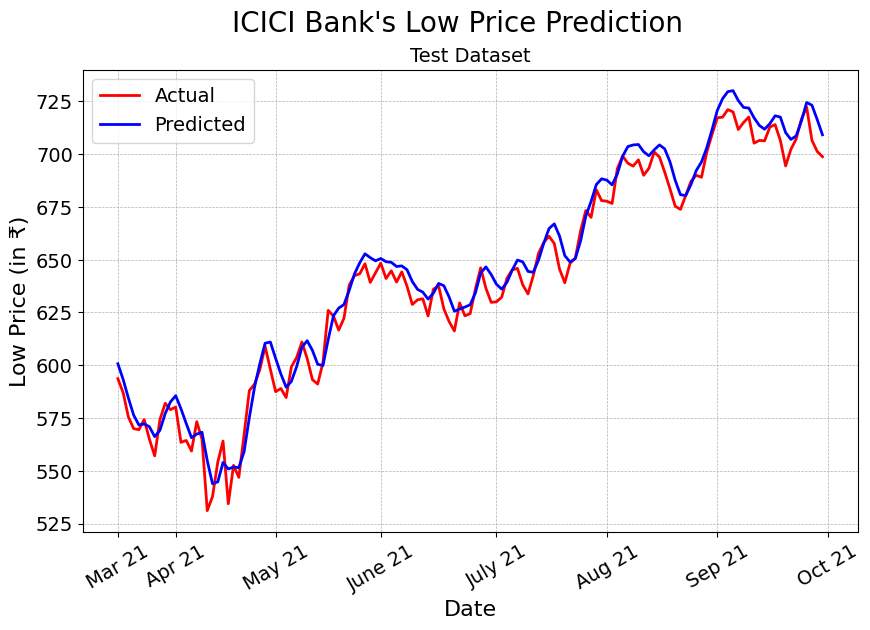

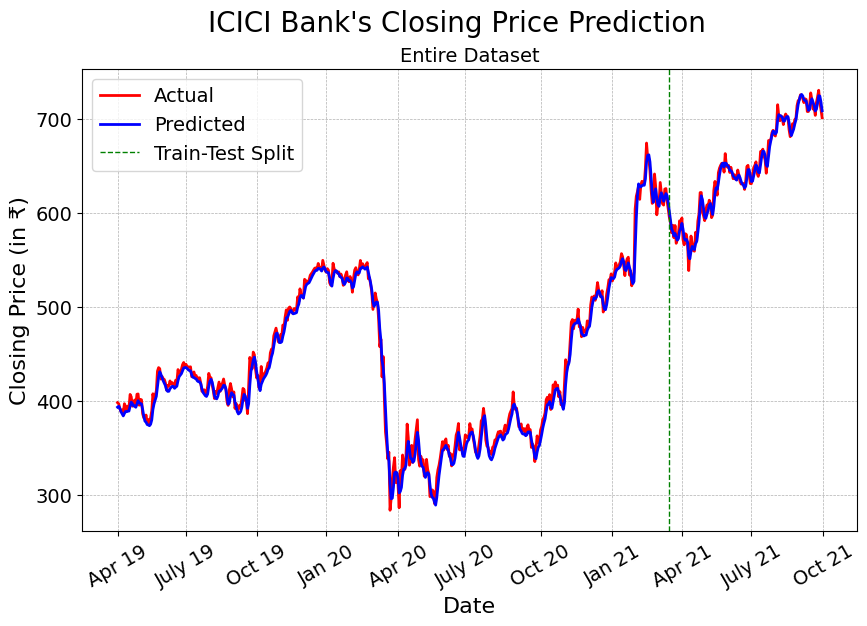

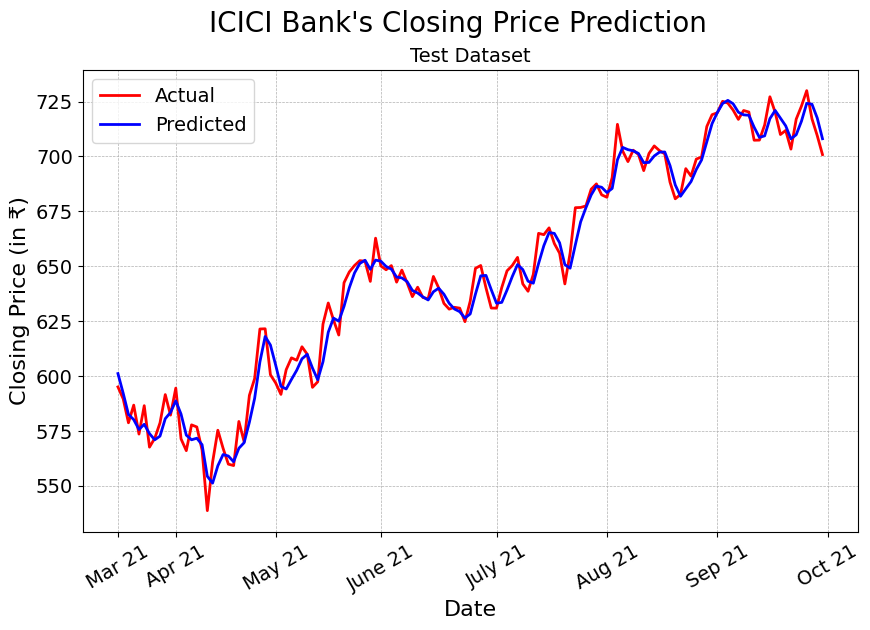

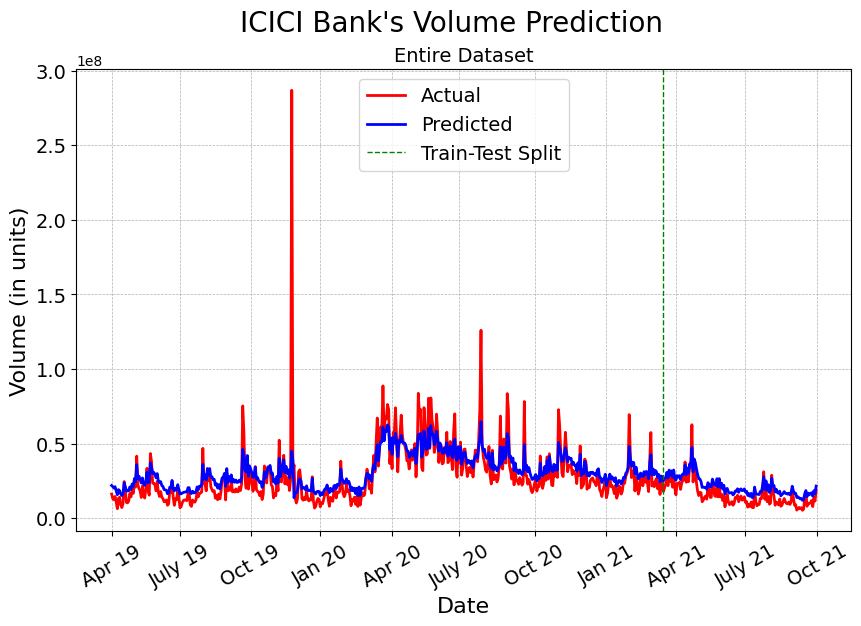

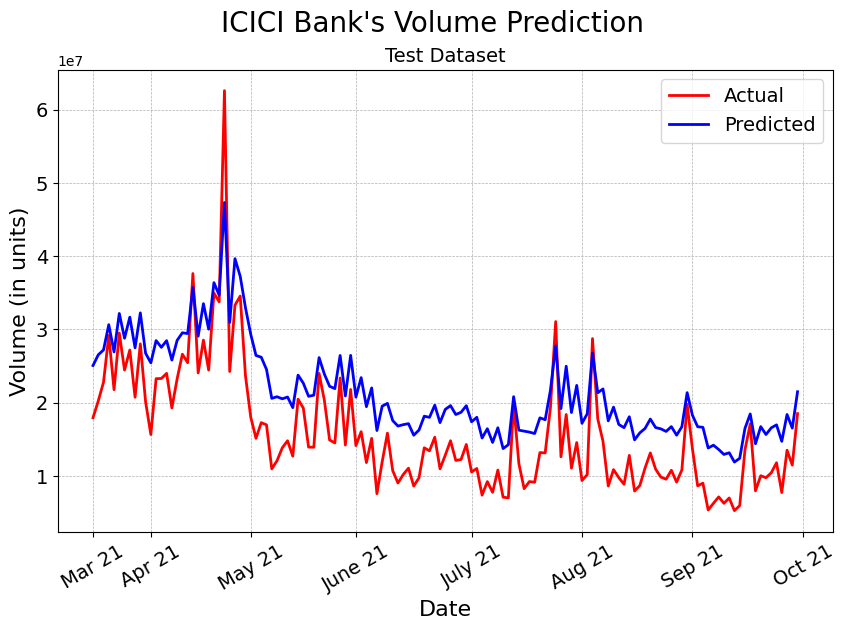

In [28]:
generate_predictions('ICICI Bank', save_fig = True)


Fitting LSTM Model for Open Column of Infosys Dataset
Shape of X_train: (170, 30)
Shape of Y_train: (170,)
Fitting the LSTM Model on the Train Set for Open Column of Infosys Dataset
Epoch 1/100
11/11 [==============================] - 14s 89ms/step - loss: 0.0493
Epoch 2/100
11/11 [==============================] - 1s 68ms/step - loss: 0.0114
Epoch 3/100
11/11 [==============================] - 1s 78ms/step - loss: 0.0066
Epoch 4/100
11/11 [==============================] - 1s 70ms/step - loss: 0.0058
Epoch 5/100
11/11 [==============================] - 1s 68ms/step - loss: 0.0049
Epoch 6/100
11/11 [==============================] - 1s 74ms/step - loss: 0.0034
Epoch 7/100
11/11 [==============================] - 1s 70ms/step - loss: 0.0040
Epoch 8/100
11/11 [==============================] - 1s 71ms/step - loss: 0.0036
Epoch 9/100
11/11 [==============================] - 1s 73ms/step - loss: 0.0033
Epoch 10/100
11/11 [==============================] - 1s 76ms/step - loss: 0.0041
Epoch

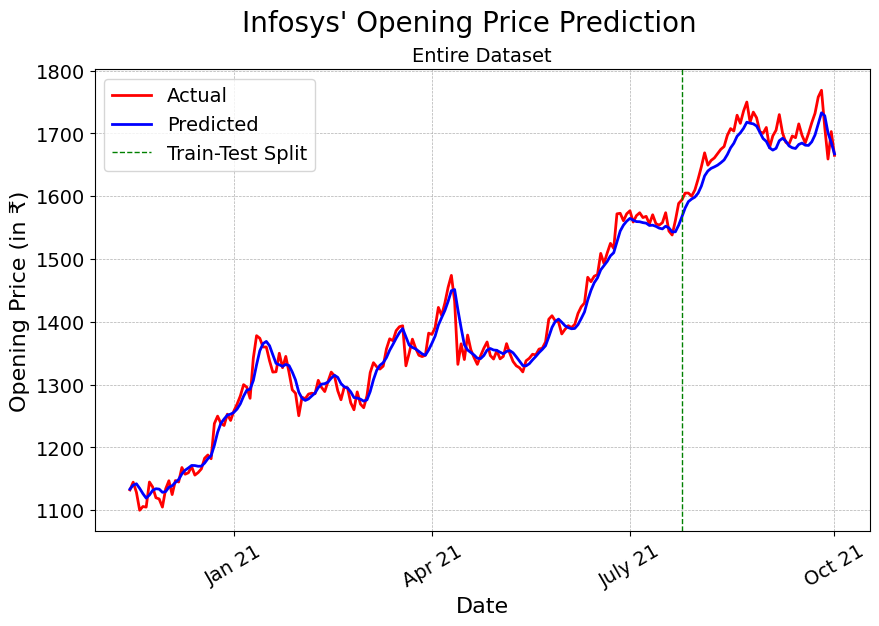

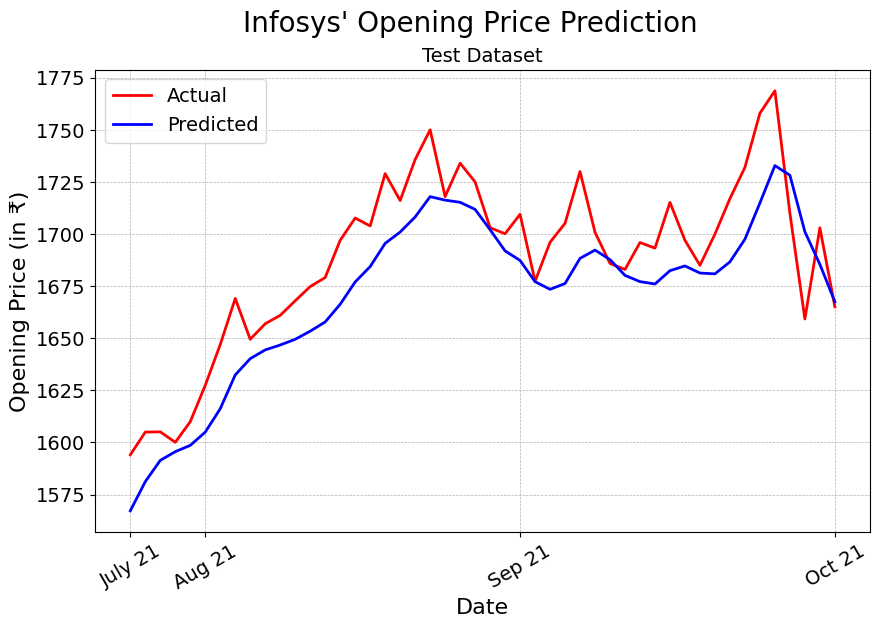

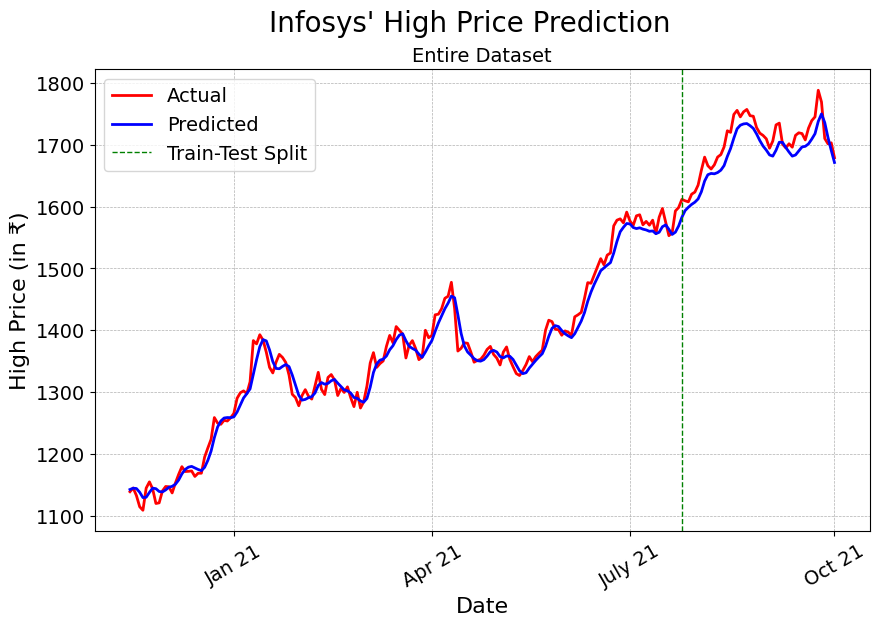

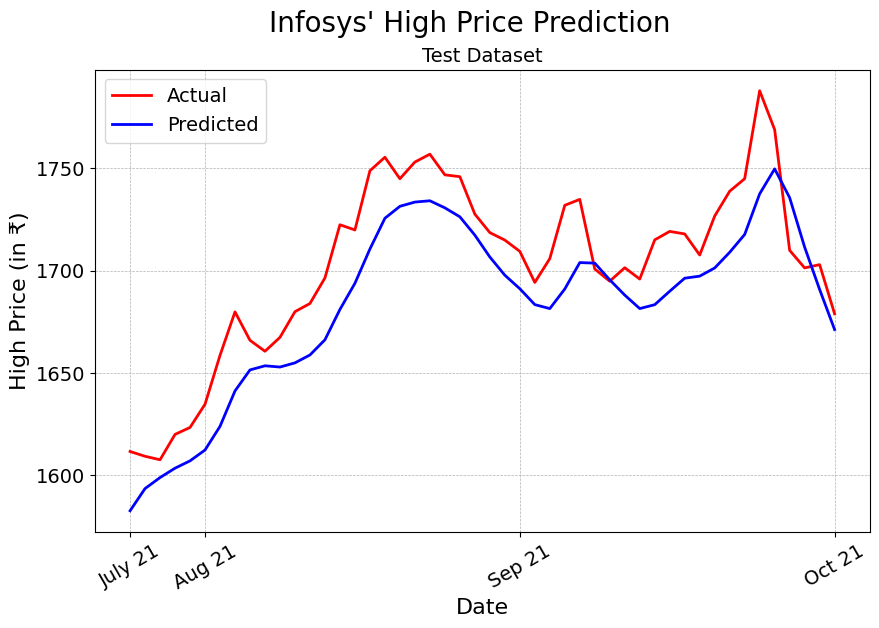

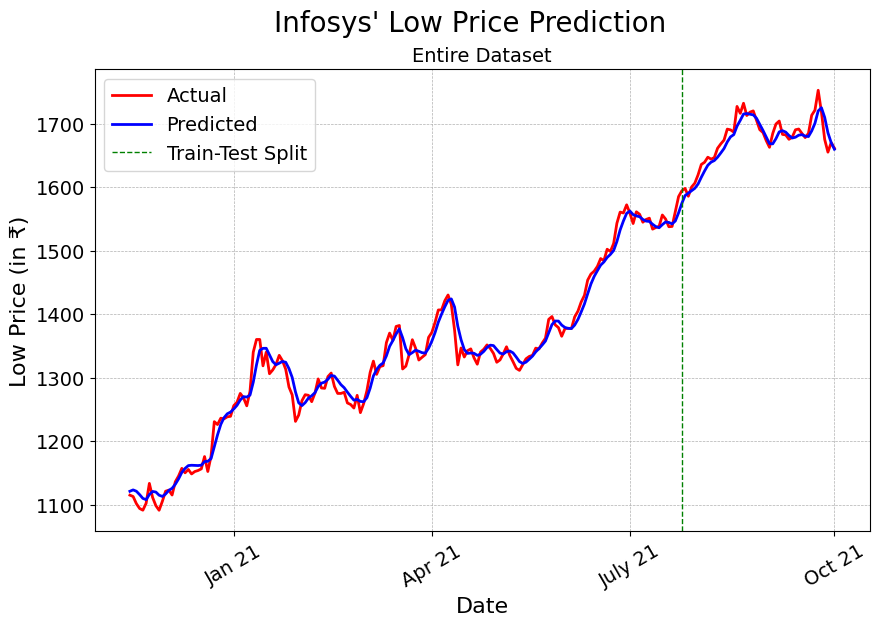

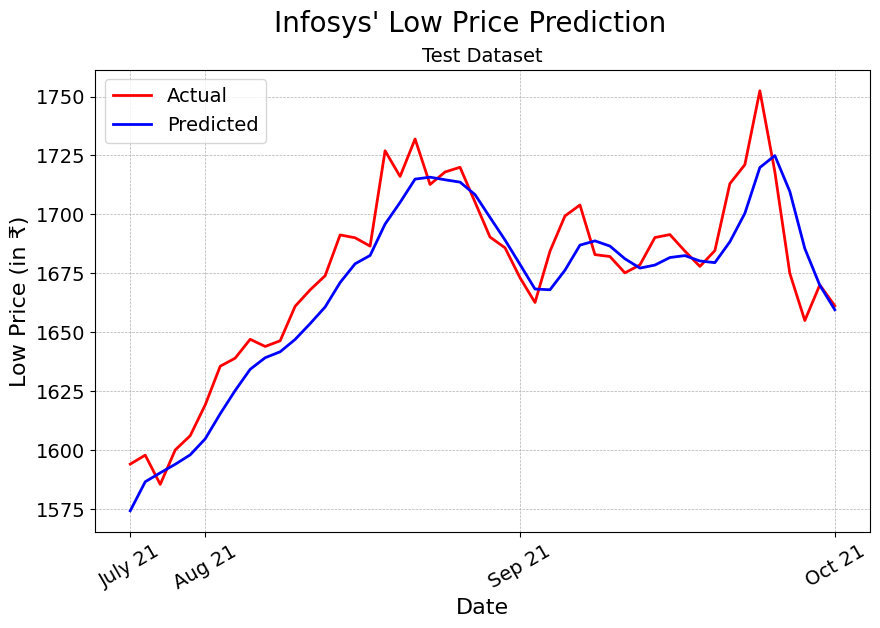

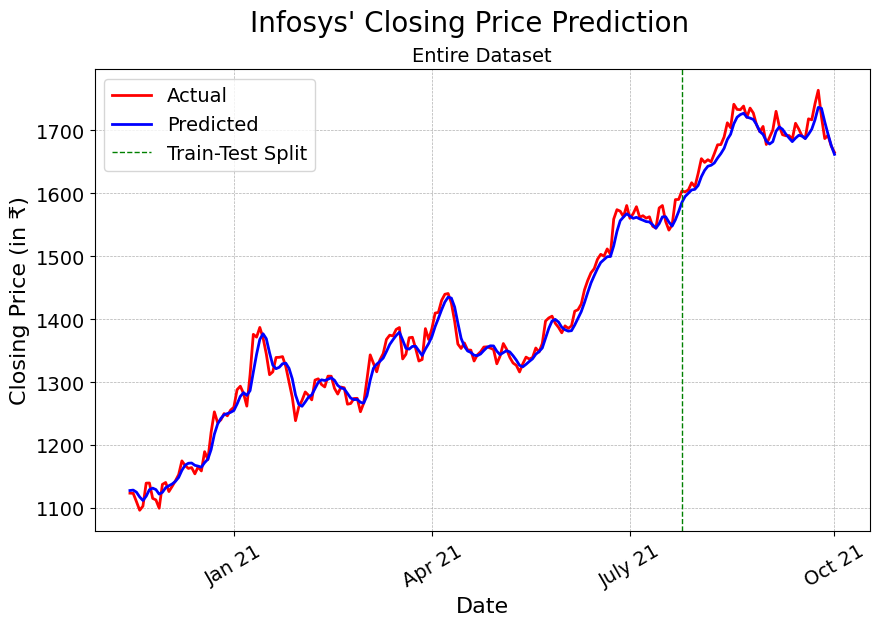

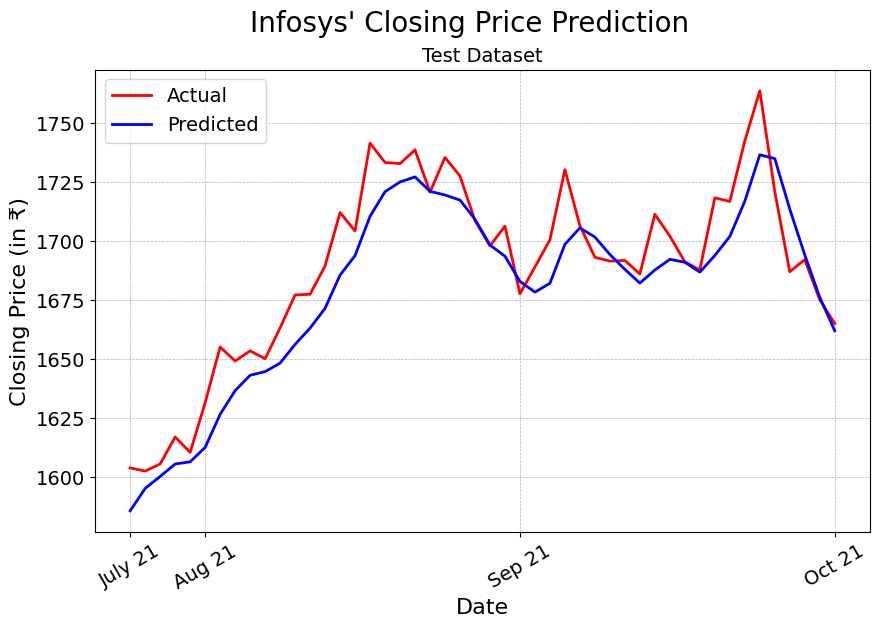

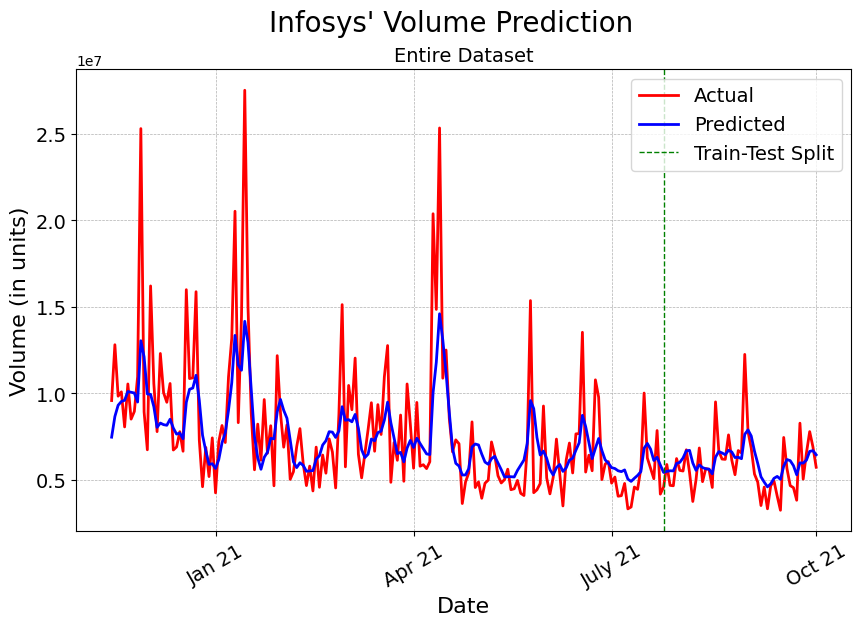

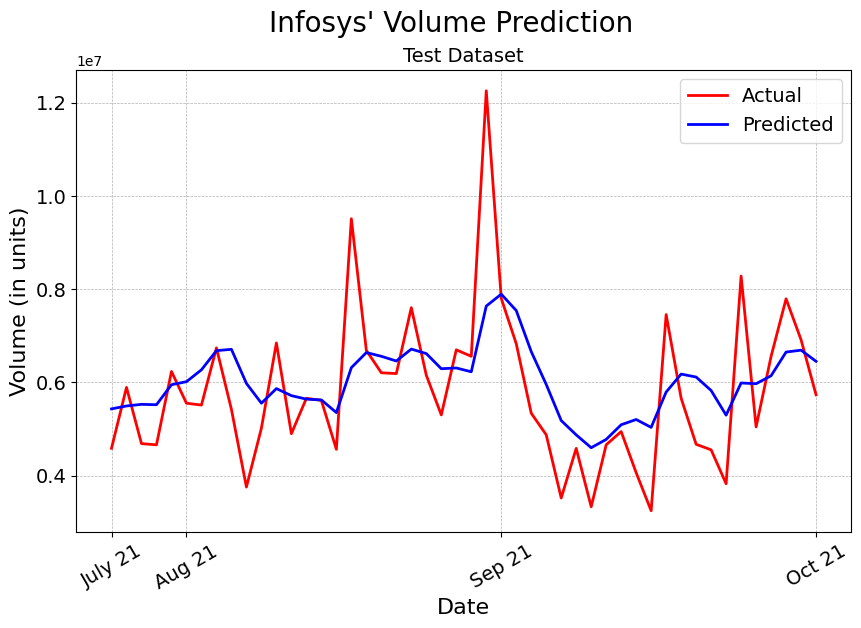

In [29]:
generate_predictions('Infosys', interval=30, n_epochs=100, save_fig = True)


Fitting LSTM Model for Open Column of SBI Dataset
Shape of X_train: (484, 60)
Shape of Y_train: (484,)
Fitting the LSTM Model on the Train Set for Open Column of SBI Dataset
Epoch 1/50
31/31 [==============================] - 22s 138ms/step - loss: 0.0281
Epoch 2/50
31/31 [==============================] - 4s 133ms/step - loss: 0.0056
Epoch 3/50
31/31 [==============================] - 5s 145ms/step - loss: 0.0044
Epoch 4/50
31/31 [==============================] - 5s 155ms/step - loss: 0.0039
Epoch 5/50
31/31 [==============================] - 4s 140ms/step - loss: 0.0040
Epoch 6/50
31/31 [==============================] - 4s 129ms/step - loss: 0.0031
Epoch 7/50
31/31 [==============================] - 4s 138ms/step - loss: 0.0029
Epoch 8/50
31/31 [==============================] - 4s 143ms/step - loss: 0.0031
Epoch 9/50
31/31 [==============================] - 4s 123ms/step - loss: 0.0030
Epoch 10/50
31/31 [==============================] - 4s 130ms/step - loss: 0.0027
Epoch 11/50
3

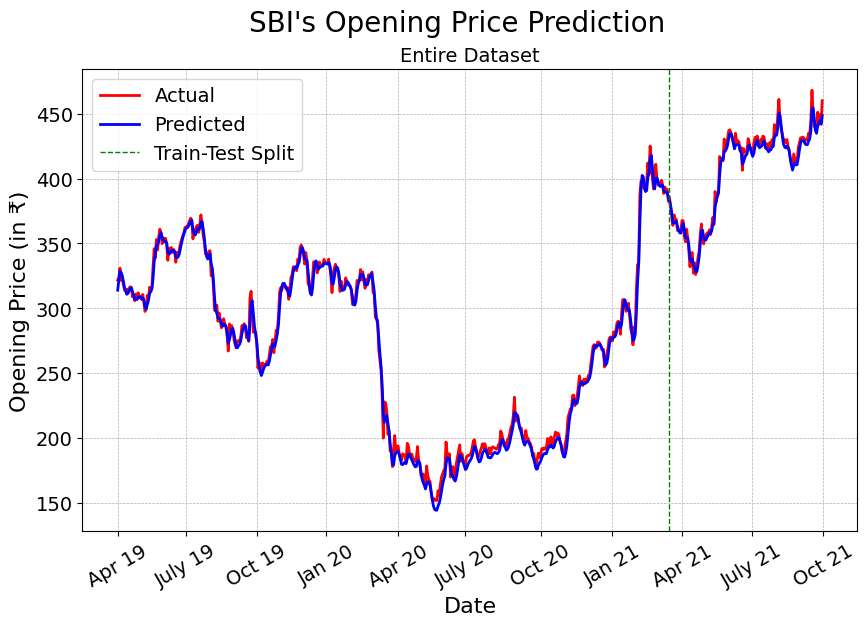

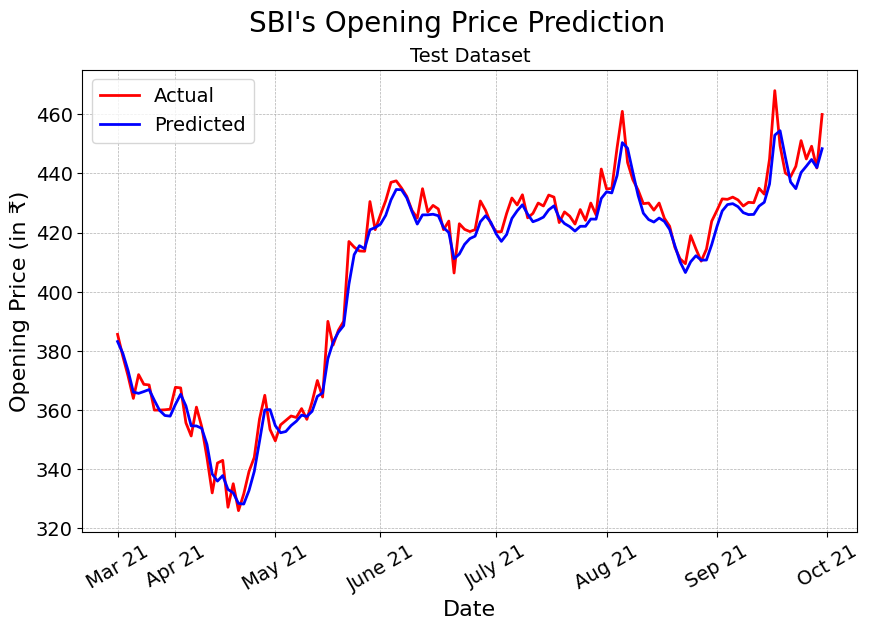

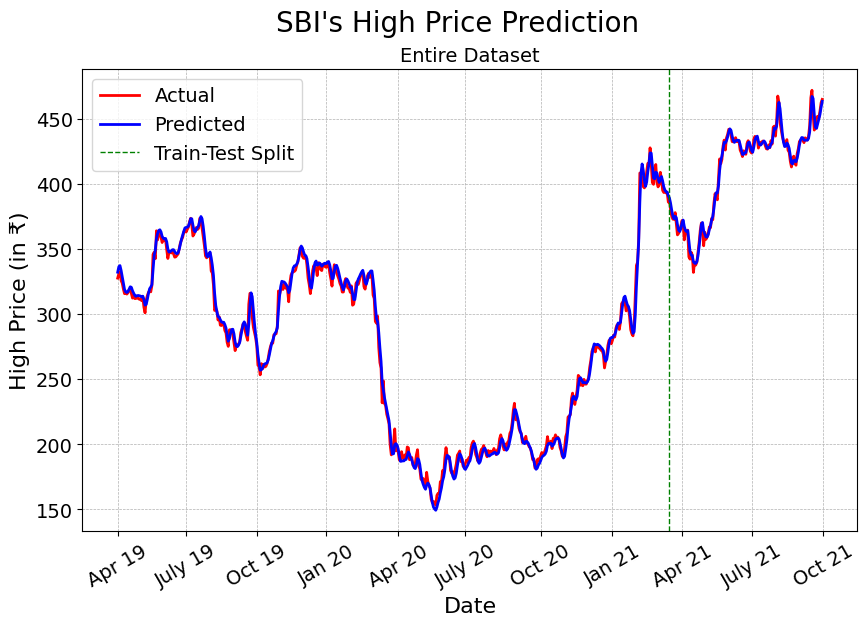

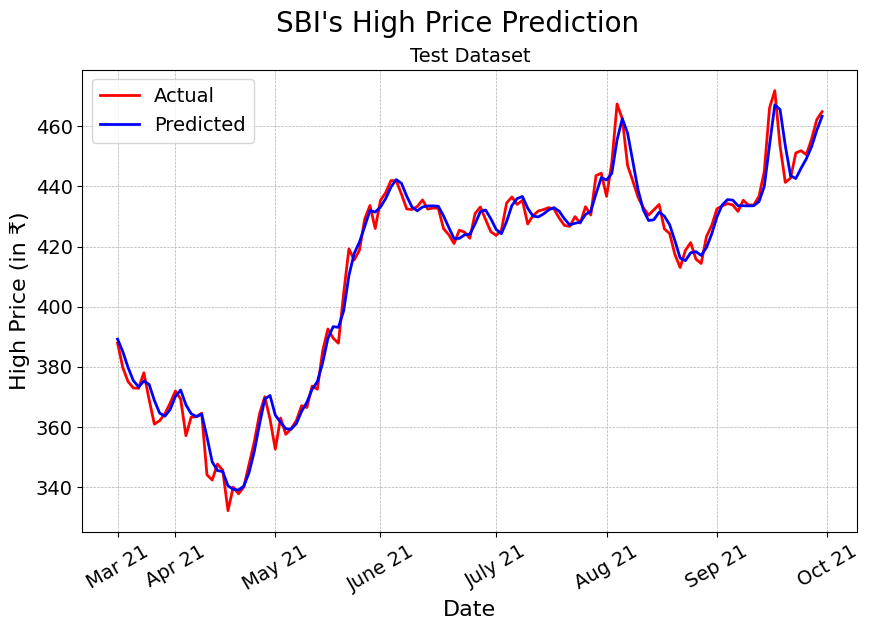

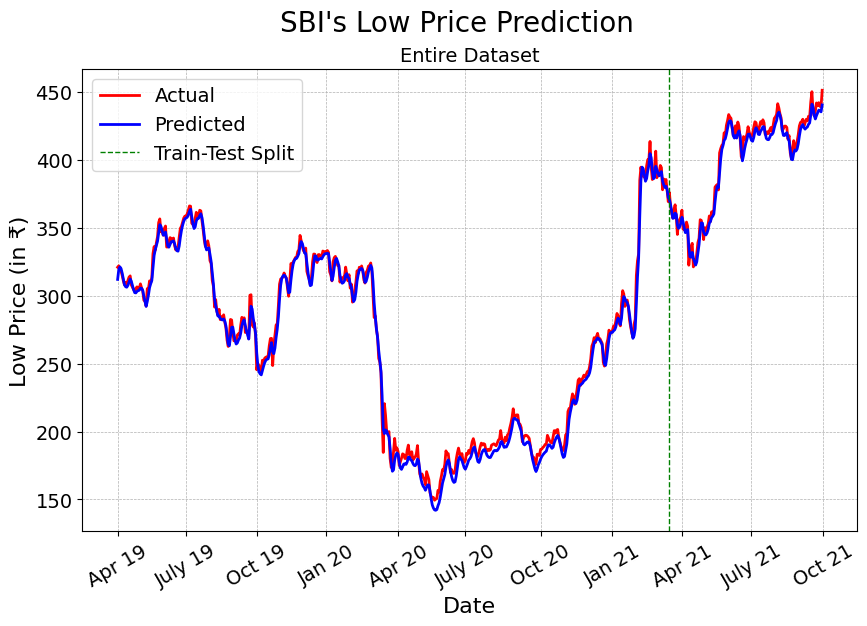

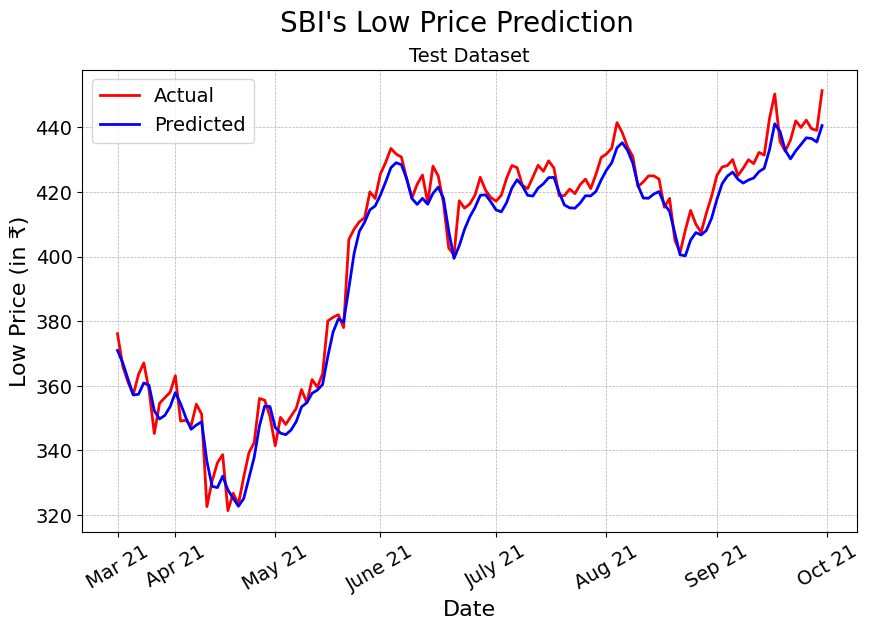

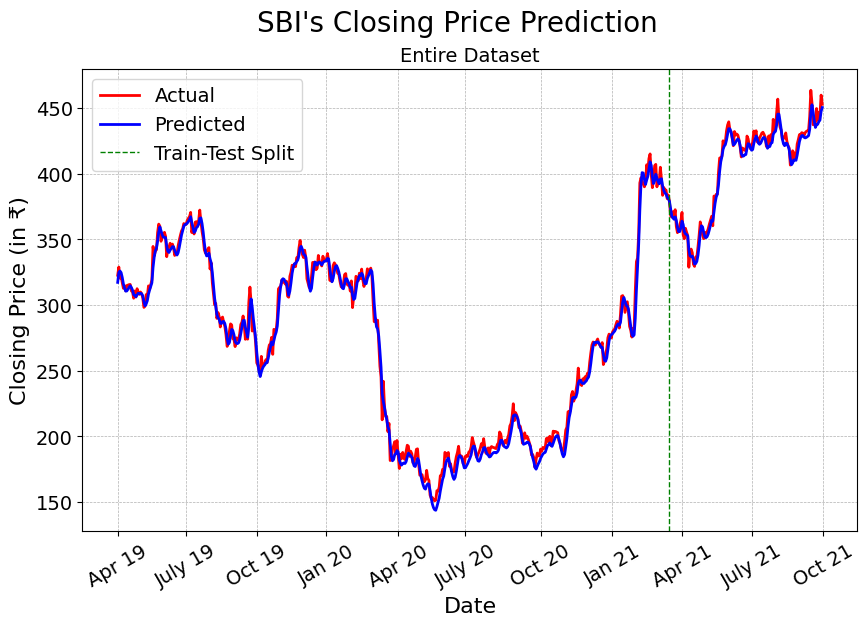

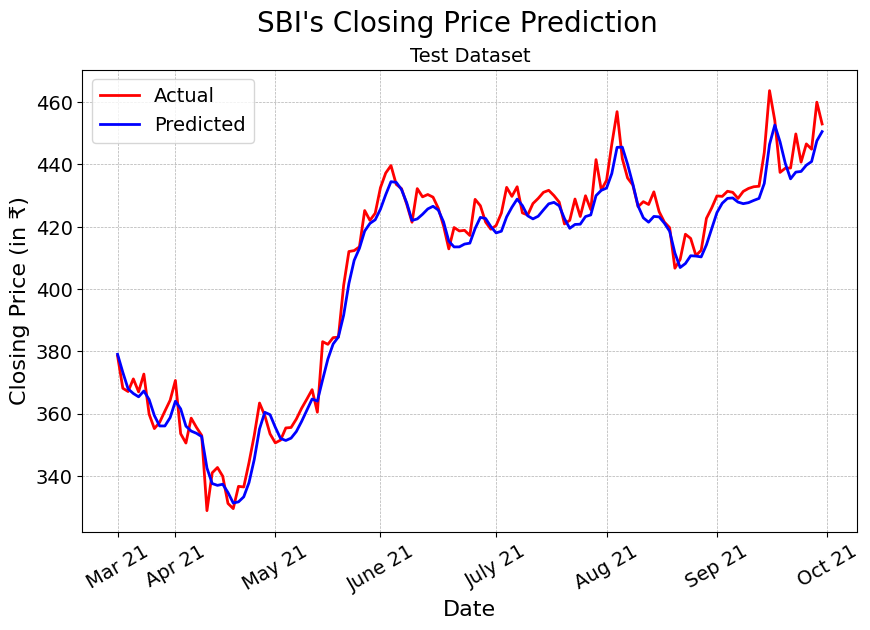

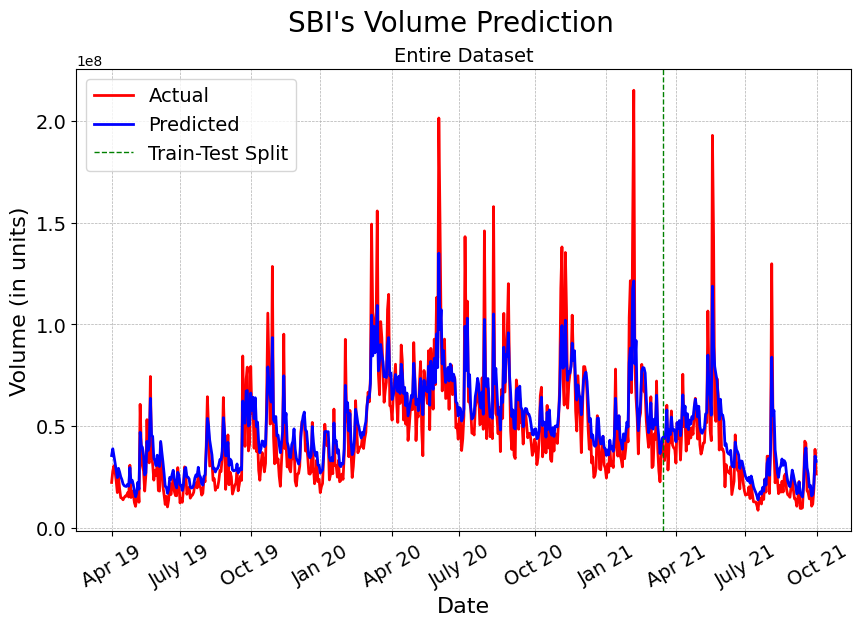

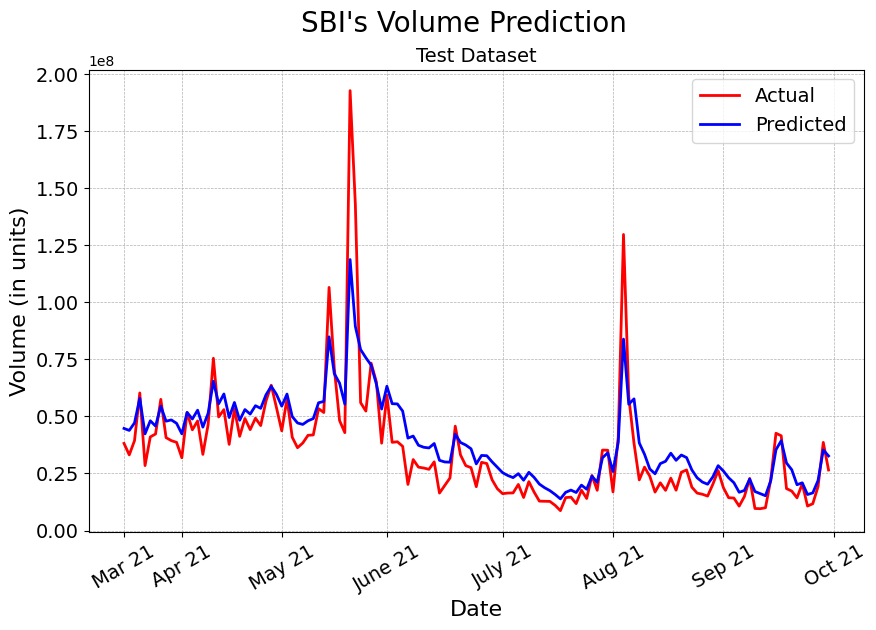

In [30]:
generate_predictions('SBI', save_fig = True)


Fitting LSTM Model for Open Column of USD-INR Exchange Rate Dataset
Shape of X_train: (516, 60)
Shape of Y_train: (516,)
Fitting the LSTM Model on the Train Set for Open Column of USD-INR Exchange Rate Dataset
Epoch 1/50
33/33 [==============================] - 8s 84ms/step - loss: 0.0278
Epoch 2/50
33/33 [==============================] - 3s 84ms/step - loss: 0.0067
Epoch 3/50
33/33 [==============================] - 3s 85ms/step - loss: 0.0048
Epoch 4/50
33/33 [==============================] - 3s 84ms/step - loss: 0.0046
Epoch 5/50
33/33 [==============================] - 3s 84ms/step - loss: 0.0044
Epoch 6/50
33/33 [==============================] - 3s 89ms/step - loss: 0.0040
Epoch 7/50
33/33 [==============================] - 3s 84ms/step - loss: 0.0037
Epoch 8/50
33/33 [==============================] - 3s 84ms/step - loss: 0.0041
Epoch 9/50
33/33 [==============================] - 3s 84ms/step - loss: 0.0039
Epoch 10/50
33/33 [==============================] - 3s 91ms/step - l

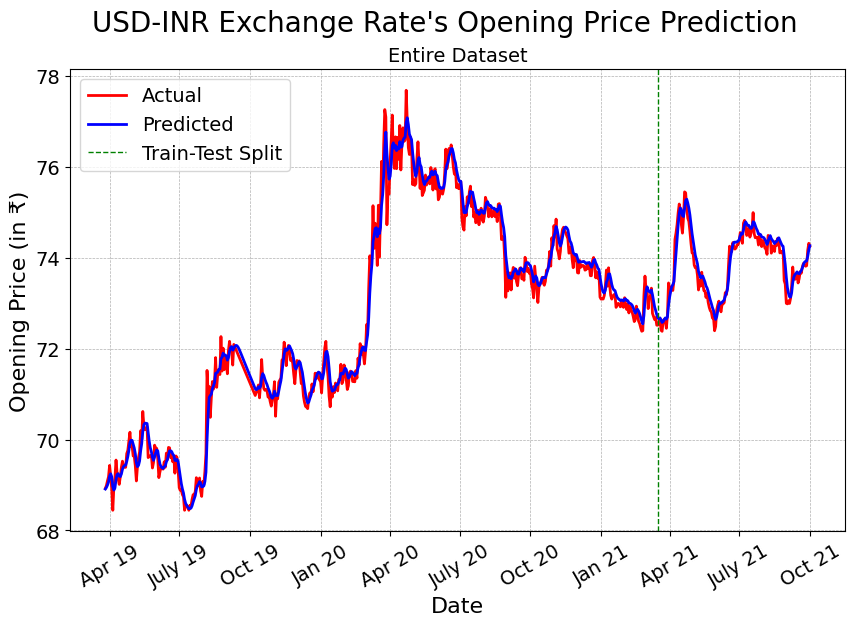

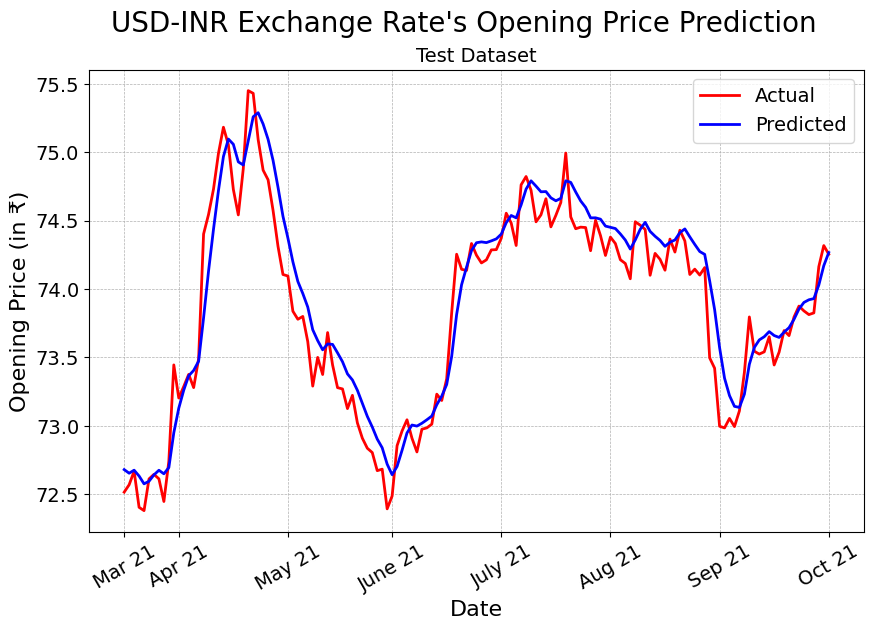

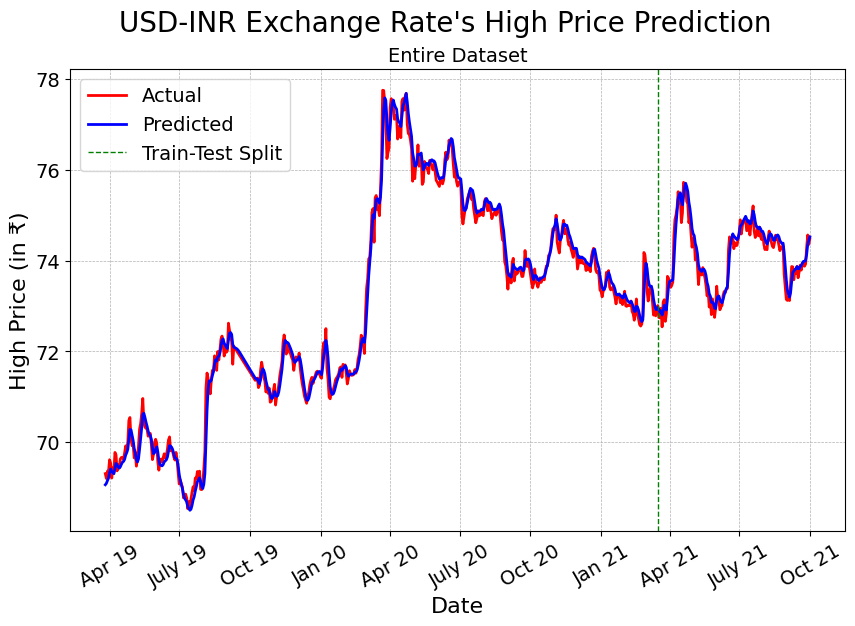

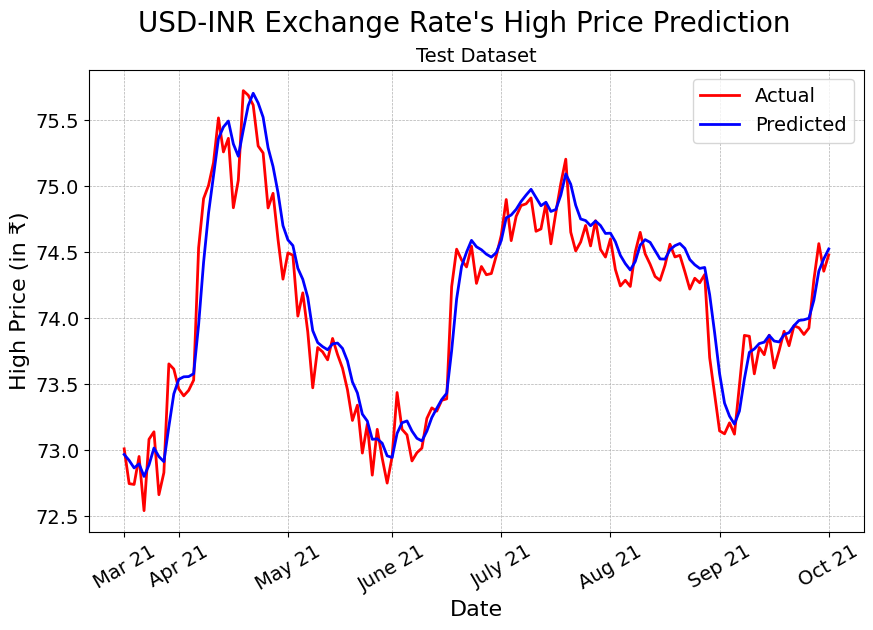

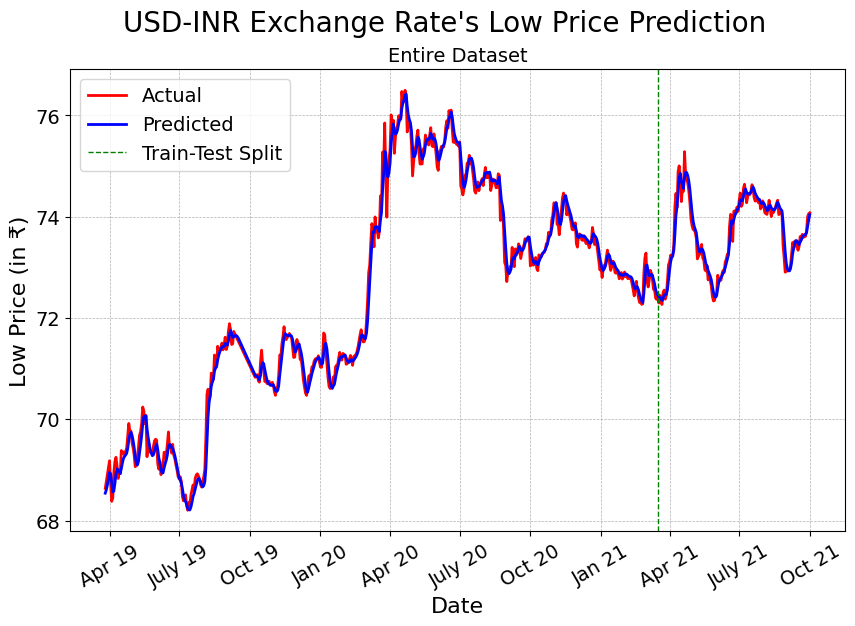

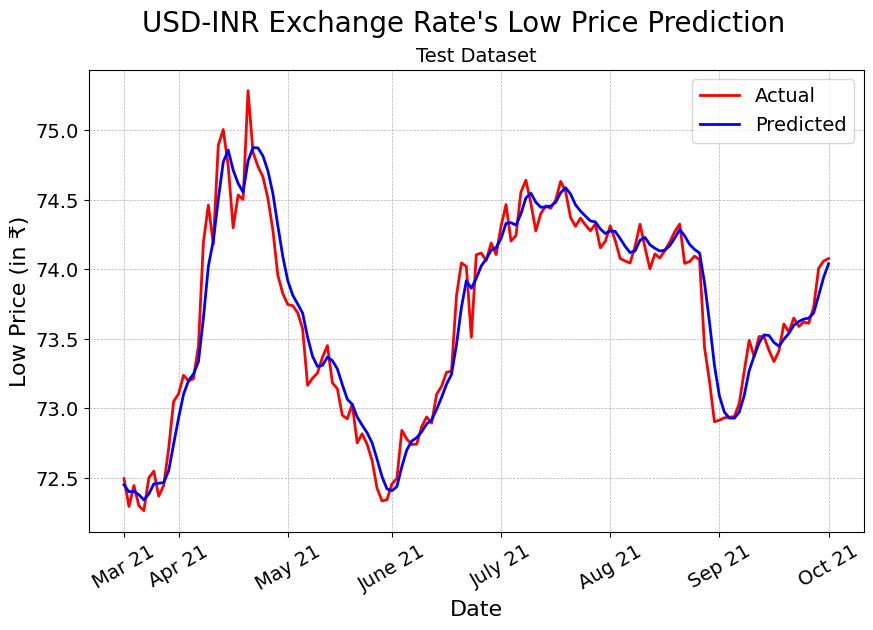

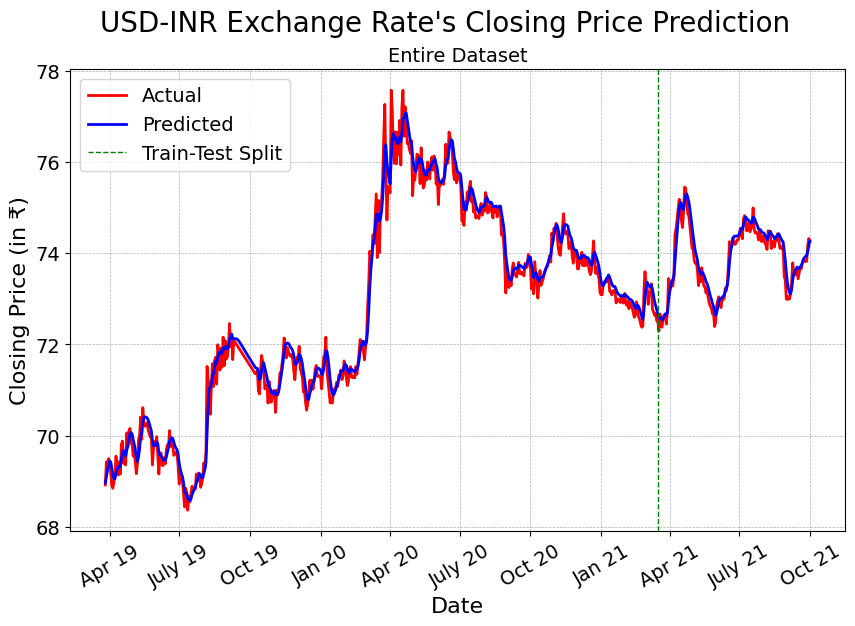

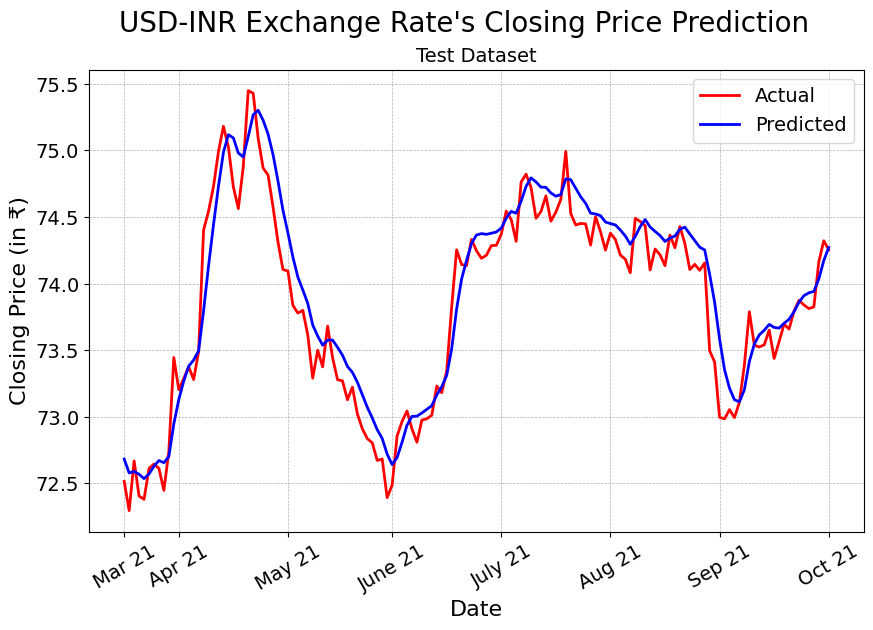

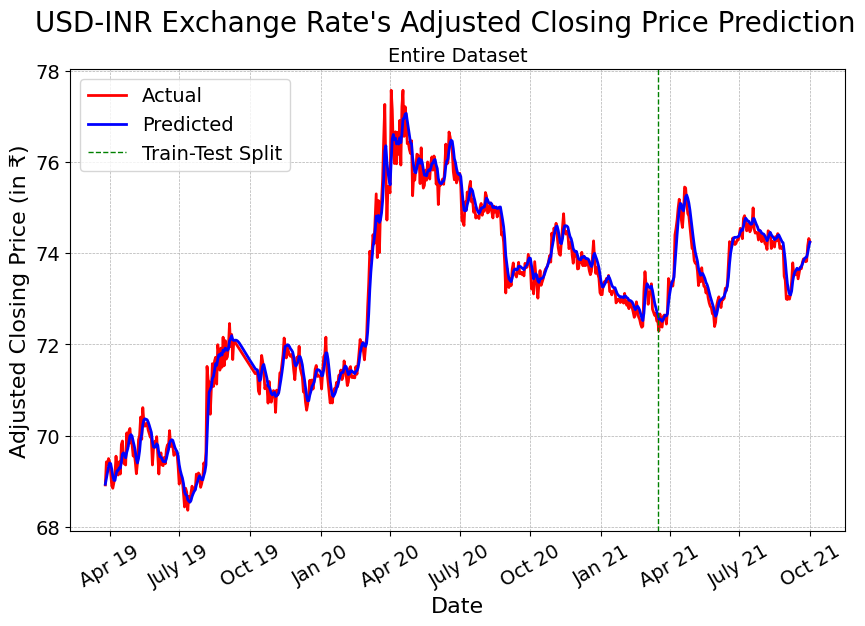

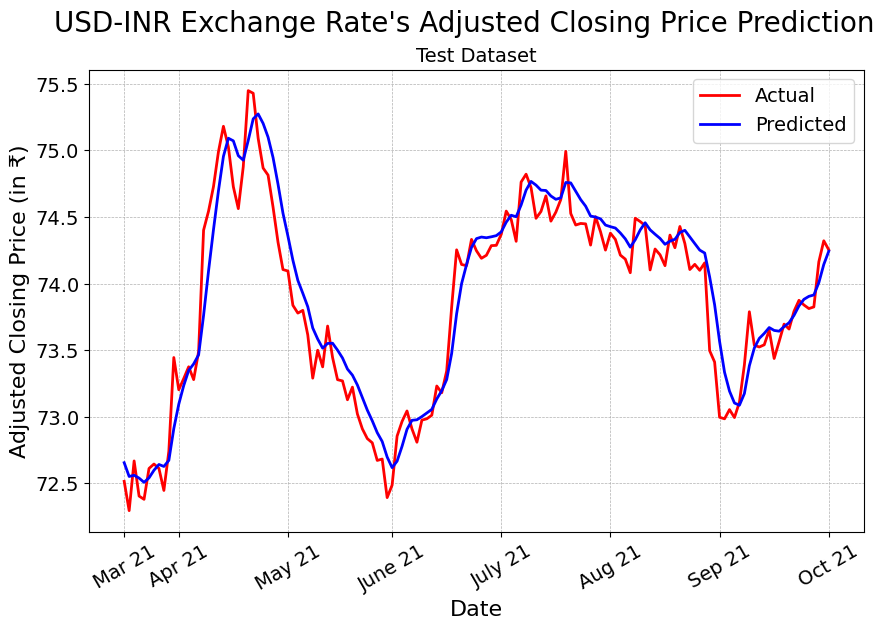

In [31]:
generate_predictions('USD-INR Exchange Rate', save_fig = True)


Fitting LSTM Model for Open Column of HDFC Bank Dataset
Shape of X_train: (484, 60)
Shape of Y_train: (484,)
Fitting the LSTM Model on the Train Set for Open Column of HDFC Bank Dataset
Epoch 1/50
31/31 [==============================] - 9s 91ms/step - loss: 0.0410
Epoch 2/50
31/31 [==============================] - 3s 90ms/step - loss: 0.0079
Epoch 3/50
31/31 [==============================] - 3s 97ms/step - loss: 0.0061
Epoch 4/50
31/31 [==============================] - 3s 89ms/step - loss: 0.0054
Epoch 5/50
31/31 [==============================] - 3s 99ms/step - loss: 0.0052
Epoch 6/50
31/31 [==============================] - 3s 93ms/step - loss: 0.0045
Epoch 7/50
31/31 [==============================] - 3s 89ms/step - loss: 0.0046
Epoch 8/50
31/31 [==============================] - 3s 90ms/step - loss: 0.0047
Epoch 9/50
31/31 [==============================] - 3s 90ms/step - loss: 0.0039
Epoch 10/50
31/31 [==============================] - 3s 91ms/step - loss: 0.0036
Epoch 11/50


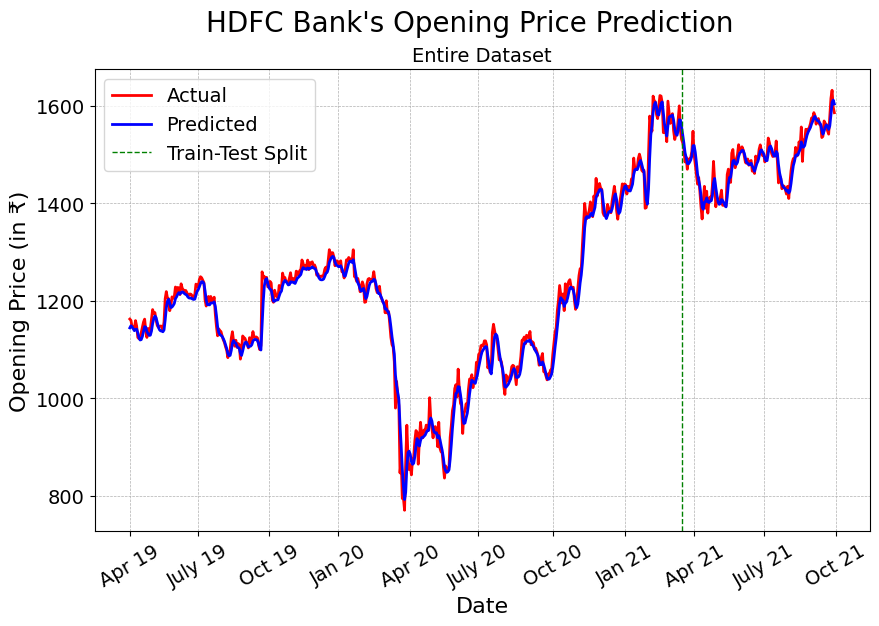

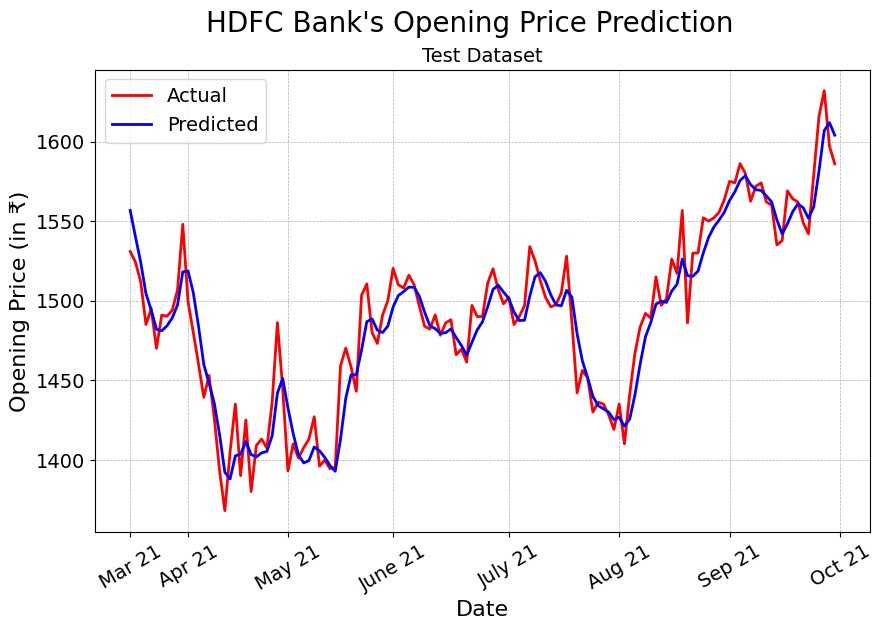

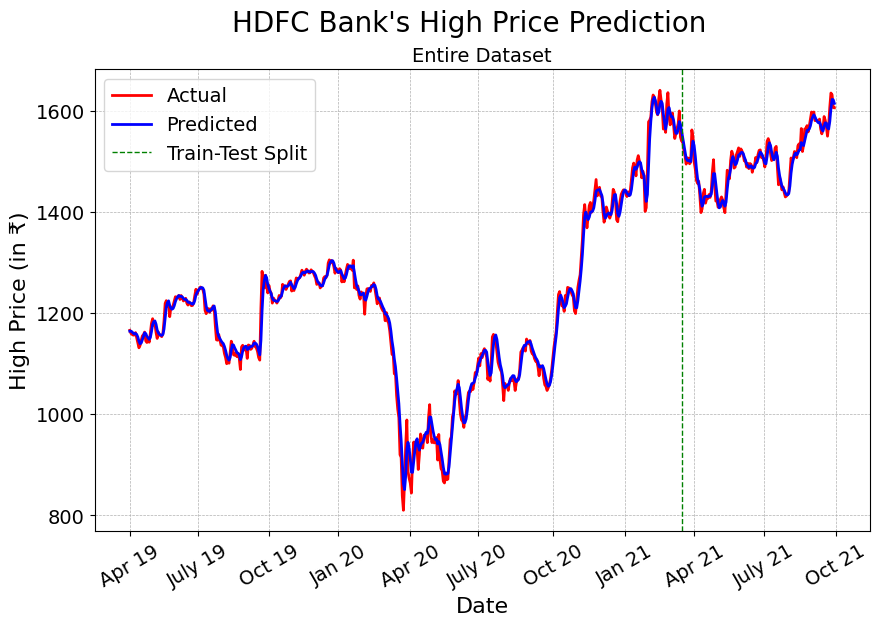

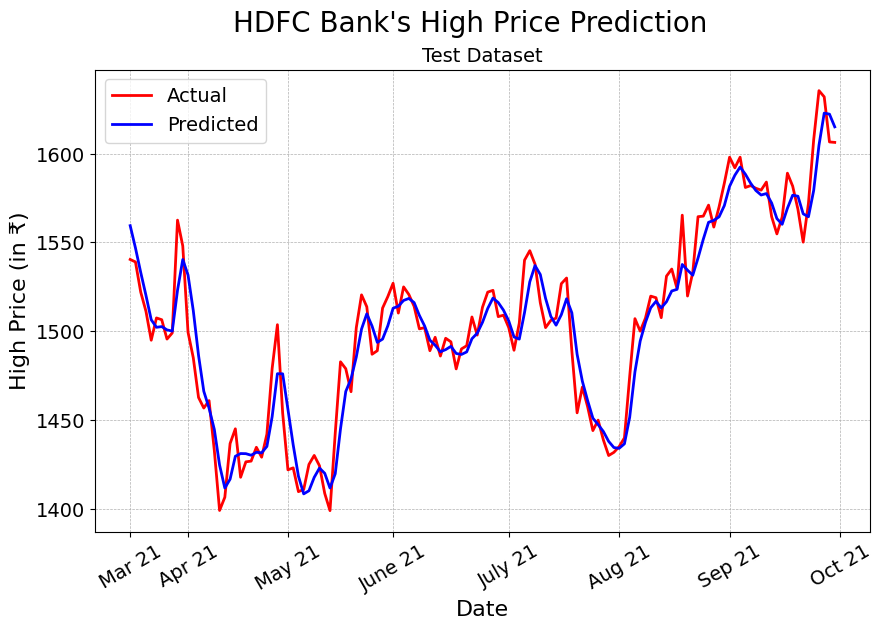

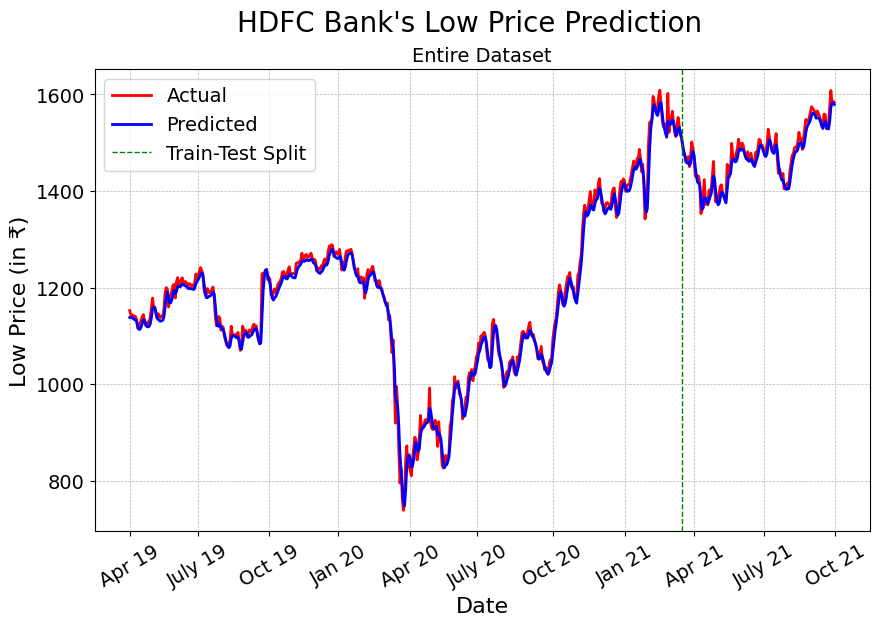

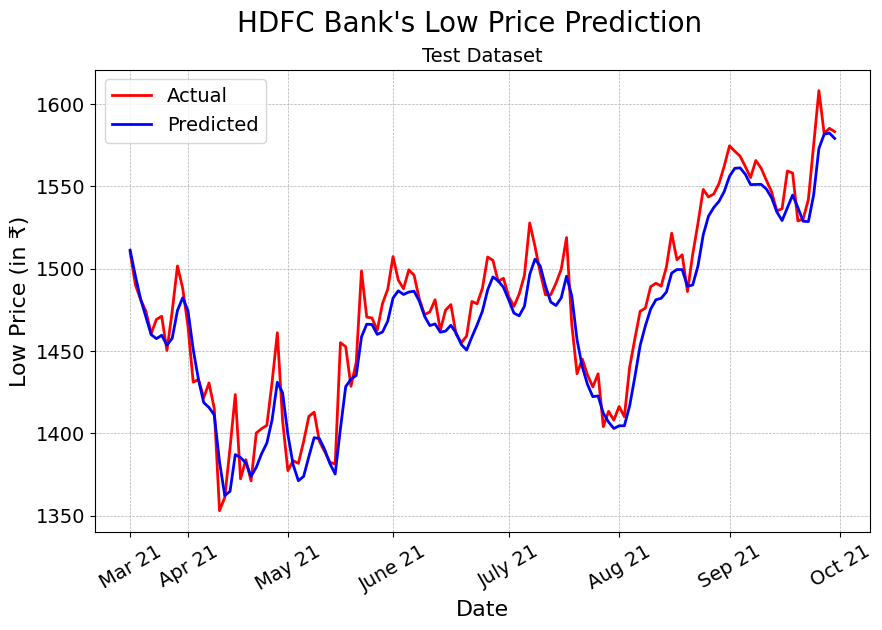

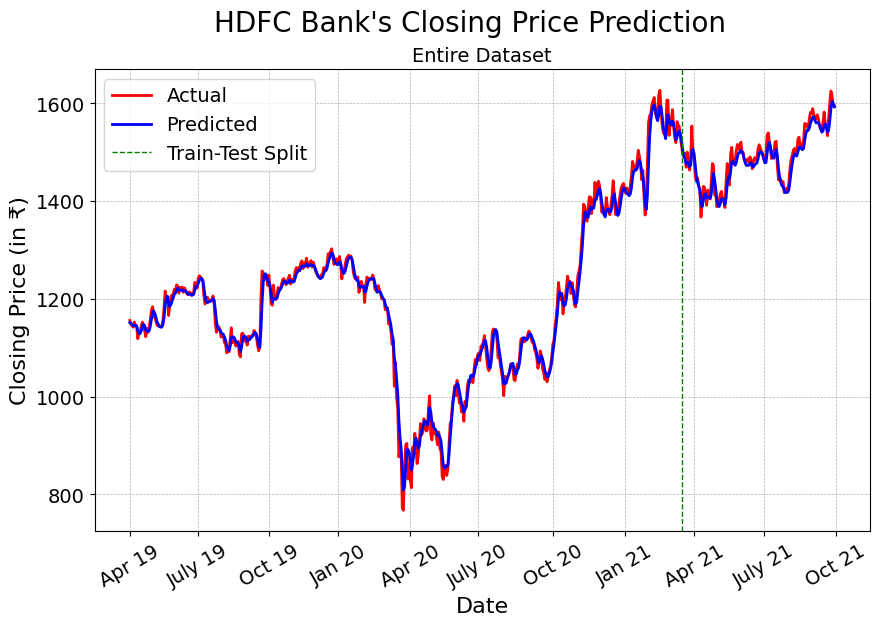

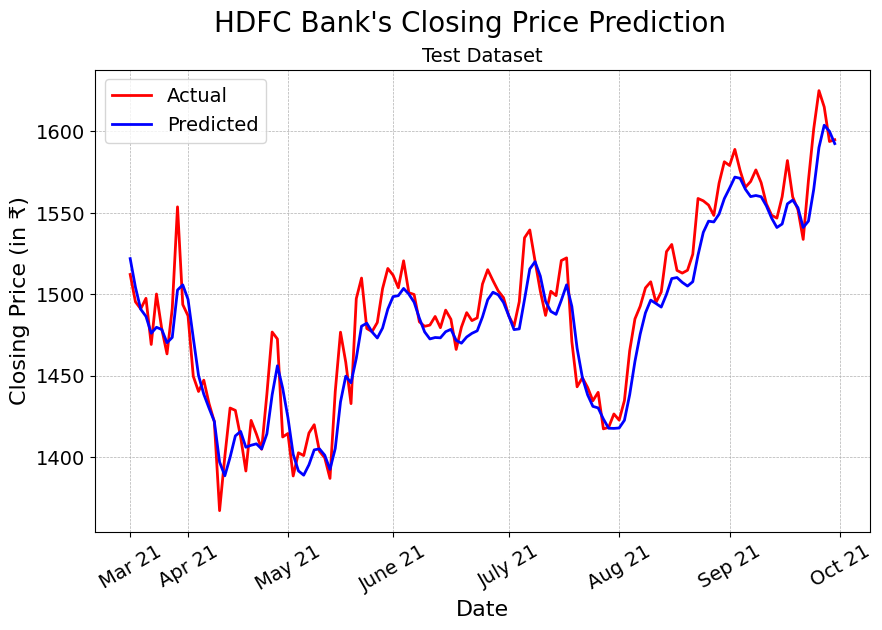

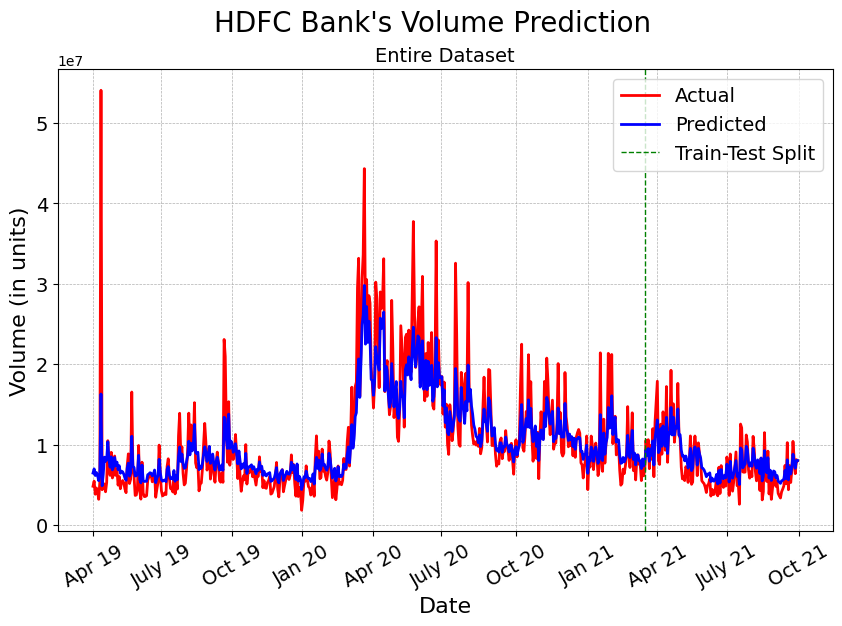

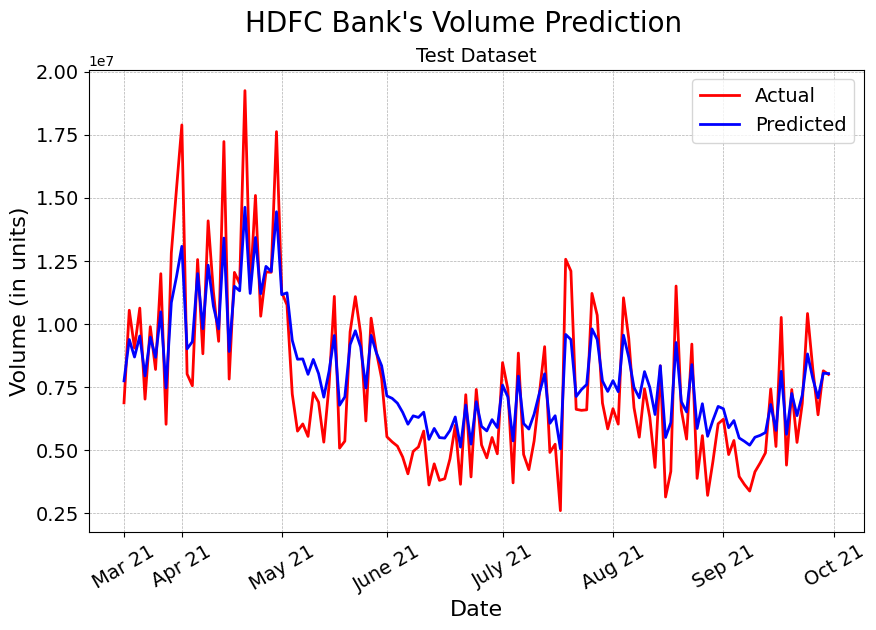

In [32]:
generate_predictions('HDFC Bank', save_fig = True)


Fitting LSTM Model for Open Column of Infosys Dataset
Shape of X_train: (170, 30)
Shape of Y_train: (170,)
Fitting the LSTM Model on the Train Set for Open Column of Infosys Dataset
Epoch 1/100
11/11 [==============================] - 7s 59ms/step - loss: 0.0403
Epoch 2/100
11/11 [==============================] - 1s 57ms/step - loss: 0.0096
Epoch 3/100
11/11 [==============================] - 1s 55ms/step - loss: 0.0060
Epoch 4/100
11/11 [==============================] - 1s 61ms/step - loss: 0.0044
Epoch 5/100
11/11 [==============================] - 1s 51ms/step - loss: 0.0039
Epoch 6/100
11/11 [==============================] - 1s 53ms/step - loss: 0.0038
Epoch 7/100
11/11 [==============================] - 1s 49ms/step - loss: 0.0046
Epoch 8/100
11/11 [==============================] - 1s 47ms/step - loss: 0.0041
Epoch 9/100
11/11 [==============================] - 1s 47ms/step - loss: 0.0035
Epoch 10/100
11/11 [==============================] - 1s 47ms/step - loss: 0.0037
Epoch 

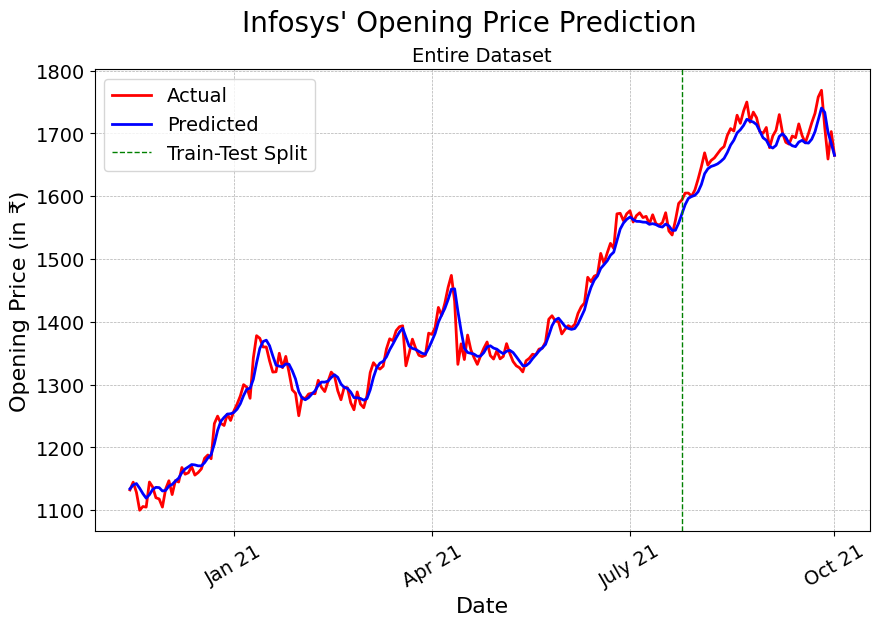

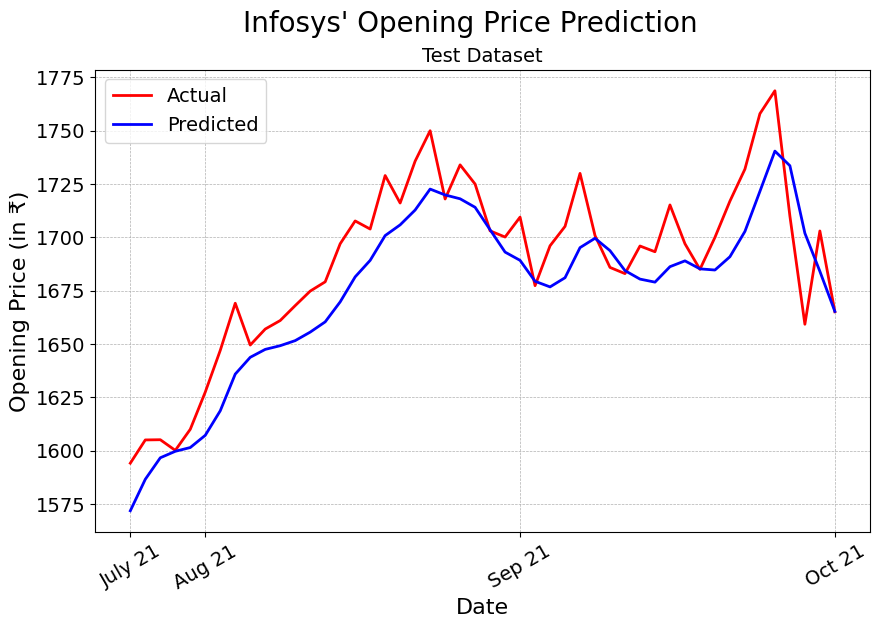

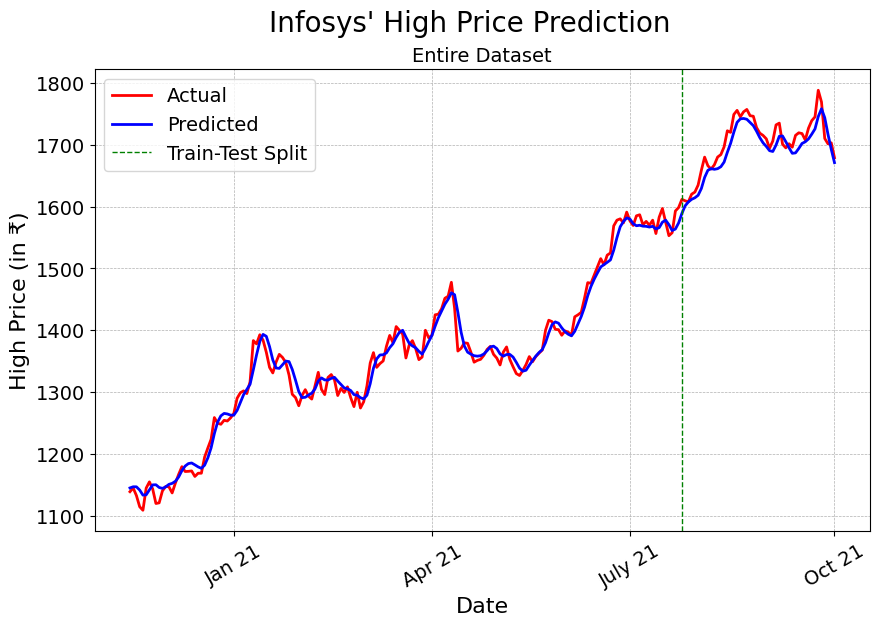

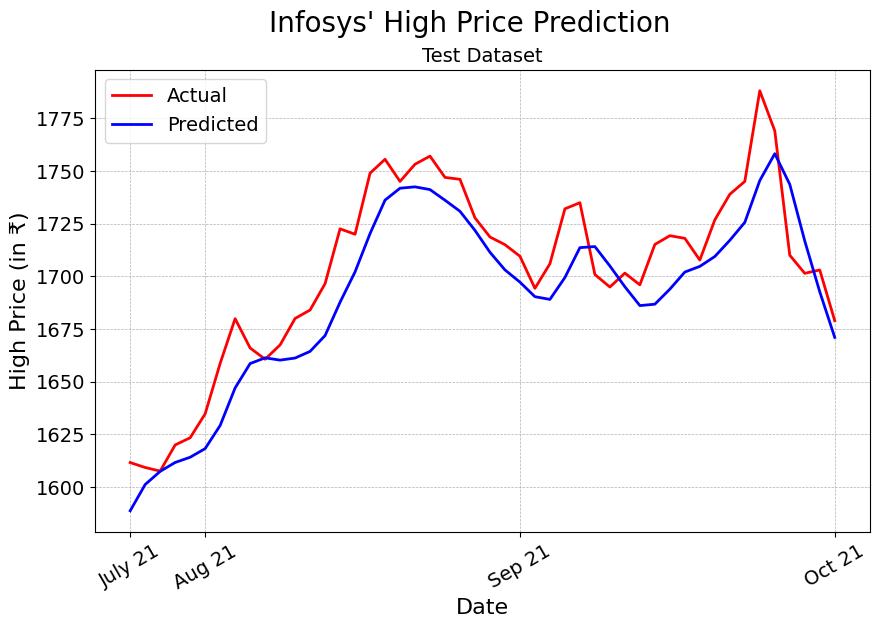

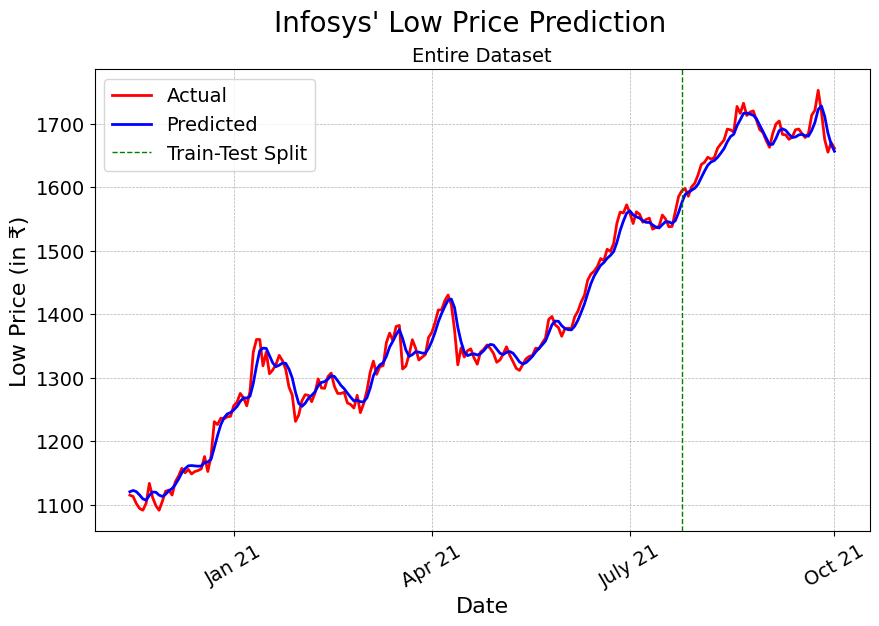

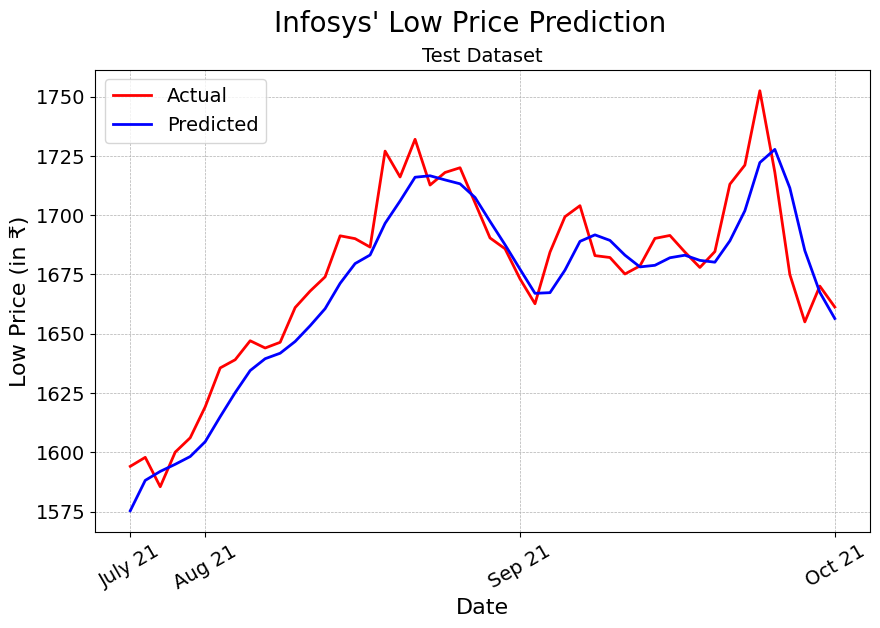

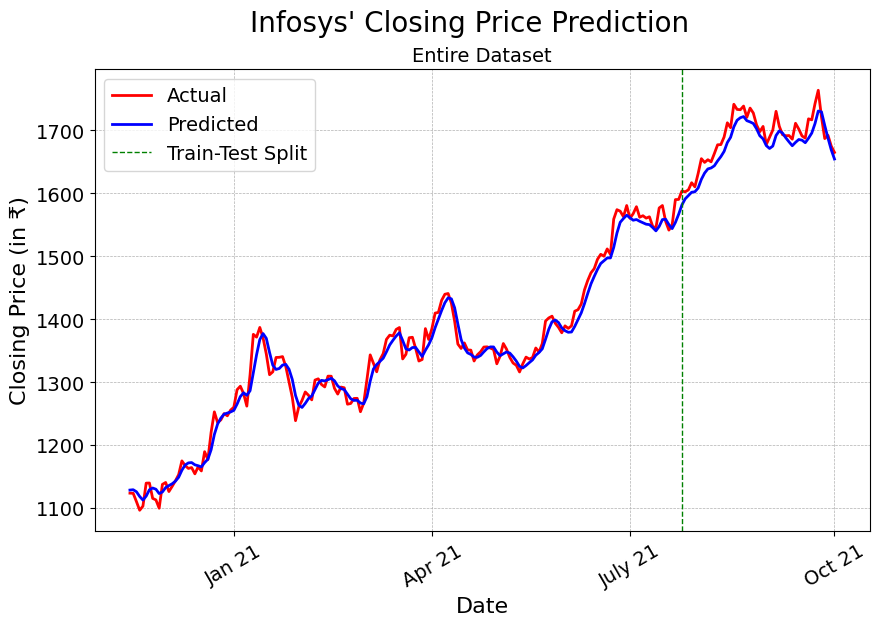

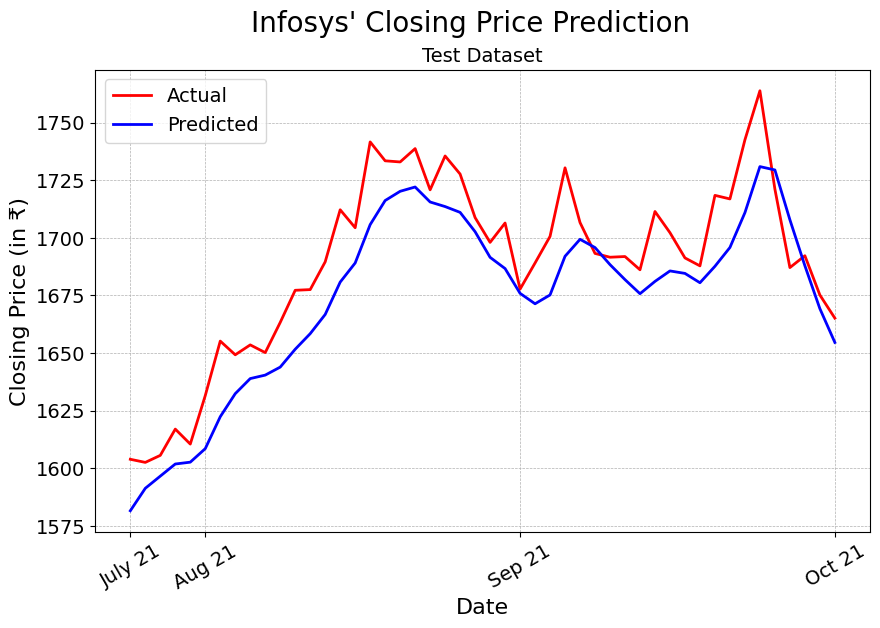

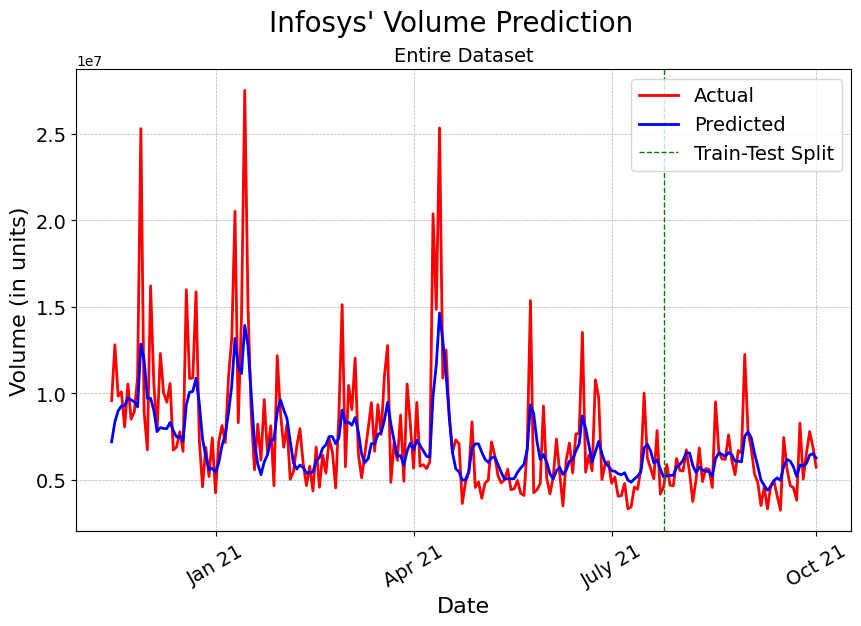

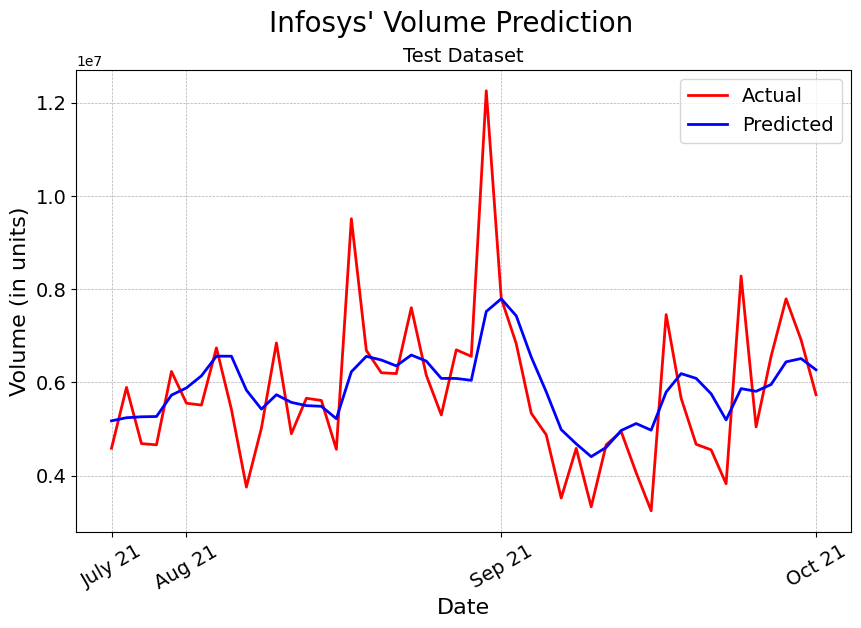

In [39]:
generate_predictions('Infosys', interval=30, n_epochs=100, save_fig = True)